In [2]:
## Initialzing and loading required libraries and subfunctions
import numpy as np
import matplotlib.pyplot as plt
import copy
import yasa
from mne.filter import resample
import pynapple as nap
import seaborn as sns
import pandas as pd
from sklearn.preprocessing import normalize
import requests
from io import BytesIO
import sails
import re
from scipy.stats import entropy

import scipy
from scipy import signal
from scipy.interpolate import griddata
from scipy.signal import correlate
from scipy.stats import pearsonr
from scipy.fft import fft
from scipy.spatial.distance import euclidean
from scipy.signal import spectrogram
from scipy.io import loadmat
import scipy.fft
import scipy.stats
import scipy.io as sio
from scipy.signal import hilbert

import emd as emd
import emd.sift as sift
import emd.spectra as spectra

from neurodsp.sim import sim_combined
from neurodsp.plts import plot_time_series, plot_timefrequency
from neurodsp.utils import create_times
from neurodsp.timefrequency.wavelets import compute_wavelet_transform
from neurodsp.filt import filter_signal

# Load required libraries
import numpy as np
from scipy.io import loadmat
from scipy.signal import hilbert
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
import seaborn as sns
from neurodsp.filt import filter_signal, filter_signal_fir, design_fir_filter
import emd
import pandas as pd
from sklearn.preprocessing import Normalizer
from tqdm import tqdm
import plotly.express as px
import copy
import umap.umap_ as umap
import skdim
from scipy.spatial import cKDTree
import pickle
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colors as mcolors
import matplotlib.ticker as ticker
from matplotlib.cm import ScalarMappable

## UTILS
from utils import *
from detect_pt import *

from scipy.io import loadmat
import numpy as np
from neurodsp.filt import filter_signal
import copy
import emd
from scipy.spatial import cKDTree
from tqdm import tqdm

sns.set(style='white', context='notebook')

In [3]:
path_to_hpc = '/Users/amir/Desktop/for Abdel/OS Basic/11/Rat-OS-Ephys_Rat11_SD4_OR_03-11-2018/2018-11-05_14-15-28_Post_Trial5/HPC_100_CH32_0.continuous.mat'
path_to_states = '/Users/amir/Desktop/for Abdel/OS Basic/11/Rat-OS-Ephys_Rat11_SD4_OR_03-11-2018/2018-11-05_14-15-28_Post_Trial5/2018-11-05_14-15-28_post_trial5-states.mat'

In [4]:
config = emd.sift.SiftConfig.from_yaml_file('/Users/amir/Desktop/for Abdel/emd_masksift_CA1_config_2500.yml')

In [4]:
lfpHPC, hypno, fs = get_data(path_to_hpc, path_to_states)

There was 0 in the dataset


In [5]:
def extract_pt_intervals(lfpHPC, hypno, fs=2500):
    targetFs = 500
    n_down = fs / targetFs
    start, end = get_start_end(hypno=hypno, sleep_state_id=5)
    rem_interval = nap.IntervalSet(start=start, end=end)
    fs = int(n_down * targetFs)
    t = np.arange(0, len(lfpHPC) / fs, 1 / fs)
    lfp = nap.TsdFrame(t=t, d=lfpHPC, columns=['HPC'])

    # Detect phasic intervals
    lfpHPC_down = preprocess(lfpHPC, n_down)
    phREM = detect_phasic(lfpHPC_down, hypno, targetFs)

    # Create phasic REM IntervalSet
    start, end = [], []
    for rem_idx in phREM:
        for s, e in phREM[rem_idx]:
            start.append(s / targetFs)
            end.append(e / targetFs)
    phasic_interval = nap.IntervalSet(start, end)

    # Calculate tonic intervals
    tonic_interval = rem_interval.set_diff(phasic_interval)
    print(f'Number of detected Tonic intrevals:{len(tonic_interval)}')
    # Apply a 100 ms duration threshold to tonic intervals
    min_duration = 0.1  # 100 ms in seconds
    durations = tonic_interval['end'] - tonic_interval['start']
    valid_intervals = durations >= min_duration
    tonic_interval = nap.IntervalSet(tonic_interval['start'][valid_intervals], tonic_interval['end'][valid_intervals])
    print(f'Number of detected Tonic intrevals after threshold:{len(tonic_interval)}')
    return phasic_interval, tonic_interval, lfp

In [21]:

phasic_interval, tonic_interval, lfp = extract_pt_intervals(lfpHPC, hypno)

Number of detected Tonic intrevals:54
Number of detected Tonic intrevals after threshold:54


In [6]:
def get_cycle_data(imf5, fs=2500):
    cycle_data = {"fs": None, 'theta_imf': None,
                       "IP": None, "IF": None, "IP": None, "cycles": None}


    # Get cycles using IP
    IP, IF, IA = emd.spectra.frequency_transform(imf5, fs, 'hilbert')
    C = emd.cycles.Cycles(IP)
    cycles = get_cycles_with_metrics(C, imf5, IA, IF)

    cycle_data['fs'] = fs
    cycle_data['theta_imf'] = imf5
    cycle_data['IP'] = IP
    cycle_data['IF'] = IF
    cycle_data['IA'] = IA
    cycle_data['cycles'] = cycles
    return cycle_data

In [7]:
def extract_imfs_by_pt_intervals(lfp, fs, interval, config, return_imfs_freqs=False):

    all_imfs = []
    all_imf_freqs = []
    rem_lfp = []
    all_masked_freqs = []
    for ii in range(len(interval)):
        start_idx = int(interval.loc[ii, 'start'] * fs)
        end_idx = int(interval.loc[ii, 'end'] * fs)
        sig_part = lfp[start_idx:end_idx]
        sig = np.array(sig_part)

        rem_lfp.append(sig)

        try:
            imf, mask_freq = sift.mask_sift(sig, **config)
        except Exception as e:
            print(f"EMD Sift failed: {e}. Skipping this interval.")
            continue
        all_imfs.append(imf)
        all_masked_freqs.append(mask_freq)

        imf_frequencies = imf_freq(imf, fs)
        all_imf_freqs.append(imf_frequencies)

    if return_imfs_freqs:
        return all_imfs, all_imf_freqs, rem_lfp
    else:
        return all_imfs

In [9]:
start, end = get_start_end(hypno=hypno, sleep_state_id=5)
rem_interval = nap.IntervalSet(start=start, end=end)

# Extract IMFs during REM sleep
rem_imfs, rem_imfs_freqs, rem_lpf = extract_imfs_by_pt_intervals(
    lfp, fs, rem_interval, config, return_imfs_freqs=True
)

In [22]:
tonic_imfs, tonic_imfs_freqs, tonic_rem_lpf = extract_imfs_by_pt_intervals(lfp, fs, tonic_interval, config, return_imfs_freqs=True)

In [23]:
phasic_imfs, phasic_imfs_freqs, rem_lpf = extract_imfs_by_pt_intervals(lfp, fs, phasic_interval, config, return_imfs_freqs=True)

In [8]:
def extract_cycle_info(imfs, imf_frequencies):

  all_FPPs = []
  all_cycles_se =[]
  all_cycles_ctrl = []

  theta_range = [5, 12]
  frequencies = np.arange(15, 141, 1)
  angles=np.linspace(-180,180,19)
  fs = 2500

  for idx, imf in enumerate(imfs):
    cycle_data = get_cycle_data(imf[:, 5], fs=2500)

    amp_thresh = np.percentile(cycle_data['IA'], 25) # higher than 25th percentile of the data
    lo_freq_duration = fs/5  # restrict the analysis to 5-12 Hz
    hi_freq_duration = fs/12

    conditions = ['is_good==1',
                        f'duration_samples<{lo_freq_duration}',
                        f'duration_samples>{hi_freq_duration}',
                        f'max_amp>{amp_thresh}']

    all_cycles = get_cycles_with_conditions(cycle_data['cycles'], conditions)

    subset_cycles_df = all_cycles.get_metric_dataframe(subset=True)
    subset_indices = subset_cycles_df['index'].values

    ctrl = emd.cycles.get_control_points(imf[:, 5], cycle_data['cycles'], mode='augmented')
    cycle_ctrls = get_cycle_ctrl(ctrl, subset_indices)
    all_cycles_ctrl.append(cycle_ctrls)
    all_cycles_inds = get_cycle_inds(all_cycles, subset_indices)
    cycles_inds = arrange_cycle_inds(all_cycles_inds)

    all_cycles_se.append(all_cycles_inds)

    freqs = imf_frequencies[idx]
    sub_theta, theta, supra_theta = tg_split(freqs, theta_range)
    supra_theta_sig = np.sum(imf.T[supra_theta], axis=0)

    # # Corrected Wavelet Transform Computation
    raw_data=sails.wavelet.morlet(supra_theta_sig, freqs=frequencies, sample_rate=fs, ncycles=5,ret_mode='power', normalise=None)
    supraPlot = scipy.stats.zscore(raw_data, axis=1)
    FPP = bin_tf_to_fpp(cycles_inds, supraPlot, bin_count=19)
    all_FPPs.append(FPP)

  return all_cycles_ctrl, all_cycles_se, all_FPPs

In [24]:
all_phasic_cycle_ctrls, all_phasic_cycles_se, all_phasic_FPPs = extract_cycle_info(phasic_imfs, phasic_imfs_freqs)
all_tonic_cycle_ctrls, all_tonic_cycles_se, all_tonic_FPPs = extract_cycle_info(tonic_imfs, tonic_imfs_freqs)

 Checking Cycles inputs - trimming singleton from input 'IP'


 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs 

In [30]:
print(type(all_phasic_cycle_ctrls))
print(type(all_tonic_cycle_ctrls[0]))
print(all_tonic_cycle_ctrls[0][0])

<class 'list'>
<class 'list'>
[  0 116 217 279 352 416]


In [15]:
frequencies = np.arange(15, 141, 1)
angles = np.linspace(-180, 180, 19)

In [20]:
FPP = all_phasic_FPPs[0]
all_cycles_inds = all_phasic_cycles_se[0]
all_cycles_ctrl = all_phasic_cycle_ctrls[0]
imf = phasic_imfs[0]
firstRemLFP = rem_lpf[0]

In [ ]:
n_rows, n_cols = 3, 3
max_plots = n_rows * n_cols

vmin = 0
vmax = 5

n_levels = 20
levels = np.linspace(np.min(FPP), np.max(FPP), n_levels)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 12))
plt.subplots_adjust(wspace=0.4, hspace=0.4)

for ii in range(min(len(FPP), max_plots)):
    ax = axes[ii // n_cols, ii % n_cols]

    # Create contourf plot with specified levels and normalization
    im = ax.contourf(angles, frequencies, FPP[ii], levels=levels, cmap='hot', vmin=vmin, vmax=vmax)

    ax.set_xlabel(r'Phase (Degrees)', fontsize=10)
    if ii % n_cols == 0:
        ax.set_ylabel(r'Frequency (Hz)', fontsize=10)

    ax.set_title(f"Cycle {ii+1}", fontsize=12)
    
    xinds = np.arange(len(all_cycles_inds[ii]))
    raw_lfp = firstRemLFP[all_cycles_inds[ii]]
    theta_part = imf[all_cycles_inds[ii], 5]

    phase_scaled_xinds = np.linspace(angles.min(), angles.max(), len(xinds))
    lfp_scaled_y = (raw_lfp / np.max(np.abs(raw_lfp))) * (frequencies.max() - frequencies.min()) / 2 + frequencies.mean()
    theta_scaled_y = (theta_part / np.max(np.abs(theta_part))) * (frequencies.max() - frequencies.min()) / 2 + frequencies.mean()

    # Plot raw LFP and IMF-6 on the current axis
    ax.plot(phase_scaled_xinds, lfp_scaled_y, color=[0.8, 0.8, 0.8], label='Raw LFP')
    ax.plot(phase_scaled_xinds, theta_scaled_y, color='orange', label='IMF-6')

    # Plot control points
    ctrl_points_x = np.interp(all_cycles_ctrl[ii], np.arange(len(xinds)), phase_scaled_xinds)
    ctrl_points_y = (theta_part[all_cycles_ctrl[ii]] / np.max(np.abs(theta_part))) * (frequencies.max() - frequencies.min()) / 2 + frequencies.mean()
    ax.scatter(ctrl_points_x, ctrl_points_y, color='red', marker='o', label='Control Points')

    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)

    cbar = fig.colorbar(ScalarMappable(norm=im.norm, cmap=im.cmap), cax=cax, ticks=range(vmin, vmax+5, 5))
    im.set_clim(vmin, vmax)
    cbar.set_ticks(np.linspace(vmin, vmax, 6))
    cbar.ax.tick_params(labelsize=8)
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import entropy
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.colors as mcolors
import matplotlib.ticker as ticker

vmin = 0
vmax = 5

for i in range(10):  
    angles = np.linspace(-180, 180, 19)
    fpp2 = FPP[i]  
    fpp2 = np.abs(fpp2)

    normalized_fpp2 = fpp2 / np.sum(fpp2)

    n_levels = 20
    levels = np.linspace(vmin, vmax, n_levels) 

    avg_fpp2 = np.sum(fpp2, axis=1)

    window_size = 5  
    smoothed_avg_fpp = np.convolve(avg_fpp2, np.ones(window_size)/window_size, mode='same')
    dist_smoothed_avg_fpp = smoothed_avg_fpp / np.sum(smoothed_avg_fpp)

    smoothed_avg_fpp_norm = (smoothed_avg_fpp - np.min(smoothed_avg_fpp)) / (np.max(smoothed_avg_fpp) - np.min(smoothed_avg_fpp))

    max_index = np.unravel_index(np.argmax(normalized_fpp2, axis=None), normalized_fpp2.shape)
    mode_frequency = frequencies[max_index[0]]
    mode_angle = angles[max_index[1]]

    shannon_entropy = entropy(smoothed_avg_fpp_norm.flatten(), base=2)

    # Plotting
    fig, ax = plt.subplots(figsize=(12, 8))

    contour = ax.contourf(angles, frequencies, fpp2, levels=levels, cmap='hot', vmin=vmin, vmax=vmax)

    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)

    cbar = fig.colorbar(contour, cax=cax)

    cbar.set_ticks(np.linspace(vmin, vmax, 6))  

    cbar.set_label('Normalized Power')
    cbar.ax.tick_params(labelsize=8)

    scaled_profile = smoothed_avg_fpp_norm * (angles[-1] - angles[0]) + angles[0]
    ax.plot(scaled_profile, frequencies, color='white', linewidth=2)

    ax.axhline(mode_frequency, color='white', linestyle='--', linewidth=1)

    ax.set_xlabel('Phase (Degree)')
    ax.set_ylabel('Frequency (Hz)')
    ax.set_xlim(angles[0], angles[-1])
    ax.set_ylim(frequencies[0], frequencies[-1])

    ax.set_title(f"Cycle {i+1}: Normalized power - Mode frequency: {int(mode_frequency)} Hz - Entropy: {shannon_entropy:.4f}")

    plt.tight_layout()
    #plt.savefig(f"cycle_{i+1}_avg_spectrogram_plot.svg", format='svg')
    plt.show()

In [28]:
FPP = all_phasic_FPPs[0]
all_cycles_inds = all_phasic_cycles_se[0]
imf = phasic_imfs[0]
firstRemLFP = rem_lpf[0]
imf_frequencies_for_segment = phasic_imfs_freqs[0]

Step 2: Pipeline finished. Generating the plot...


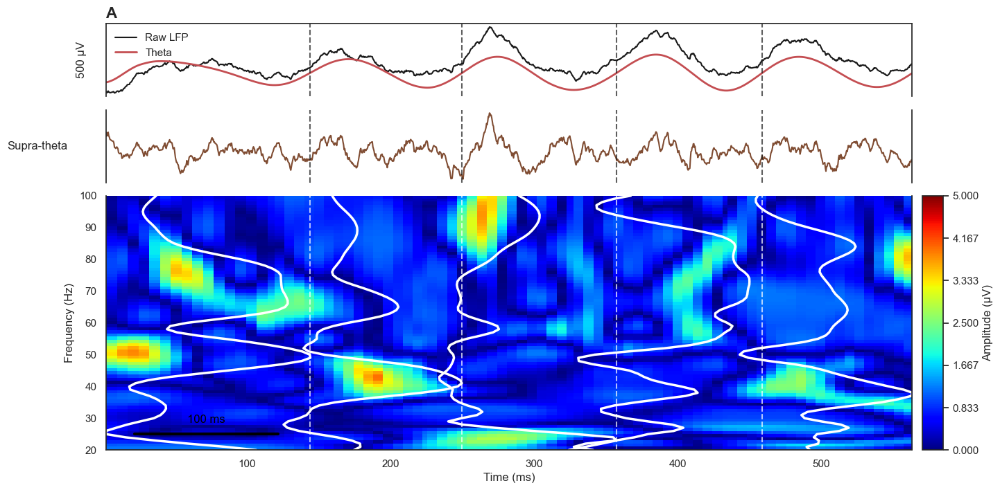

In [31]:
from matplotlib.gridspec import GridSpec
# --- Explicitly calculate the required signals for plotting ---
# Theta IMF is the 6th component (index 5) as used in `extract_cycle_info`
theta_imf_sig = imf[:, 5]

# Supra-theta signal is the sum of other IMFs, as calculated in `extract_cycle_info`
theta_range = [5, 12]
_, _, supra_theta_imf_indices = tg_split(imf_frequencies_for_segment, theta_range)
supra_theta_sig = np.sum(imf[:, supra_theta_imf_indices], axis=1)

print("Step 2: Pipeline finished. Generating the plot...")


# --- Part 2: Plot Generation (Recreating Panel A) ---

# Plotting parameters
n_cycles_to_plot = 5  # As shown in the example figure
frequencies = np.arange(20, 101, 1) # Match the y-axis of the FPP from the figure
times_vec = np.arange(len(firstRemLFP)) / fs

# Set up the figure and axes using GridSpec
fig = plt.figure(figsize=(15, 8))
# Ratios: Raw LFP (1), Supra-theta (1), FPP plot (3.5)
gs = GridSpec(3, 1, height_ratios=[1, 1, 3.5], hspace=0.1)

ax_raw = fig.add_subplot(gs[0])
ax_supra = fig.add_subplot(gs[1], sharex=ax_raw)
ax_fpp = fig.add_subplot(gs[2], sharex=ax_raw)

# Determine the time range to plot based on the selected cycles
start_sample = all_cycles_inds[0][0]
end_sample = all_cycles_inds[n_cycles_to_plot-1][-1]
time_vec_ms = times_vec[start_sample:end_sample] * 1000

# 1. Plot Raw LFP and Theta IMF
ax_raw.plot(time_vec_ms, firstRemLFP[start_sample:end_sample], color='k', lw=1.5, label='Raw LFP')
ax_raw.plot(time_vec_ms, theta_imf_sig[start_sample:end_sample], color='r', lw=2, label='Theta')
ax_raw.set_ylabel('500 µV', labelpad=20) # Use text label like figure
ax_raw.set_yticks([]) # Hide y-axis ticks
ax_raw.legend(loc='upper left', frameon=False)
ax_raw.set_title('A', loc='left', fontsize=16, fontweight='bold')


# 2. Plot Supra-theta signal
ax_supra.plot(time_vec_ms, supra_theta_sig[start_sample:end_sample], color=(0.5, 0.3, 0.2), lw=1.5)
ax_supra.set_ylabel('Supra-theta', rotation=0, ha='right', va='center', labelpad=40)
ax_supra.set_yticks([])

# 3. Plot the sequence of FPPs and white spectral profiles
cmap = 'jet'
vmin, vmax = 0, 5 # From the colorbar in the original image

for i in range(n_cycles_to_plot):
    cycle_indices = all_cycles_inds[i]
    
    start_time_ms = cycle_indices[0] / fs * 1000
    end_time_ms = cycle_indices[-1] / fs * 1000

    # The FPP from your pipeline has shape (n_freqs, n_phase_bins)
    # The frequencies in the FPP are from 15 to 140 Hz. We'll plot 20-100Hz.
    fpp_freqs_full = np.arange(15, 141, 1)
    plot_freq_mask = (fpp_freqs_full >= 20) & (fpp_freqs_full <= 100)
    current_fpp_full = FPP[i]

    # Ensure to use the absolute value for power as shown in the sample
    current_fpp_to_plot = np.abs(current_fpp_full[plot_freq_mask, :])

    im = ax_fpp.imshow(current_fpp_to_plot, aspect='auto', origin='lower',
                       extent=[start_time_ms, end_time_ms, frequencies[0], frequencies[-1]],
                       cmap=cmap, vmin=vmin, vmax=vmax)
    
    # --- Calculate and plot the white spectral profile line ---
    # This logic is adapted from your provided snippet.
    fpp2 = np.abs(current_fpp_full)
    avg_fpp2 = np.sum(fpp2, axis=1) # Sum across phase bins
    
    window_size = 5  
    smoothed_avg_fpp = np.convolve(avg_fpp2, np.ones(window_size)/window_size, mode='same')
    
    # Normalize to a 0-1 range for scaling
    min_val, max_val = np.min(smoothed_avg_fpp), np.max(smoothed_avg_fpp)
    norm_profile = (smoothed_avg_fpp - min_val) / (max_val - min_val + 1e-9)
                   
    # Scale to the time window of the current cycle
    scaled_time_profile = norm_profile * (end_time_ms - start_time_ms) + start_time_ms
    
    # Plot only the part of the profile within the desired frequency range
    ax_fpp.plot(scaled_time_profile[plot_freq_mask], fpp_freqs_full[plot_freq_mask], color='white', linewidth=2.5)
    
    # Draw vertical dashed lines to separate cycles
    if i < n_cycles_to_plot - 1:
        line_pos = end_time_ms
        ax_raw.axvline(line_pos, color='k', linestyle='--', lw=1.5, alpha=0.7)
        ax_supra.axvline(line_pos, color='k', linestyle='--', lw=1.5, alpha=0.7)
        ax_fpp.axvline(line_pos, color='white', linestyle='--', lw=1.5, alpha=0.7)

# --- Final Formatting ---
ax_fpp.set_ylabel('Frequency (Hz)')
ax_fpp.set_xlabel('Time (ms)')
ax_fpp.set_ylim(frequencies[0], frequencies[-1])

# Hide x-axis labels from the top two plots
plt.setp(ax_raw.get_xticklabels(), visible=False)
plt.setp(ax_supra.get_xticklabels(), visible=False)
ax_raw.spines['bottom'].set_visible(False)
ax_supra.spines['top'].set_visible(False)
ax_supra.spines['bottom'].set_visible(False)
ax_fpp.spines['top'].set_visible(False)

# Add a colorbar for the FPP
cax = fig.add_axes([ax_fpp.get_position().x1 + 0.01, ax_fpp.get_position().y0, 0.02, ax_fpp.get_position().height])
cbar = plt.colorbar(im, cax=cax)
cbar.set_label('Amplitude (µV)')
cbar.set_ticks(np.linspace(vmin, vmax, 7)) # Adjust ticks as needed

# Set the overall x-axis limit
ax_fpp.set_xlim(time_vec_ms[0], time_vec_ms[-1])

# Add 100 ms scale bar
scale_bar_y = ax_fpp.get_ylim()[0] + 5
ax_fpp.plot([time_vec_ms[0]+20, time_vec_ms[0] + 120], [scale_bar_y, scale_bar_y], color='black', lw=3)
ax_fpp.text(time_vec_ms[0] + 70, scale_bar_y + 3, '100 ms', color='black', ha='center', va='bottom', fontsize=12)

plt.show()

In [32]:

# --- **MODIFIED ANALYSIS FUNCTION FOR HIGHER RESOLUTION** ---
def extract_cycle_info_high_res(imfs, imf_frequencies, time_bins=100):
    """
    Modified version of your function to increase FPP resolution.
    The `bin_count` is now a parameter `time_bins`.
    """
    all_FPPs = []
    all_cycles_se = []
    all_cycles_ctrl = []

    theta_range = [5, 12]
    frequencies = np.arange(15, 141, 1) # This frequency resolution is good.
    fs = 2500

    for idx, imf in enumerate(imfs):
        cycle_data = get_cycle_data(imf[:, 5], fs=2500)
        amp_thresh = np.percentile(cycle_data['IA'], 25)
        lo_freq_duration = fs / 5
        hi_freq_duration = fs / 17
        conditions = [
            'is_good==1',
            f'duration_samples<{lo_freq_duration}',
            f'duration_samples>{hi_freq_duration}',
            f'max_amp>{amp_thresh}'
        ]
        all_cycles = get_cycles_with_conditions(cycle_data['cycles'], conditions)
        subset_cycles_df = all_cycles.get_metric_dataframe(subset=True)
        subset_indices = subset_cycles_df['index'].values
        ctrl = emd.cycles.get_control_points(imf[:, 5], cycle_data['cycles'], mode='augmented')
        all_cycles_ctrl.append(get_cycle_ctrl(ctrl, subset_indices))
        all_cycles_inds = get_cycle_inds(all_cycles, subset_indices)
        cycles_inds = arrange_cycle_inds(all_cycles_inds)
        all_cycles_se.append(all_cycles_inds)

        freqs = imf_frequencies[idx]
        _, _, supra_theta = tg_split(freqs, theta_range)
        supra_theta_sig = np.sum(imf.T[supra_theta], axis=0)

        raw_data = sails.wavelet.morlet(supra_theta_sig, freqs=frequencies, sample_rate=fs, ncycles=5, ret_mode='power', normalise=None)
        supraPlot = scipy.stats.zscore(raw_data, axis=1) # The data is z-scored
        
        # **KEY CHANGE HERE**: Using higher bin_count for better resolution
        FPP = bin_tf_to_fpp(cycles_inds, supraPlot, bin_count=time_bins)
        all_FPPs.append(FPP)

    return all_cycles_ctrl, all_cycles_se, all_FPPs


In [34]:
# **Call the new high-resolution function**
all_phasic_cycle_ctrls, all_phasic_cycles_se, all_phasic_FPPs = extract_cycle_info_high_res(
    phasic_imfs, phasic_imfs_freqs, time_bins=100 # Requesting 100 bins per cycle
)

 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs 

Step 2: Pipeline finished. Generating the corrected plot...


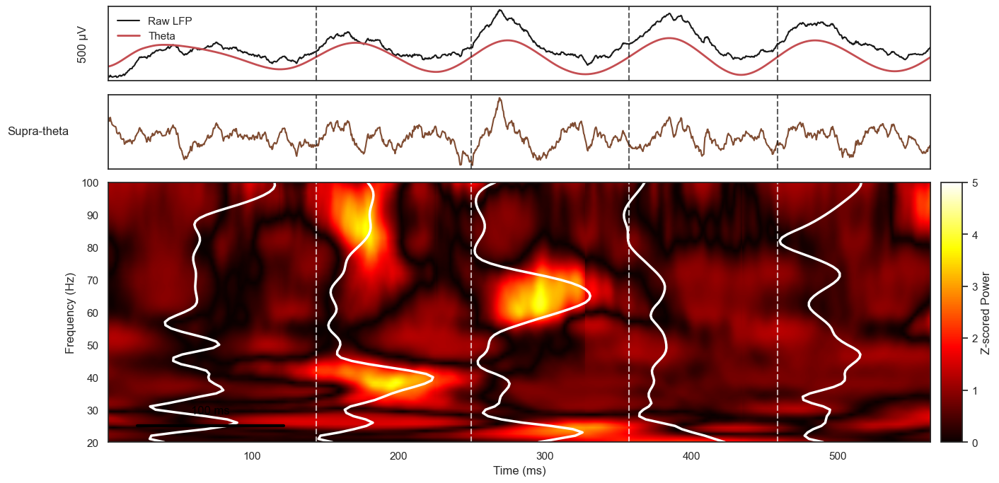

In [38]:
FPP = all_phasic_FPPs[4]
all_cycles_inds = all_phasic_cycles_se[0]
imf = phasic_imfs[0]
firstRemLFP = rem_lpf[0]
imf_frequencies_for_segment = phasic_imfs_freqs[0]
theta_imf_sig = imf[:, 5]
_, _, supra_theta_imf_indices = tg_split(imf_frequencies_for_segment, [5, 12])
supra_theta_sig = np.sum(imf[:, supra_theta_imf_indices], axis=1)

print("Step 2: Pipeline finished. Generating the corrected plot...")

# --- Part 2: Corrected Plot Generation ---
n_cycles_to_plot = 5
plot_frequencies = np.arange(20, 101, 1)
times_vec = np.arange(len(firstRemLFP)) / fs

fig = plt.figure(figsize=(15, 8))
gs = GridSpec(3, 1, height_ratios=[1, 1, 3.5], hspace=0.1)
ax_raw = fig.add_subplot(gs[0])
ax_supra = fig.add_subplot(gs[1], sharex=ax_raw)
ax_fpp = fig.add_subplot(gs[2], sharex=ax_raw)

start_sample = all_cycles_inds[0][0]
end_sample = all_cycles_inds[n_cycles_to_plot-1][-1]
time_vec_ms = times_vec[start_sample:end_sample] * 1000

# Plot signals (same as before)
ax_raw.plot(time_vec_ms, firstRemLFP[start_sample:end_sample], color='k', lw=1.5)
ax_raw.plot(time_vec_ms, theta_imf_sig[start_sample:end_sample], color='r', lw=2)
ax_supra.plot(time_vec_ms, supra_theta_sig[start_sample:end_sample], color=(0.5, 0.3, 0.2), lw=1.5)
# ... formatting for top plots ...
ax_raw.set_ylabel('500 µV', labelpad=20); ax_raw.set_yticks([])
ax_raw.legend(['Raw LFP', 'Theta'], loc='upper left', frameon=False)
ax_supra.set_ylabel('Supra-theta', rotation=0, ha='right', va='center', labelpad=40); ax_supra.set_yticks([])


# **UPDATED** FPP plotting loop
# **CHANGE 1: Use 'hot' colormap and corrected vmin/vmax for z-scored data**
cmap = 'hot'
vmin, vmax = 0, 5 # Appropriate for z-scored power

for i in range(n_cycles_to_plot):
    cycle_indices = all_cycles_inds[i]
    start_time_ms = cycle_indices[0] / fs * 1000
    end_time_ms = cycle_indices[-1] / fs * 1000

    fpp_freqs_full = np.arange(15, 141, 1)
    plot_freq_mask = (fpp_freqs_full >= 20) & (fpp_freqs_full <= 100)
    current_fpp_full = FPP[i]
    current_fpp_to_plot = np.abs(current_fpp_full[plot_freq_mask, :])

    # **CHANGE 2: Add interpolation for a smoother visual appearance**
    im = ax_fpp.imshow(current_fpp_to_plot, aspect='auto', origin='lower',
                       extent=[start_time_ms, end_time_ms, plot_frequencies[0], plot_frequencies[-1]],
                       cmap=cmap, vmin=vmin, vmax=vmax, interpolation='bilinear')

    # --- **CHANGE 3: Corrected scaling for the white spectral profile** ---
    fpp2 = np.abs(current_fpp_full)
    avg_spectral_profile = np.sum(fpp2, axis=1)
    
    window_size = 5
    smoothed_profile = np.convolve(avg_spectral_profile, np.ones(window_size)/window_size, mode='same')
    
    norm_profile = (smoothed_profile - np.min(smoothed_profile)) / (np.max(smoothed_profile) - np.min(smoothed_profile) + 1e-9)
    
    # Define the width of the profile as a fraction of the cycle duration (e.g., 60%)
    cycle_duration_ms = end_time_ms - start_time_ms
    profile_display_width = cycle_duration_ms * 0.6  # <-- Adjust this fraction as needed
    
    # Center the profile within its cycle
    profile_start_ms = start_time_ms + (cycle_duration_ms - profile_display_width) / 2
    
    # Scale the normalized profile to this new, smaller width
    scaled_time_profile = norm_profile * profile_display_width + profile_start_ms
    
    ax_fpp.plot(scaled_time_profile[plot_freq_mask], fpp_freqs_full[plot_freq_mask], color='white', linewidth=2.5)
    
    if i < n_cycles_to_plot - 1:
        line_pos = end_time_ms
        ax_raw.axvline(line_pos, color='k', linestyle='--', lw=1.5, alpha=0.7)
        ax_supra.axvline(line_pos, color='k', linestyle='--', lw=1.5, alpha=0.7)
        ax_fpp.axvline(line_pos, color='white', linestyle='--', lw=1.5, alpha=0.7)

# --- Final Formatting (Adjusted) ---
ax_fpp.set_ylabel('Frequency (Hz)')
ax_fpp.set_xlabel('Time (ms)')
ax_fpp.set_ylim(plot_frequencies[0], plot_frequencies[-1])
plt.setp(ax_raw.get_xticklabels(), visible=False)
plt.setp(ax_supra.get_xticklabels(), visible=False)

cax = fig.add_axes([ax_fpp.get_position().x1 + 0.01, ax_fpp.get_position().y0, 0.02, ax_fpp.get_position().height])
cbar = plt.colorbar(im, cax=cax)
cbar.set_label('Z-scored Power') # Updated label
cbar.set_ticks(np.linspace(vmin, vmax, 6))

ax_fpp.set_xlim(time_vec_ms[0], time_vec_ms[-1])

scale_bar_y = ax_fpp.get_ylim()[0] + 5
ax_fpp.plot([time_vec_ms[0]+20, time_vec_ms[0] + 120], [scale_bar_y, scale_bar_y], color='black', lw=3)
ax_fpp.text(time_vec_ms[0] + 70, scale_bar_y + 3, '100 ms', color='black', ha='center', va='bottom', fontsize=12)

plt.show()

In [43]:
# Call the original function
all_phasic_cycle_ctrls, all_phasic_cycles_se, all_phasic_FPPs = extract_cycle_info(
    phasic_imfs, phasic_imfs_freqs
)

 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs - trimming singleton from input 'IP'
 Checking Cycles inputs 

Step 2: Pipeline finished. Generating the final plot...


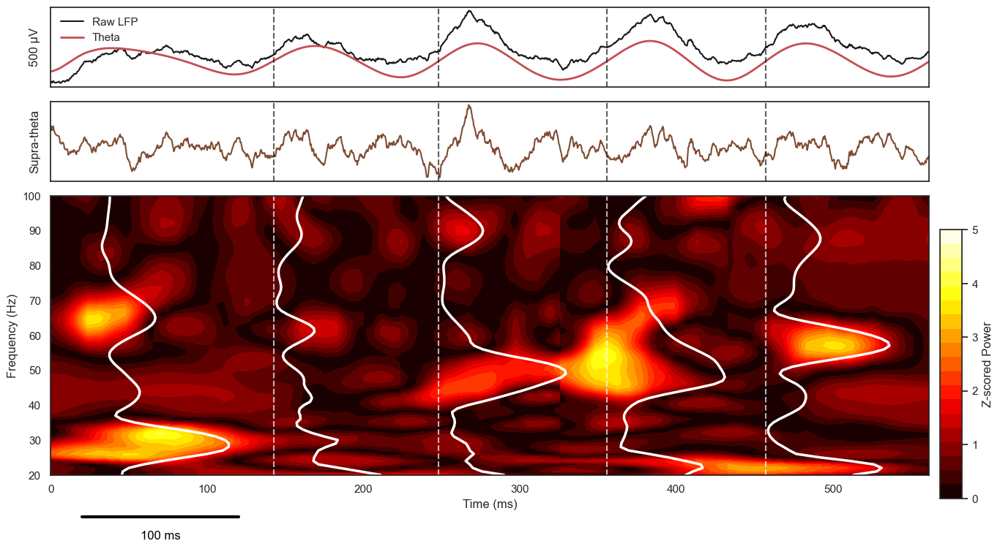

In [60]:
# --- Part 1: Data Preparation (Your existing code) ---
# ... (This part is correct and remains the same) ...

# For reproducibility, I'll redefine the variables you set up.
FPP = all_phasic_FPPs[1]
all_cycles_inds = all_phasic_cycles_se[0]
imf = phasic_imfs[0]
firstRemLFP = rem_lpf[0]
imf_frequencies_for_segment = phasic_imfs_freqs[0]
theta_imf_sig = imf[:, 5]
_, _, supra_theta_imf_indices = tg_split(imf_frequencies_for_segment, [5, 12])
supra_theta_sig = np.sum(imf[:, supra_theta_imf_indices], axis=1)

print("Step 2: Pipeline finished. Generating the final plot...")

# --- Part 2: Plot Generation (with fixes) ---
n_cycles_to_plot = 5
plot_frequencies = np.arange(20, 101, 1)
times_vec = np.arange(len(firstRemLFP)) / fs

fig = plt.figure(figsize=(15, 8))
gs = GridSpec(3, 1, height_ratios=[1, 1, 3.5], hspace=0.1)
ax_raw = fig.add_subplot(gs[0])
ax_supra = fig.add_subplot(gs[1], sharex=ax_raw)
ax_fpp = fig.add_subplot(gs[2], sharex=ax_raw)

# Time normalization (This part is correct and remains the same)
start_sample = all_cycles_inds[0][0]
end_sample = all_cycles_inds[n_cycles_to_plot-1][-1]
time_offset_ms = (start_sample / fs) * 1000
time_vec_ms = (times_vec[start_sample:end_sample] * 1000) - time_offset_ms

# Plot signals
ax_raw.plot(time_vec_ms, firstRemLFP[start_sample:end_sample], color='k', lw=1.5)
ax_raw.plot(time_vec_ms, theta_imf_sig[start_sample:end_sample], color='r', lw=2)
ax_supra.plot(time_vec_ms, supra_theta_sig[start_sample:end_sample], color=(0.5, 0.3, 0.2), lw=1.5)

ax_raw.set_ylabel('500 µV', labelpad=10); ax_raw.set_yticks([])
ax_raw.legend(['Raw LFP', 'Theta'], loc='upper left', frameon=False)

# --- **FIX 1: Supra-theta label** ---
# Remove rotation=0 to make it vertical again. Adjust labelpad for positioning.
ax_supra.set_ylabel('Supra-theta', labelpad=10); ax_supra.set_yticks([])

# FPP plotting loop (This part is correct and remains the same)
cmap = 'hot'
vmin, vmax = 0, 5
n_levels = 20
levels = np.linspace(vmin, vmax, n_levels)

for i in range(n_cycles_to_plot):
    cycle_indices = all_cycles_inds[i]
    start_time_ms = (cycle_indices[0] / fs * 1000) - time_offset_ms
    end_time_ms = (cycle_indices[-1] / fs * 1000) - time_offset_ms
    fpp_freqs_full = np.arange(15, 141, 1)
    plot_freq_mask = (fpp_freqs_full >= 20) & (fpp_freqs_full <= 100)
    current_fpp_full = FPP[i]
    current_fpp_to_plot = np.abs(current_fpp_full[plot_freq_mask, :])
    time_bins_x = np.linspace(start_time_ms, end_time_ms, 19)
    freqs_y = plot_frequencies
    T, F = np.meshgrid(time_bins_x, freqs_y)
    im = ax_fpp.contourf(T, F, current_fpp_to_plot, levels=levels, cmap=cmap, vmin=vmin, vmax=vmax)
    fpp2 = np.abs(current_fpp_full)
    avg_spectral_profile = np.sum(fpp2, axis=1)
    window_size = 5
    smoothed_profile = np.convolve(avg_spectral_profile, np.ones(window_size)/window_size, mode='same')
    norm_profile = (smoothed_profile - np.min(smoothed_profile)) / (np.max(smoothed_profile) - np.min(smoothed_profile) + 1e-9)
    cycle_duration_ms = end_time_ms - start_time_ms
    profile_display_width = cycle_duration_ms * 0.6
    profile_start_ms = start_time_ms + (cycle_duration_ms - profile_display_width) / 2
    scaled_time_profile = norm_profile * profile_display_width + profile_start_ms
    ax_fpp.plot(scaled_time_profile[plot_freq_mask], fpp_freqs_full[plot_freq_mask], color='white', linewidth=2.5)
    if i < n_cycles_to_plot - 1:
        line_pos = end_time_ms
        ax_raw.axvline(line_pos, color='k', linestyle='--', lw=1.5, alpha=0.7)
        ax_supra.axvline(line_pos, color='k', linestyle='--', lw=1.5, alpha=0.7)
        ax_fpp.axvline(line_pos, color='white', linestyle='--', lw=1.5, alpha=0.7)

# --- Final Formatting ---
ax_fpp.set_ylabel('Frequency (Hz)')
ax_fpp.set_xlabel('Time (ms)')
ax_fpp.set_ylim(plot_frequencies[0], plot_frequencies[-1])
ax_fpp.set_xlim(0, time_vec_ms[-1])
plt.setp(ax_raw.get_xticklabels(), visible=False)
plt.setp(ax_supra.get_xticklabels(), visible=False)

cax = fig.add_axes([ax_fpp.get_position().x1 + 0.01, ax_fpp.get_position().y0, 0.02, ax_fpp.get_position().height])
cbar = plt.colorbar(im, cax=cax)
cbar.set_label('Z-scored Power')
cbar.set_ticks(np.linspace(vmin, vmax, 6))

# --- **FIX 2: Scale bar positioning** ---
# The transform code is correct, but we will use a more reliable layout adjustment.
bar_start_x = 20
bar_end_x = bar_start_x + 100
bar_y_position = -0.15

ax_fpp.plot([bar_start_x, bar_end_x], [bar_y_position, bar_y_position],
            color='black', lw=3, transform=ax_fpp.get_xaxis_transform(), clip_on=False)
ax_fpp.text((bar_start_x + bar_end_x) / 2, bar_y_position - 0.05, '100 ms',
            color='black', ha='center', va='top', fontsize=12,
            transform=ax_fpp.get_xaxis_transform(), clip_on=False)

# Use subplots_adjust for reliable spacing instead of tight_layout's rect
plt.subplots_adjust(left=0.1, right=0.9, top=0.95, bottom=0.15)

plt.savefig('panel_a_fig2.pdf', dpi=300, format='pdf')

plt.show()

# panel B

## Avg spectural signiture for OS Basic

In [8]:
# version 1

def prepare_data_for_sa(imfs, imf_frequencies):

  all_FPPs = []

  theta_range = [5, 12]
  frequencies = np.arange(15, 141, 1)
  angles=np.linspace(-180,180,19)
  fs = 2500

  for idx, imf in enumerate(imfs):
    cycle_data = get_cycle_data(imf[:, 5], fs=2500)

    amp_thresh = np.percentile(cycle_data['IA'], 25) # higher than 25th percentile of the data
    lo_freq_duration = fs/5  # restrict the analysis to 5-12 Hz
    hi_freq_duration = fs/12

    conditions = ['is_good==1',
                        f'duration_samples<{lo_freq_duration}',
                        f'duration_samples>{hi_freq_duration}',
                        f'max_amp>{amp_thresh}']
    print(len(cycle_data['theta_imf']))
    all_cycles = get_cycles_with_conditions(cycle_data['cycles'], conditions)
    if all_cycles is None or all_cycles.chain_vect.size == 0:
        print(f"No valid cycles found for the current interval. Skipping...")
        continue
    
    # Check if any cycles satisfy the conditions - HERE CAN BE CHANGED
    if all_cycles is None or all_cycles.chain_vect.size == 0:
        print("No cycles satisfy the conditions.")
        return pd.DataFrame(), pd.DataFrame(), []
    
    subset_cycles_df = all_cycles.get_metric_dataframe(subset=True)
    subset_indices = subset_cycles_df['index'].values

    all_cycles_inds = get_cycle_inds(all_cycles, subset_indices)
    cycles_inds = arrange_cycle_inds(all_cycles_inds)

    freqs = imf_frequencies[idx]
    _, _, supra_theta = tg_split(freqs, theta_range)
    supra_theta_sig = np.sum(imf.T[supra_theta], axis=0)

    # # Corrected Wavelet Transform Computation
    raw_data=sails.wavelet.morlet(supra_theta_sig, freqs=frequencies, sample_rate=fs, ncycles=5,ret_mode='power', normalise=None)
    supraPlot = scipy.stats.zscore(raw_data, axis=1)
    FPP = bin_tf_to_fpp(cycles_inds, supraPlot, bin_count=19)
    all_FPPs.append(FPP)

  return all_FPPs

In [9]:
def extract_data_for_rat(rat_id):
    # Define the base path to OS Basic datasets
    base_path = '/Users/amir/Desktop/for Abdel/OS Basic'
    fs = 2500  # Sample frequency

    # Initialize empty DataFrames for concatenation across all recordings and trials for the specified rat
    all_phasic_FPPs = []
    all_tonic_FPPs = []

    rat_path = os.path.join(base_path, str(rat_id))

    # Check if the specified rat folder exists
    if not os.path.isdir(rat_path):
        print(f"Rat folder {rat_id} does not exist.")
        return None, None

    # List all recording folders in the rat directory
    recording_folders = [
        f for f in os.listdir(rat_path)
        if os.path.isdir(os.path.join(rat_path, f))
    ]

    if not recording_folders:
        print(f"No recording folders found for Rat {rat_id}.")
        return None, None

    # Loop over each recording folder
    for recording_folder in recording_folders:
        print(f"Processing recording folder: {recording_folder}")
        recording_path = os.path.join(rat_path, recording_folder)

        # Use regular expressions to parse the folder name
        match = re.match(r'^Rat-OS-Ephys_(Rat\d+)_SD(\d+)_([\w-]+)_([\d-]+)$', recording_folder)
        if not match:
            print(f"Unexpected folder name format: {recording_folder}. Skipping...")
            continue

        rat_id_part = match.group(1)       # e.g., 'Rat6'
        sd_number = match.group(2)         # e.g., '4'
        condition = match.group(3)         # e.g., 'CON'
        date_part = match.group(4)         # e.g., '22-02-2018'

        rat_id_from_folder = ''.join(filter(str.isdigit, rat_id_part))

        # Check if rat_id_from_folder matches rat_id
        if rat_id_from_folder != str(rat_id):
            print(f"Rat ID mismatch in folder {recording_folder}. Expected Rat{rat_id}, found Rat{rat_id_from_folder}. Skipping...")
            continue

        # Detect all trial folders and filter for post_trial2 to post_trial5, considering various folder name formats
        trial_folders = [
            f for f in os.listdir(recording_path)
            if os.path.isdir(os.path.join(recording_path, f)) and
            re.search(r'(?i)post[\-_]?trial[\-_]?([2-5])', f)
        ]

        if not trial_folders:
            print(f"No trial folders found in {recording_folder}.")
            continue

        for trial_folder in trial_folders:
            print(f"Processing trial folder: {trial_folder}")
            trial_path = os.path.join(recording_path, trial_folder)

            # Search for LFP and state files in the trial folder
            lfp_file = None
            state_file = None

            for file_name in os.listdir(trial_path):
                if 'HPC' in file_name and file_name.endswith('.mat'):
                    lfp_file = os.path.join(trial_path, file_name)
                elif 'states' in file_name and file_name.endswith('.mat'):
                    state_file = os.path.join(trial_path, file_name)
                elif 'States' in file_name and file_name.endswith('.mat'):
                    state_file = os.path.join(trial_path, file_name)

            # Ensure both LFP and state files were found
            if not lfp_file or not state_file:
                print(f"Missing LFP or state file in {trial_path}. Skipping...")
                continue

            # Extract trial number from folder name
            trial_number_match = re.search(r'(?i)post[\-_]?trial[\-_]?([2-5])', trial_folder)
            if trial_number_match:
                trial_number = int(trial_number_match.group(1))
            else:
                print(f"Unable to extract trial number from folder name: {trial_folder}. Skipping...")
                continue

            # Load data using custom functions
            try:
                lfpHPC, hypno, _ = get_data(lfp_file, state_file)

                # Extract phasic and tonic intervals, handling cases with no REM sleep
                try:
                    phasic_interval, tonic_interval, lfp = extract_pt_intervals(lfpHPC, hypno)
                except ValueError as e:
                    print(f"No REM sleep found in {trial_folder} for Rat {rat_id}, Condition {condition}. Filling with empty intervals.")
                    phasic_interval, tonic_interval, lfp = [[], [], []]

                # Extract IMFs and frequencies for phasic and tonic intervals if intervals are not empty
                if phasic_interval and tonic_interval:
                    # Assume 'config' is defined elsewhere in your code
                    tonic_imfs, tonic_freqs, tonic_lpf = extract_imfs_by_pt_intervals(
                        lfp, fs, tonic_interval, config, return_imfs_freqs=True)
                    phasic_imfs, phasic_freqs, phasic_lpf = extract_imfs_by_pt_intervals(
                        lfp, fs, phasic_interval, config, return_imfs_freqs=True)

                    # Prepare UMAP data for both phasic and tonic
                    phasic_FPPs = prepare_data_for_sa(phasic_imfs, phasic_freqs)
                    tonic_FPPs = prepare_data_for_sa(tonic_imfs, tonic_freqs)

                    # Concatenate into combined DataFrames
                    all_phasic_FPPs.extend(phasic_FPPs)
                    all_tonic_FPPs.extend(tonic_FPPs)

            except FileNotFoundError:
                print(f"Data not found in {trial_path}. Skipping...")

    return all_phasic_FPPs, all_tonic_FPPs

In [11]:
# List of rat IDs to process
rat_ids = [1, 3, 4, 6, 9, 11, 13]

# Initialize lists to hold combined data across all rats
combined_phasic_FPPs = []
combined_tonic_FPPs = []

arrays_of_phasic_fpps = []
arrays_of_tonic_fpps = []

# Loop through each rat ID and process their data
for rat_id in rat_ids:
    print(f"Processing data for Rat {rat_id}...")
    all_phasic_FPPs, all_tonic_FPPs = extract_data_for_rat(rat_id)
    
    # If data is returned (not None), add it to the combined lists
    if all_phasic_FPPs is not None and all_tonic_FPPs is not None:
        
        arrays_of_phasic_fpps.append(all_phasic_FPPs)
        arrays_of_tonic_fpps.append(all_tonic_FPPs)

        combined_phasic_FPPs.extend(all_phasic_FPPs)
        combined_tonic_FPPs.extend(all_tonic_FPPs)
    else:
        print(f"No data for Rat {rat_id}, skipping...")

Processing data for Rat 1...
Processing recording folder: Rat-OS-Ephys_Rat1_SD1_OD_21-09-2017
Processing trial folder: post_trial3_2017-09-21_12-48-10
There was 0 in the dataset
Number of detected Tonic intrevals:18
Number of detected Tonic intrevals after threshold:18
 Checking Cycles inputs - trimming singleton from input 'IP'
6635
 Checking Cycles inputs - trimming singleton from input 'IP'
4360
 Checking Cycles inputs - trimming singleton from input 'IP'
3735
 Checking Cycles inputs - trimming singleton from input 'IP'
3839
 Checking Cycles inputs - trimming singleton from input 'IP'
4275
 Checking Cycles inputs - trimming singleton from input 'IP'
7665
 Checking Cycles inputs - trimming singleton from input 'IP'
3885
 Checking Cycles inputs - trimming singleton from input 'IP'
3440
 Checking Cycles inputs - trimming singleton from input 'IP'
13529
 Checking Cycles inputs - trimming singleton from input 'IP'
4520
 Checking Cycles inputs - trimming singleton from input 'IP'
3705
 Ch

In [12]:
save_folder = "Os_Basic_Dataset_FPPs"
os.makedirs(save_folder, exist_ok=True)

# Convert lists of arrays to numpy object arrays for saving
# This is necessary because the sub-arrays might have different lengths,
# and a regular numpy array would require all sub-arrays to have the same shape.
np_arrays_of_phasic_fpps = np.array(arrays_of_phasic_fpps, dtype=object)
np_arrays_of_tonic_fpps = np.array(arrays_of_tonic_fpps, dtype=object)


# Save the numpy arrays
phasic_filename = os.path.join(save_folder, "Os_Basic_Dataset_arrays_of_phasic_fpps.npy")
tonic_filename = os.path.join(save_folder, "Os_Basic_Dataset_arrays_of_tonic_fpps.npy")

np.save(phasic_filename, np_arrays_of_phasic_fpps)
np.save(tonic_filename, np_arrays_of_tonic_fpps)

print(f"\nSaved 'arrays_of_phasic_fpps' to: {phasic_filename}")
print(f"Saved 'arrays_of_tonic_fpps' to: {tonic_filename}")


Saved 'arrays_of_phasic_fpps' to: Os_Basic_Dataset_FPPs/Os_Basic_Dataset_arrays_of_phasic_fpps.npy
Saved 'arrays_of_tonic_fpps' to: Os_Basic_Dataset_FPPs/Os_Basic_Dataset_arrays_of_tonic_fpps.npy


### load saved fpps

In [9]:
save_folder = "Os_Basic_Dataset_FPPs"
os.makedirs(save_folder, exist_ok=True)

# Save the numpy arrays
phasic_filename = os.path.join(save_folder, "Os_Basic_Dataset_arrays_of_phasic_fpps.npy")
tonic_filename = os.path.join(save_folder, "Os_Basic_Dataset_arrays_of_tonic_fpps.npy")

# --- Code to load the saved arrays ---
print("\nLoading the saved arrays...")

phasic_fpps = np.load(phasic_filename, allow_pickle=True)
tonic_fpps = np.load(tonic_filename, allow_pickle=True)

print("\nSuccessfully loaded arrays:")


Loading the saved arrays...

Successfully loaded arrays:


In [27]:
print('len: phasic_fpps ', len(phasic_fpps))
print('len: tonic_fpps ', len(tonic_fpps))
print('len phasic_fpps[0] ', len(phasic_fpps[0]))
print('len tonic_fpps[0] ', len(tonic_fpps[0]))
print('shape phasic_fpps[0][0] ', phasic_fpps[0][0].shape)
print('shape tonic_fpps[0][0] ', tonic_fpps[0][0].shape) 

len: phasic_fpps  7
len: tonic_fpps  7
len phasic_fpps[0]  153
len tonic_fpps[0]  258
shape phasic_fpps[0][0]  (22, 126, 19)
shape tonic_fpps[0][0]  (58, 126, 19)


In [10]:
import numpy as np
import matplotlib.pyplot as plt
import os
from collections import Counter

# --- 1. Define Constants & Load Your Data ---
# These parameters must match what you used in your data generation pipeline
frequencies = np.arange(15, 141, 1)
angles = np.linspace(-180, 180, 19)

# --- UNCOMMENT YOUR LOADING CODE HERE ---
# save_folder = "Os_Basic_Dataset_FPPs"
# phasic_filename = os.path.join(save_folder, "Os_Basic_Dataset_arrays_of_phasic_fpps.npy")
# tonic_filename = os.path.join(save_folder, "Os_Basic_Dataset_arrays_of_tonic_fpps.npy")

# print("Loading the saved arrays...")
# phasic_fpps = np.load(phasic_filename, allow_pickle=True)
# tonic_fpps = np.load(tonic_filename, allow_pickle=True)
# print("Successfully loaded arrays.")
# ----------------------------------------

# --- 2. Data Flattening Function (Handles the 3D Array Structure) ---
def flatten_fpp_data_final(fpps_by_rat):
    """
    Correctly flattens the Array[List[3D Array]] structure into a single
    flat list of 2D FPP arrays.
    """
    all_2d_fpps = []
    # Level 1: Iterate over each rat
    for rat_data_list in fpps_by_rat:
        if not isinstance(rat_data_list, list):
            continue
        # Level 2: Iterate over each interval's 3D array
        for interval_3d_array in rat_data_list:
            # Check if it's a 3D numpy array with at least one cycle
            if isinstance(interval_3d_array, np.ndarray) and interval_3d_array.ndim == 3 and interval_3d_array.shape[0] > 0:
                # Level 3: Iterate through each cycle (the first dimension)
                # and append the 2D FPP to our master list.
                for i in range(interval_3d_array.shape[0]):
                    all_2d_fpps.append(interval_3d_array[i, :, :])
    return all_2d_fpps

print("--- Flattening Data ---")
flattened_phasic = flatten_fpp_data_final(phasic_fpps)
flattened_tonic = flatten_fpp_data_final(tonic_fpps)

print(f"Total number of Phasic FPPs found: {len(flattened_phasic)}")
print(f"Total number of Tonic FPPs found: {len(flattened_tonic)}")
print("-" * 20)

--- Flattening Data ---
Total number of Phasic FPPs found: 21721
Total number of Tonic FPPs found: 396121
--------------------


In [44]:
# --- 3. Data Processing Function ---
def process_fpps_for_plotting(fpp_list, description=""):
    """
    Takes a flat list of 2D FPPs, filters them for consistent shapes,
    and computes the necessary averages for plotting.
    Returns a dictionary with processed data, or None if no valid data.
    """
    if not fpp_list:
        print(f"No FPPs to process for {description}.")
        return None

    # Filter for arrays with the most common, valid shape to avoid errors
    shape_counts = Counter(arr.shape for arr in fpp_list if isinstance(arr, np.ndarray))
    if not shape_counts:
        print(f"No valid NumPy arrays found for {description}.")
        return None
        
    most_common_shape = shape_counts.most_common(1)[0][0]
    valid_fpps = [arr for arr in fpp_list if hasattr(arr, 'shape') and arr.shape == most_common_shape]
    
    print(f"Processing '{description}':")
    print(f"  - Found {len(valid_fpps)} valid FPPs with shape {most_common_shape}.")
    if len(valid_fpps) < len(fpp_list):
        print(f"  - Ignored {len(fpp_list) - len(valid_fpps)} entries with inconsistent shapes or types.")
    
    if not valid_fpps:
        return None

    # Stack the valid FPPs into a single 3D array
    stacked_fpps = np.stack(valid_fpps, axis=0)

    # --- Calculations for Plots ---
    # 1. For the averaged spectrogram
    avg_fpp = np.mean(stacked_fpps, axis=0)

    # 2. For the spectral signature
    all_signatures = np.mean(stacked_fpps, axis=2) # Average over phase angles
    mean_signature = np.mean(all_signatures, axis=0)
    std_signature = np.std(all_signatures, axis=0)

    # Return all processed data in a dictionary
    return {
        'avg_fpp': avg_fpp,
        'mean_signature': mean_signature,
        'std_signature': std_signature,
        'n_valid': len(valid_fpps),
        'shape': most_common_shape
    }

print("\n--- Processing Flattened Data ---")
phasic_processed = process_fpps_for_plotting(flattened_phasic, "Phasic REM")
tonic_processed = process_fpps_for_plotting(flattened_tonic, "Tonic REM")
print("-" * 20)



--- Processing Flattened Data ---
Processing 'Phasic REM':
  - Found 21721 valid FPPs with shape (126, 19).
Processing 'Tonic REM':
  - Found 396121 valid FPPs with shape (126, 19).
--------------------


In [45]:
# --- 4. Plotting Functions (Taking Processed Data as Input) ---

def plot_average_spectrogram(processed_data, angles, frequencies, title, filename):
    """Plots the averaged spectrogram from the processed data dictionary."""
    if processed_data is None:
        print(f"Skipping spectrogram plot for '{title}' due to no valid data.")
        return

    avg_fpp = processed_data['avg_fpp']
    
    plt.figure(figsize=(10, 6))
    plt.contourf(angles, frequencies, avg_fpp, 40, cmap='hot')
    plt.colorbar(label='Mean Power (a.u.)')
    plt.xlabel('Phase (Degrees)')
    plt.ylabel('Frequency (Hz)')
    plt.title(title)
    plt.tight_layout()
    plt.savefig(filename, format=filename.split('.')[-1])
    print(f"Saved plot: {filename}")
    plt.show()


def plot_spectral_signature(processed_data, frequencies, title, filename):
    """Plots the average spectral signature from the processed data dictionary."""
    if processed_data is None:
        print(f"Skipping spectral signature plot for '{title}' due to no valid data.")
        return

    mean_signature = processed_data['mean_signature']
    std_signature = processed_data['std_signature']

    plt.figure(figsize=(8, 5))
    ax = plt.subplot(111)
    ax.plot(frequencies, mean_signature, color='black', linewidth=2, label='Mean')
    ax.fill_between(frequencies,
                    mean_signature - std_signature,
                    mean_signature + std_signature,
                    color='gray', alpha=0.5, label='Std. Dev.')
    ax.set_title('Average spectral signature', fontsize=16)
    ax.set_xlabel('Frequency (Hz)', fontsize=12)
    ax.set_ylabel('Mean amp (a.u.)', fontsize=12)
    ax.grid(True, linestyle=':', color='lightgray')
    ax.set_xlim(min(frequencies), max(frequencies))
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    #plt.xlim(frequencies[0], 100)
    plt.suptitle(title, y=1.02, fontsize=14, weight='bold')
    plt.tight_layout()
    plt.savefig(filename, format=filename.split('.')[-1])
    print(f"Saved plot: {filename}")
    plt.show()


--- Generating Plots ---
Saved plot: Averaged_Spectrogram_Phasic.svg


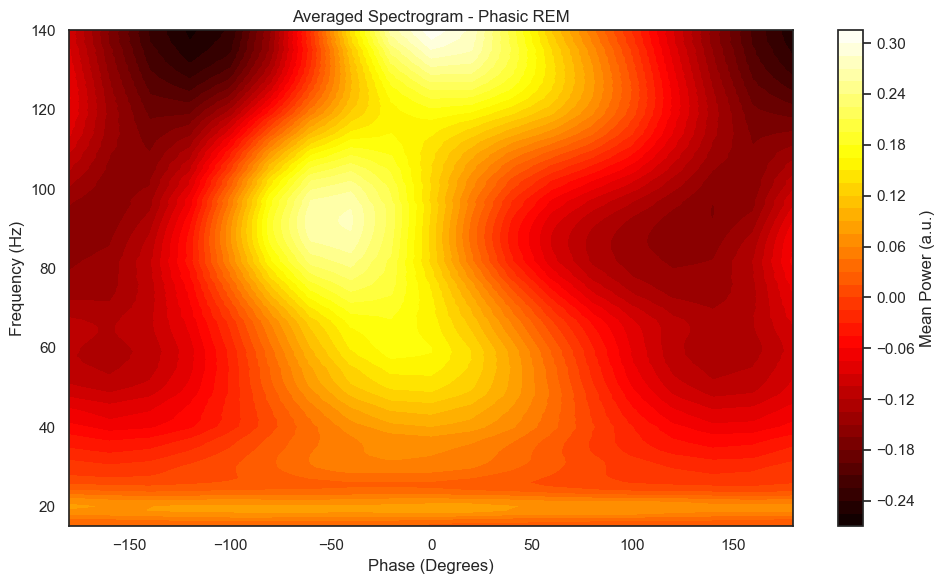

Saved plot: Spectral_Signature_Phasic.svg


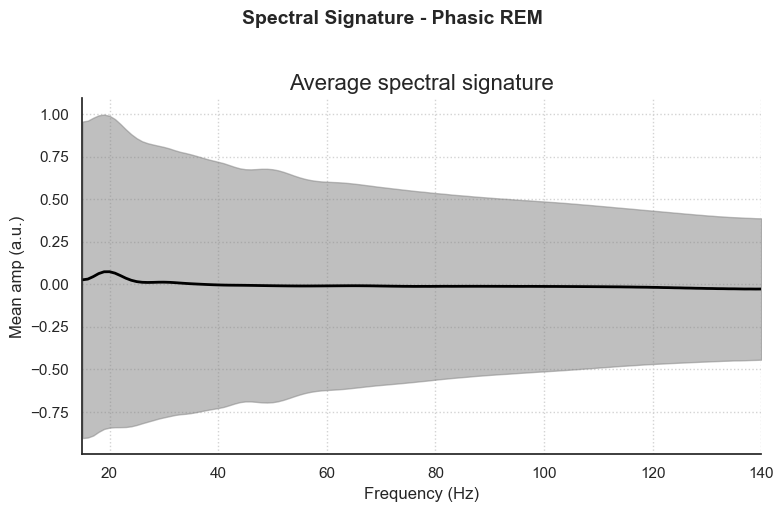

Saved plot: Averaged_Spectrogram_Tonic.svg


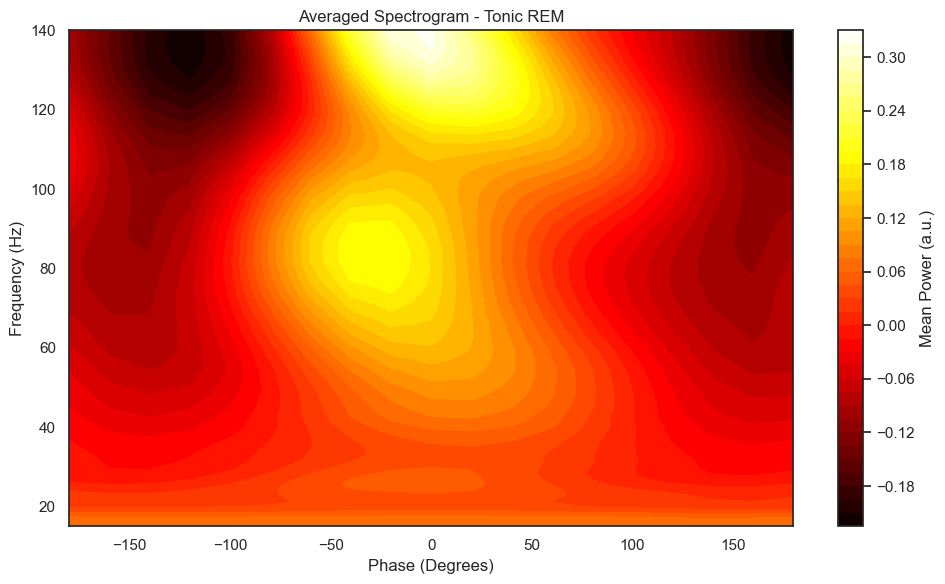

Saved plot: Spectral_Signature_Tonic.svg


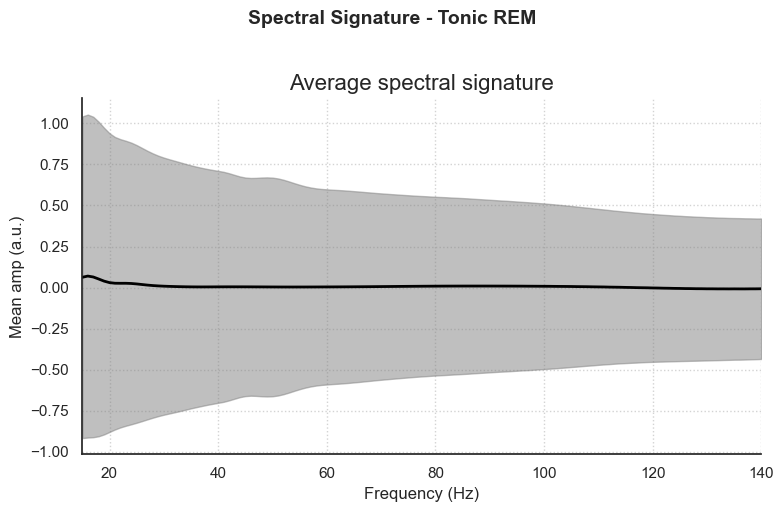

In [46]:
# --- 5. Generate Plots Using the Processed Data ---
print("\n--- Generating Plots ---")

# Plot for Phasic REM
plot_average_spectrogram(phasic_processed, angles, frequencies,
                         'Averaged Spectrogram - Phasic REM',
                         'Averaged_Spectrogram_Phasic.svg')
plot_spectral_signature(phasic_processed, frequencies,
                        'Spectral Signature - Phasic REM',
                        'Spectral_Signature_Phasic.svg')

# Plot for Tonic REM
plot_average_spectrogram(tonic_processed, angles, frequencies,
                         'Averaged Spectrogram - Tonic REM',
                         'Averaged_Spectrogram_Tonic.svg')
plot_spectral_signature(tonic_processed, frequencies,
                        'Spectral Signature - Tonic REM',
                        'Spectral_Signature_Tonic.svg')

## test

In [7]:
# version 1

def prepare_data_for_sa_v2(imfs, imf_frequencies):

  all_FPPs = []

  theta_range = [5, 12]
  frequencies = np.arange(15, 141, 1)
  angles=np.linspace(-180,180,19)
  fs = 2500

  for idx, imf in enumerate(imfs):
    cycle_data = get_cycle_data(imf[:, 5], fs=2500)

    amp_thresh = np.percentile(cycle_data['IA'], 25) # higher than 25th percentile of the data
    lo_freq_duration = fs/5  # restrict the analysis to 5-12 Hz
    hi_freq_duration = fs/12

    conditions = ['is_good==1',
                        f'duration_samples<{lo_freq_duration}',
                        f'duration_samples>{hi_freq_duration}',
                        f'max_amp>{amp_thresh}']
    print(len(cycle_data['theta_imf']))
    all_cycles = get_cycles_with_conditions(cycle_data['cycles'], conditions)
    if all_cycles is None or all_cycles.chain_vect.size == 0:
        print(f"No valid cycles found for the current interval. Skipping...")
        continue
    
    # Check if any cycles satisfy the conditions - HERE CAN BE CHANGED
    if all_cycles is None or all_cycles.chain_vect.size == 0:
        print("No cycles satisfy the conditions.")
        return pd.DataFrame(), pd.DataFrame(), []
    
    subset_cycles_df = all_cycles.get_metric_dataframe(subset=True)
    subset_indices = subset_cycles_df['index'].values

    all_cycles_inds = get_cycle_inds(all_cycles, subset_indices)
    cycles_inds = arrange_cycle_inds(all_cycles_inds)

    freqs = imf_frequencies[idx]
    _, _, supra_theta = tg_split(freqs, theta_range)
    supra_theta_sig = np.sum(imf.T[supra_theta], axis=0)

    # # Corrected Wavelet Transform Computation
    raw_data=sails.wavelet.morlet(supra_theta_sig, freqs=frequencies, sample_rate=fs, ncycles=5,ret_mode='power', normalise=None)
    FPP = bin_tf_to_fpp(cycles_inds, raw_data, bin_count=19)
    all_FPPs.append(FPP)

  return all_FPPs

In [8]:
def extract_data_for_rat_v2(rat_id):
    # Define the base path to OS Basic datasets
    base_path = '/Users/amir/Desktop/for Abdel/OS Basic'
    fs = 2500  # Sample frequency

    # Initialize empty DataFrames for concatenation across all recordings and trials for the specified rat
    all_phasic_FPPs = []
    all_tonic_FPPs = []

    rat_path = os.path.join(base_path, str(rat_id))

    # Check if the specified rat folder exists
    if not os.path.isdir(rat_path):
        print(f"Rat folder {rat_id} does not exist.")
        return None, None

    # List all recording folders in the rat directory
    recording_folders = [
        f for f in os.listdir(rat_path)
        if os.path.isdir(os.path.join(rat_path, f))
    ]

    if not recording_folders:
        print(f"No recording folders found for Rat {rat_id}.")
        return None, None

    # Loop over each recording folder
    for recording_folder in recording_folders:
        print(f"Processing recording folder: {recording_folder}")
        recording_path = os.path.join(rat_path, recording_folder)

        # Use regular expressions to parse the folder name
        match = re.match(r'^Rat-OS-Ephys_(Rat\d+)_SD(\d+)_([\w-]+)_([\d-]+)$', recording_folder)
        if not match:
            print(f"Unexpected folder name format: {recording_folder}. Skipping...")
            continue

        rat_id_part = match.group(1)       # e.g., 'Rat6'
        sd_number = match.group(2)         # e.g., '4'
        condition = match.group(3)         # e.g., 'CON'
        date_part = match.group(4)         # e.g., '22-02-2018'

        rat_id_from_folder = ''.join(filter(str.isdigit, rat_id_part))

        # Check if rat_id_from_folder matches rat_id
        if rat_id_from_folder != str(rat_id):
            print(f"Rat ID mismatch in folder {recording_folder}. Expected Rat{rat_id}, found Rat{rat_id_from_folder}. Skipping...")
            continue

        # Detect all trial folders and filter for post_trial2 to post_trial5, considering various folder name formats
        trial_folders = [
            f for f in os.listdir(recording_path)
            if os.path.isdir(os.path.join(recording_path, f)) and
            re.search(r'(?i)post[\-_]?trial[\-_]?([2-5])', f)
        ]

        if not trial_folders:
            print(f"No trial folders found in {recording_folder}.")
            continue

        for trial_folder in trial_folders:
            print(f"Processing trial folder: {trial_folder}")
            trial_path = os.path.join(recording_path, trial_folder)

            # Search for LFP and state files in the trial folder
            lfp_file = None
            state_file = None

            for file_name in os.listdir(trial_path):
                if 'HPC' in file_name and file_name.endswith('.mat'):
                    lfp_file = os.path.join(trial_path, file_name)
                elif 'states' in file_name and file_name.endswith('.mat'):
                    state_file = os.path.join(trial_path, file_name)
                elif 'States' in file_name and file_name.endswith('.mat'):
                    state_file = os.path.join(trial_path, file_name)

            # Ensure both LFP and state files were found
            if not lfp_file or not state_file:
                print(f"Missing LFP or state file in {trial_path}. Skipping...")
                continue

            # Extract trial number from folder name
            trial_number_match = re.search(r'(?i)post[\-_]?trial[\-_]?([2-5])', trial_folder)
            if trial_number_match:
                trial_number = int(trial_number_match.group(1))
            else:
                print(f"Unable to extract trial number from folder name: {trial_folder}. Skipping...")
                continue

            # Load data using custom functions
            try:
                lfpHPC, hypno, _ = get_data(lfp_file, state_file)

                # Extract phasic and tonic intervals, handling cases with no REM sleep
                try:
                    phasic_interval, tonic_interval, lfp = extract_pt_intervals(lfpHPC, hypno)
                except ValueError as e:
                    print(f"No REM sleep found in {trial_folder} for Rat {rat_id}, Condition {condition}. Filling with empty intervals.")
                    phasic_interval, tonic_interval, lfp = [[], [], []]

                # Extract IMFs and frequencies for phasic and tonic intervals if intervals are not empty
                if phasic_interval and tonic_interval:
                    # Assume 'config' is defined elsewhere in your code
                    tonic_imfs, tonic_freqs, tonic_lpf = extract_imfs_by_pt_intervals(
                        lfp, fs, tonic_interval, config, return_imfs_freqs=True)
                    phasic_imfs, phasic_freqs, phasic_lpf = extract_imfs_by_pt_intervals(
                        lfp, fs, phasic_interval, config, return_imfs_freqs=True)

                    # Prepare UMAP data for both phasic and tonic
                    phasic_FPPs = prepare_data_for_sa_v2(phasic_imfs, phasic_freqs)
                    tonic_FPPs = prepare_data_for_sa_v2(tonic_imfs, tonic_freqs)

                    # Concatenate into combined DataFrames
                    all_phasic_FPPs.extend(phasic_FPPs)
                    all_tonic_FPPs.extend(tonic_FPPs)

            except FileNotFoundError:
                print(f"Data not found in {trial_path}. Skipping...")

    return all_phasic_FPPs, all_tonic_FPPs

In [9]:
# List of rat IDs to process
rat_ids = [3, 4, 6, 9, 11, 13]

# Initialize lists to hold combined data across all rats

arrays_of_phasic_fpps = []
arrays_of_tonic_fpps = []

# Loop through each rat ID and process their data
for rat_id in rat_ids:
    print(f"Processing data for Rat {rat_id}...")
    all_phasic_FPPs, all_tonic_FPPs = extract_data_for_rat_v2(rat_id)
    
    # If data is returned (not None), add it to the combined lists
    if all_phasic_FPPs is not None and all_tonic_FPPs is not None:
        
        arrays_of_phasic_fpps.append(all_phasic_FPPs)
        arrays_of_tonic_fpps.append(all_tonic_FPPs)

    else:
        print(f"No data for Rat {rat_id}, skipping...")

Processing data for Rat 3...
Processing recording folder: Rat-OS-Ephys_Rat3_SD1_OR_08-11-2017
Processing trial folder: post_trial5_2017-11-08_16-18-24
There was 0 in the dataset
Number of detected Tonic intrevals:28
Number of detected Tonic intrevals after threshold:28
 Checking Cycles inputs - trimming singleton from input 'IP'
12995
 Checking Cycles inputs - trimming singleton from input 'IP'
5910
 Checking Cycles inputs - trimming singleton from input 'IP'
3370
 Checking Cycles inputs - trimming singleton from input 'IP'
3070
 Checking Cycles inputs - trimming singleton from input 'IP'
6230
 Checking Cycles inputs - trimming singleton from input 'IP'
3455
 Checking Cycles inputs - trimming singleton from input 'IP'
2350
 Checking Cycles inputs - trimming singleton from input 'IP'
3970
 Checking Cycles inputs - trimming singleton from input 'IP'
3680
 Checking Cycles inputs - trimming singleton from input 'IP'
3660
 Checking Cycles inputs - trimming singleton from input 'IP'
2695
 Ch

In [10]:
print(type(arrays_of_phasic_fpps))
print(len(arrays_of_phasic_fpps))
print(len(arrays_of_phasic_fpps[0]))
print(type(arrays_of_phasic_fpps[0]))
print(type(arrays_of_phasic_fpps[0][0]))
print(arrays_of_phasic_fpps[0][0].shape)

<class 'list'>
6
158
<class 'list'>
<class 'numpy.ndarray'>
(43, 126, 19)


In [18]:
np_arrays_of_phasic_fpps = np.empty((6,), dtype=object)
np_arrays_of_phasic_fpps[:] = arrays_of_phasic_fpps[:]
print(np_arrays_of_phasic_fpps.shape)  # ✅ (1,)

np_arrays_of_tonic_fpps = np.empty((6,), dtype=object)
np_arrays_of_tonic_fpps[:] = arrays_of_tonic_fpps[:]
print(np_arrays_of_tonic_fpps.shape)  # ✅ (1,)

(6,)
(6,)


In [19]:
import numpy as np
import matplotlib.pyplot as plt
import os
from collections import Counter

# --- 1. Define Constants & Load Your Data ---
# These parameters must match what you used in your data generation pipeline
frequencies = np.arange(15, 141, 1)
angles = np.linspace(-180, 180, 19)

# --- UNCOMMENT YOUR LOADING CODE HERE ---
# save_folder = "Os_Basic_Dataset_FPPs"
# phasic_filename = os.path.join(save_folder, "Os_Basic_Dataset_arrays_of_phasic_fpps.npy")
# tonic_filename = os.path.join(save_folder, "Os_Basic_Dataset_arrays_of_tonic_fpps.npy")

# print("Loading the saved arrays...")
# phasic_fpps = np.load(phasic_filename, allow_pickle=True)
# tonic_fpps = np.load(tonic_filename, allow_pickle=True)
# print("Successfully loaded arrays.")
# ----------------------------------------

# --- 2. Data Flattening Function (Handles the 3D Array Structure) ---
def flatten_fpp_data_final(fpps_by_rat):
    """
    Correctly flattens the Array[List[3D Array]] structure into a single
    flat list of 2D FPP arrays.
    """
    all_2d_fpps = []
    # Level 1: Iterate over each rat
    for rat_data_list in fpps_by_rat:
        if not isinstance(rat_data_list, list):
            continue
        # Level 2: Iterate over each interval's 3D array
        for interval_3d_array in rat_data_list:
            # Check if it's a 3D numpy array with at least one cycle
            if isinstance(interval_3d_array, np.ndarray) and interval_3d_array.ndim == 3 and interval_3d_array.shape[0] > 0:
                # Level 3: Iterate through each cycle (the first dimension)
                # and append the 2D FPP to our master list.
                for i in range(interval_3d_array.shape[0]):
                    all_2d_fpps.append(interval_3d_array[i, :, :])
    return all_2d_fpps

print("--- Flattening Data ---")
flattened_phasic = flatten_fpp_data_final(np_arrays_of_phasic_fpps)
flattened_tonic = flatten_fpp_data_final(np_arrays_of_tonic_fpps)

print(f"Total number of Phasic FPPs found: {len(flattened_phasic)}")
print(f"Total number of Tonic FPPs found: {len(flattened_tonic)}")
print("-" * 20)

--- Flattening Data ---
Total number of Phasic FPPs found: 19427
Total number of Tonic FPPs found: 346571
--------------------


In [22]:
# --- 3. Data Processing Function ---
def process_fpps_for_plotting(fpp_list, description=""):
    """
    Takes a flat list of 2D FPPs, filters them for consistent shapes,
    and computes the necessary averages for plotting.
    Returns a dictionary with processed data, or None if no valid data.
    """
    if not fpp_list:
        print(f"No FPPs to process for {description}.")
        return None

    # Filter for arrays with the most common, valid shape to avoid errors
    shape_counts = Counter(arr.shape for arr in fpp_list if isinstance(arr, np.ndarray))
    if not shape_counts:
        print(f"No valid NumPy arrays found for {description}.")
        return None
        
    most_common_shape = shape_counts.most_common(1)[0][0]
    valid_fpps = [arr for arr in fpp_list if hasattr(arr, 'shape') and arr.shape == most_common_shape]
    
    print(f"Processing '{description}':")
    print(f"  - Found {len(valid_fpps)} valid FPPs with shape {most_common_shape}.")
    if len(valid_fpps) < len(fpp_list):
        print(f"  - Ignored {len(fpp_list) - len(valid_fpps)} entries with inconsistent shapes or types.")
    
    if not valid_fpps:
        return None

    # Stack the valid FPPs into a single 3D array
    stacked_fpps = np.stack(valid_fpps, axis=0)

    # --- Calculations for Plots ---
    # 1. For the averaged spectrogram
    avg_fpp = np.mean(stacked_fpps, axis=0)

    # 2. For the spectral signature
    all_signatures = np.mean(stacked_fpps, axis=2) # Average over phase angles
    mean_signature = np.mean(all_signatures, axis=0)
    std_signature = np.std(all_signatures, axis=0)

    # Return all processed data in a dictionary
    return {
        'avg_fpp': avg_fpp,
        'mean_signature': mean_signature,
        'std_signature': std_signature,
        'n_valid': len(valid_fpps),
        'shape': most_common_shape
    }

print("\n--- Processing Flattened Data ---")
phasic_processed = process_fpps_for_plotting(flattened_phasic, "Phasic REM")
tonic_processed = process_fpps_for_plotting(flattened_tonic, "Tonic REM")
print("-" * 20)



--- Processing Flattened Data ---
Processing 'Phasic REM':
  - Found 19427 valid FPPs with shape (126, 19).
Processing 'Tonic REM':
  - Found 346571 valid FPPs with shape (126, 19).
--------------------



--- Generating Plots ---
Saved plot: Averaged_Spectrogram_Phasic.svg


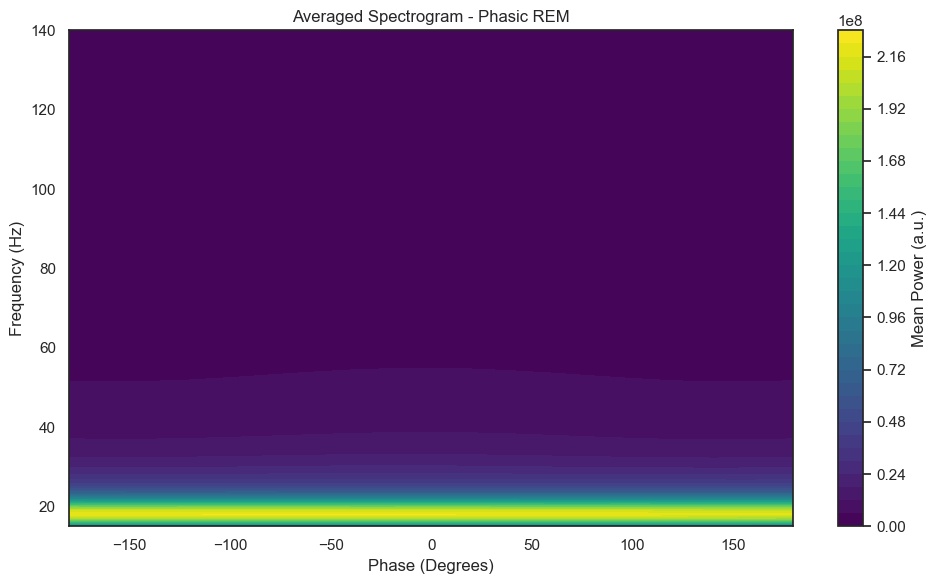

Saved plot: Spectral_Signature_Phasic.svg


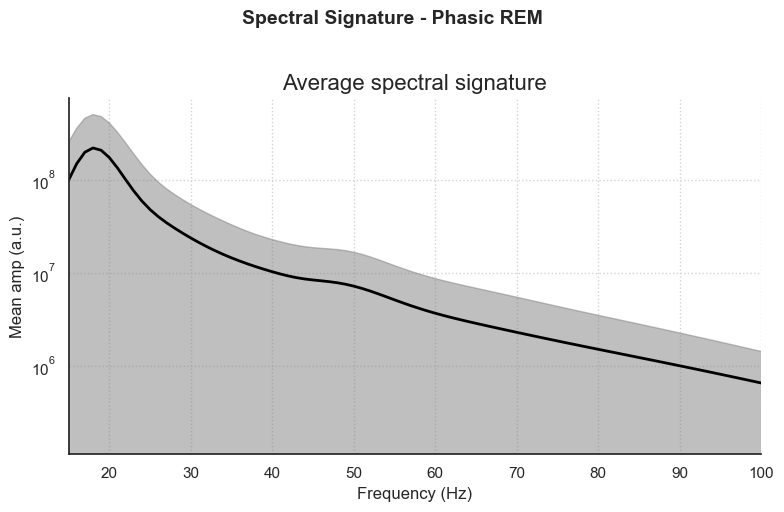

Saved plot: Averaged_Spectrogram_Tonic.svg


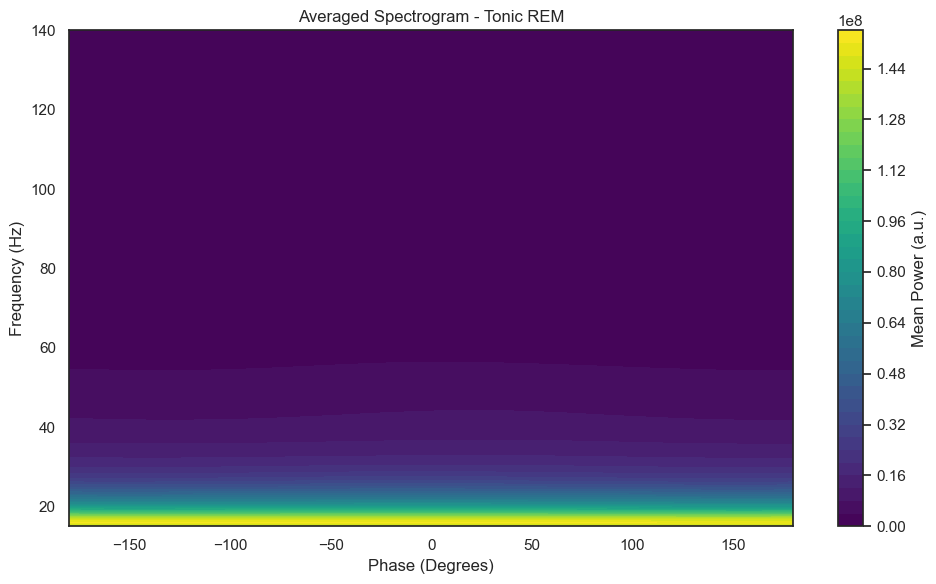

Saved plot: Spectral_Signature_Tonic.svg


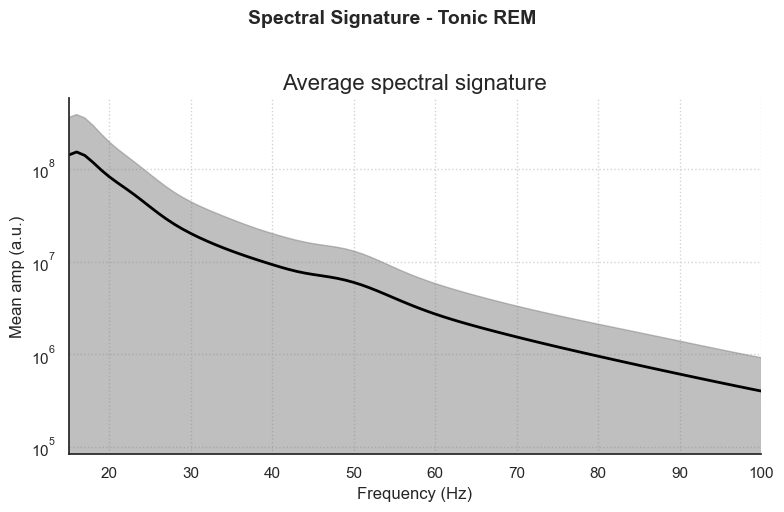

In [29]:
# --- 5. Generate Plots Using the Processed Data ---
print("\n--- Generating Plots ---")

# Plot for Phasic REM
plot_average_spectrogram(phasic_processed, angles, frequencies,
                         'Averaged Spectrogram - Phasic REM',
                         'Averaged_Spectrogram_Phasic.svg')
plot_spectral_signature(phasic_processed, frequencies,
                        'Spectral Signature - Phasic REM',
                        'Spectral_Signature_Phasic.svg')

# Plot for Tonic REM
plot_average_spectrogram(tonic_processed, angles, frequencies,
                         'Averaged Spectrogram - Tonic REM',
                         'Averaged_Spectrogram_Tonic.svg')
plot_spectral_signature(tonic_processed, frequencies,
                        'Spectral Signature - Tonic REM',
                        'Spectral_Signature_Tonic.svg')

# compnents

In [6]:
save_folder = "Os_Basic_Dataset_FPPs"
os.makedirs(save_folder, exist_ok=True)

# Save the numpy arrays
phasic_filename = os.path.join(save_folder, "Os_Basic_Dataset_arrays_of_phasic_fpps.npy")
tonic_filename = os.path.join(save_folder, "Os_Basic_Dataset_arrays_of_tonic_fpps.npy")

# --- Code to load the saved arrays ---
print("\nLoading the saved arrays...")

phasic_fpps = np.load(phasic_filename, allow_pickle=True)
tonic_fpps = np.load(tonic_filename, allow_pickle=True)

print("\nSuccessfully loaded arrays:")


Loading the saved arrays...

Successfully loaded arrays:


In [56]:
def extract_spectural_signiture(FPP):
  smoothed_avg_fpp_all = []

  # Process each cycle to extract its normalized smoothed average FPP
  for fpp in FPP:
      fpp = np.abs(fpp)
      fpp_sum = np.sum(fpp)
      normalized_fpp = fpp / fpp_sum if fpp_sum != 0 else fpp
      avg_fpp = np.sum(normalized_fpp, axis=1)

      # Smooth and normalize the avg_fpp
      window_size = 5  # 5 Hz window
      smoothed_avg_fpp = np.convolve(avg_fpp, np.ones(window_size)/window_size, mode='same')
      smoothed_avg_fpp_norm = (smoothed_avg_fpp - np.min(smoothed_avg_fpp)) / (np.max(smoothed_avg_fpp) - np.min(smoothed_avg_fpp))

      smoothed_avg_fpp_all.append(smoothed_avg_fpp_norm)

  return smoothed_avg_fpp_all

In [57]:
def extract_and_flatten_signatures(fpps):
    """Extracts and flattens spectral signatures from a list of FPPs."""
    spectral_signatures = [extract_spectural_signiture(fpp) for fpp in fpps]
    # Flatten the nested list of spectral signatures
    flattened_signatures = np.array([ss for sublist in spectral_signatures for ss in sublist])
    return flattened_signatures

In [20]:
# flatten across rats → one list of FPPs
all_phasic_episodes = [episode
                       for rat_episodes in phasic_fpps
                       for episode in rat_episodes]

all_tonic_episodes = [episode
                      for rat_episodes in tonic_fpps
                      for episode in rat_episodes]

# now exactly as before
combined_phasic_sss = extract_and_flatten_signatures(all_phasic_episodes)
combined_tonic_sss = extract_and_flatten_signatures(all_tonic_episodes)

print(combined_phasic_sss.shape)  # e.g. (total_phasic_cycles, freq_bins)
print(combined_tonic_sss.shape)   # e.g. (total_tonic_cycles, freq_bins)

(21721, 126)
(396121, 126)


In [22]:
all_FPPs_combined = all_phasic_episodes + all_tonic_episodes
combined_all_sss = extract_and_flatten_signatures(all_FPPs_combined)

In [24]:
from sklearn.decomposition import PCA, FastICA

Peak frequency of tSC1 (Phasic Cycles - All rats): 130.00 Hz
Peak frequency of tSC2 (Phasic Cycles - All rats): 76.00 Hz
Peak frequency of tSC3 (Phasic Cycles - All rats): 42.00 Hz
Peak frequency of tSC4 (Phasic Cycles - All rats): 58.00 Hz
Peak frequency of tSC5 (Phasic Cycles - All rats): 82.00 Hz


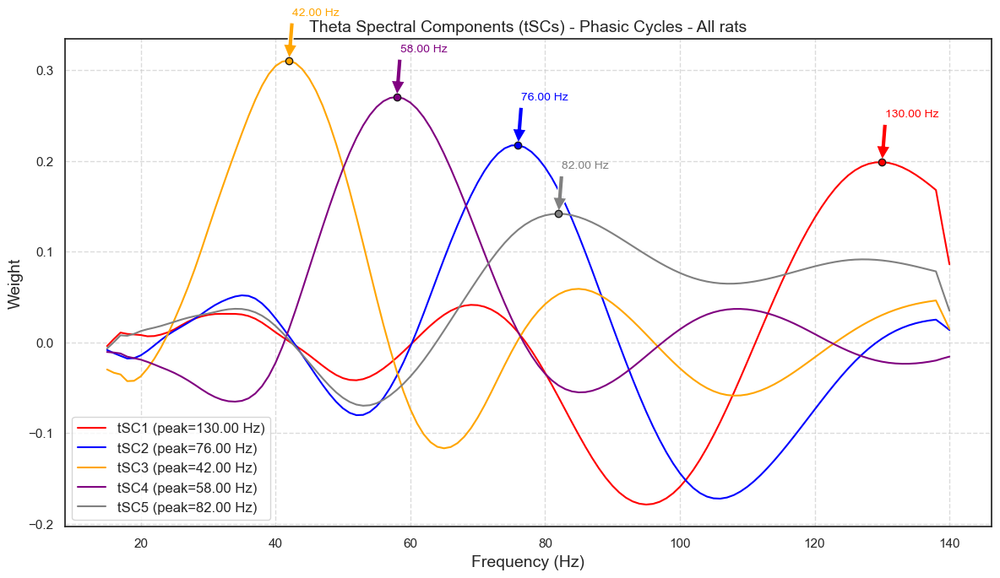

Peak frequency of tSC1 (Tonic Cycles - All rats): 39.00 Hz
Peak frequency of tSC2 (Tonic Cycles - All rats): 131.00 Hz
Peak frequency of tSC3 (Tonic Cycles - All rats): 56.00 Hz
Peak frequency of tSC4 (Tonic Cycles - All rats): 76.00 Hz
Peak frequency of tSC5 (Tonic Cycles - All rats): 107.00 Hz


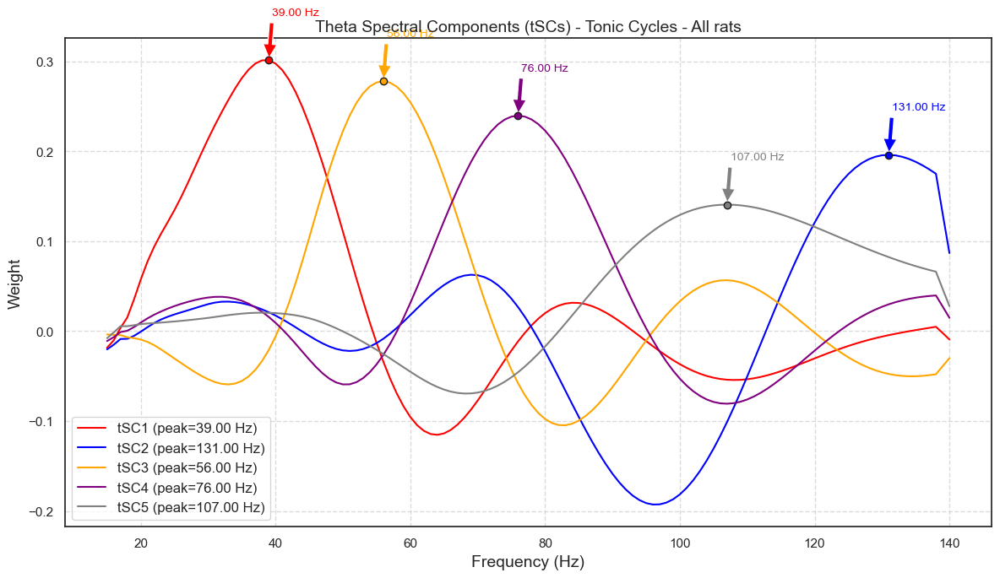


Phasic cycles grouped by component:
  Component 4: 4672 cycles -> indices [0, 1, 3, 5, 7, 11, 23, 36, 37, 52, 54, 61, 62, 63, 68, 78, 87, 90, 91, 92, 93, 94, 101, 103, 106, 109, 110, 116, 118, 121, 122, 123, 124, 139, 143, 147, 150, 153, 166, 173, 183, 184, 188, 192, 196, 198, 200, 207, 213, 214, 241, 247, 278, 283, 284, 286, 287, 288, 293, 302, 304, 305, 311, 330, 331, 332, 333, 335, 343, 344, 347, 358, 362, 366, 372, 377, 378, 382, 383, 387, 395, 396, 397, 407, 414, 418, 421, 423, 426, 430, 443, 444, 453, 454, 469, 475, 477, 487, 490, 500, 501, 504, 506, 508, 511, 516, 517, 520, 525, 527, 532, 536, 548, 550, 552, 553, 555, 568, 569, 571, 573, 582, 583, 584, 587, 591, 598, 599, 601, 602, 604, 605, 613, 621, 631, 634, 636, 641, 643, 644, 645, 650, 663, 669, 670, 674, 676, 682, 686, 690, 691, 695, 701, 709, 713, 717, 719, 721, 723, 726, 728, 733, 734, 737, 739, 744, 751, 752, 753, 762, 764, 766, 778, 779, 782, 786, 787, 792, 814, 815, 816, 817, 819, 823, 824, 830, 838, 839, 852, 862, 8

In [25]:
from collections import defaultdict
def process_and_plot_spectral_components(data, n_components, frequencies, title_suffix, save_path):
    """
    Processes the spectral data and plots the theta spectral components with peak frequencies.
    Returns:
        tSCs (np.ndarray): 2D array of shape (n_samples, n_components),
                           the ICA time courses in the reduced PCA space.
        tSCs_weights_original (np.ndarray): 2D array of shape (n_components, n_freqs),
                                            the ICA components projected back into the original space.
    """
    if data.size == 0:
        print(f"[Warning] Empty data for {title_suffix}. Skipping.")
        return None, None
    
    # Step 1: PCA
    pca = PCA(n_components=n_components, random_state=42)
    pca_result = pca.fit_transform(data)
    
    # Step 2: ICA (on the PCA-reduced data)
    ica = FastICA(n_components=n_components, random_state=42)
    tSCs = ica.fit_transform(pca_result)  # shape: (n_samples, n_components)
    ica_components = ica.components_      # shape: (n_components, n_components) in PCA space
    
    # Step 3: Calculate original weights by projecting ICA components back to original space
    #         We do: ICA components * PCA components
    tSCs_weights_original = np.dot(ica_components, pca.components_)  # shape: (n_components, n_freqs)
    
    # Step 4: Adjust sign of components so that the average projection is positive
    mean_projections = np.dot(tSCs_weights_original, data.T).mean(axis=1)
    for i in range(n_components):
        if mean_projections[i] < 0:
            tSCs_weights_original[i, :] *= -1
            tSCs[:, i] *= -1  # also flip the sign in the time courses if desired
    
    # Step 5: Determine peak frequencies
    peak_frequencies = []
    for i in range(n_components):
        idx_peak = np.argmax(tSCs_weights_original[i, :])
        peak_freq = frequencies[idx_peak]
        peak_frequencies.append(peak_freq)
        print(f"Peak frequency of tSC{i+1} ({title_suffix}): {peak_freq:.2f} Hz")
    
    # Step 6: Plotting
    colors = ['red', 'blue', 'orange', 'purple', 'gray', 'green', 'brown']
    labels = [f'tSC{i+1}' for i in range(n_components)]
    plt.figure(figsize=(12, 7))
    
    for i in range(n_components):
        plt.plot(frequencies, tSCs_weights_original[i, :], 
                 color=colors[i % len(colors)], 
                 label=f'{labels[i]} (peak={peak_frequencies[i]:.2f} Hz)')
        # Mark the peak
        peak_idx = np.where(frequencies == peak_frequencies[i])[0]
        if len(peak_idx) > 0:
            idxp = peak_idx[0]
            plt.scatter(peak_frequencies[i], tSCs_weights_original[i, idxp],
                        color=colors[i % len(colors)], edgecolor='k', zorder=5)
            plt.annotate(f'{peak_frequencies[i]:.2f} Hz',
                         xy=(peak_frequencies[i], tSCs_weights_original[i, idxp]),
                         xytext=(peak_frequencies[i]+0.5, tSCs_weights_original[i, idxp]+0.05),
                         arrowprops=dict(facecolor=colors[i % len(colors)], shrink=0.05),
                         fontsize=10,
                         color=colors[i % len(colors)])
    
    plt.xlabel('Frequency (Hz)', fontsize=14)
    plt.ylabel('Weight', fontsize=14)
    plt.title(f'Theta Spectral Components (tSCs) - {title_suffix}', fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()

    return tSCs, tSCs_weights_original

###########################################
# 3. Run analysis on phasic and tonic
###########################################

# Define how many components you want
n_components_pca = 5

# Suppose you have a frequency array:
# For example, from 0 to 25 Hz in 0.5 Hz steps:
frequencies = np.arange(15, 141, 1)

# Process phasic data
phasic_tSCs, phasic_weights = process_and_plot_spectral_components(
    combined_phasic_sss,
    n_components_pca,
    frequencies,
    "Phasic Cycles - All rats",
    "spectral_components_phasic_cycle_all_rats.svg"
)

# Process tonic data
tonic_tSCs, tonic_weights = process_and_plot_spectral_components(
    combined_tonic_sss,
    n_components_pca,
    frequencies,
    "Tonic Cycles - All rats",
    "spectral_components_tonic_cycle_all_rats.svg"
)

###########################################
# 4. Assign cycles to ICA components
###########################################

def group_cycles_by_component(assigned_components):
    """
    Given an array of component assignments (one per cycle),
    return a dict listing the cycle indices for each component.
    """
    cycles_by_comp = defaultdict(list)
    for cycle_idx, comp_idx in enumerate(assigned_components):
        cycles_by_comp[comp_idx].append(cycle_idx)
    return cycles_by_comp

# -- Phasic --
if phasic_tSCs is not None:
    # Take absolute value of the time courses to ignore sign
    phasic_tSCs_abs = np.abs(phasic_tSCs)  # shape: (n_phasic_cycles, n_components)
    # Assign each cycle to the component with the largest absolute activation
    assigned_components_phasic = np.argmax(phasic_tSCs_abs, axis=1)
    # Group phasic cycle indices by component
    phasic_cycles_by_comp = group_cycles_by_component(assigned_components_phasic)

    print("\nPhasic cycles grouped by component:")
    for comp_idx, cycle_indices in phasic_cycles_by_comp.items():
        print(f"  Component {comp_idx}: {len(cycle_indices)} cycles -> indices {cycle_indices}")

# -- Tonic --
if tonic_tSCs is not None:
    tonic_tSCs_abs = np.abs(tonic_tSCs)
    assigned_components_tonic = np.argmax(tonic_tSCs_abs, axis=1)
    tonic_cycles_by_comp = group_cycles_by_component(assigned_components_tonic)

    print("\nTonic cycles grouped by component:")
    for comp_idx, cycle_indices in tonic_cycles_by_comp.items():
        print(f"  Component {comp_idx}: {len(cycle_indices)} cycles -> indices {cycle_indices}")


Peak frequency of tSC1 (Combined Cycles - All rats): 39.00 Hz
Peak frequency of tSC2 (Combined Cycles - All rats): 129.00 Hz
Peak frequency of tSC3 (Combined Cycles - All rats): 74.00 Hz
Peak frequency of tSC4 (Combined Cycles - All rats): 57.00 Hz
Peak frequency of tSC5 (Combined Cycles - All rats): 82.00 Hz


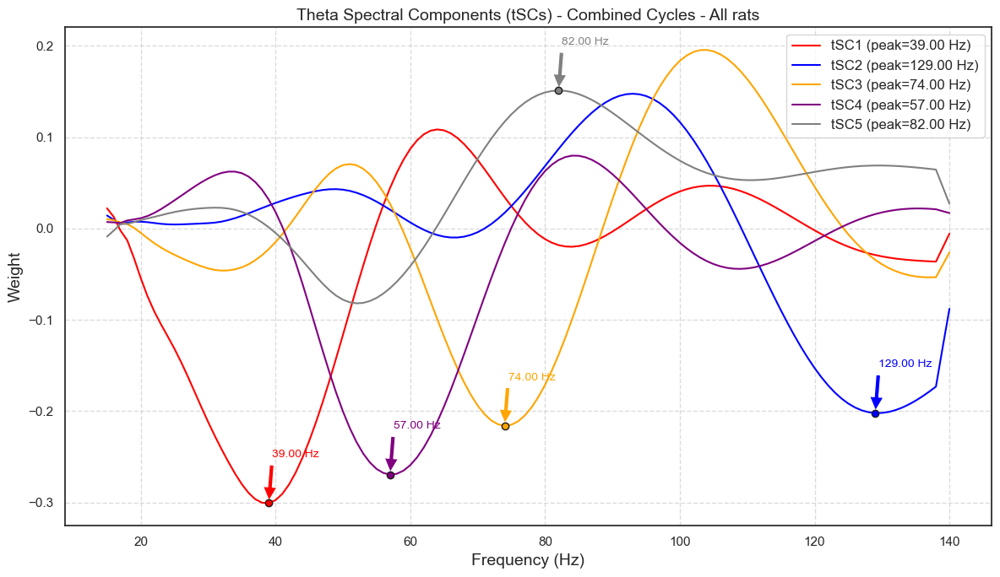

Component 0: 4083 phasic cycles, 73689 tonic cycles
Component 4: 4312 phasic cycles, 89921 tonic cycles
Component 2: 4530 phasic cycles, 75372 tonic cycles
Component 3: 4783 phasic cycles, 86898 tonic cycles
Component 1: 4013 phasic cycles, 70241 tonic cycles


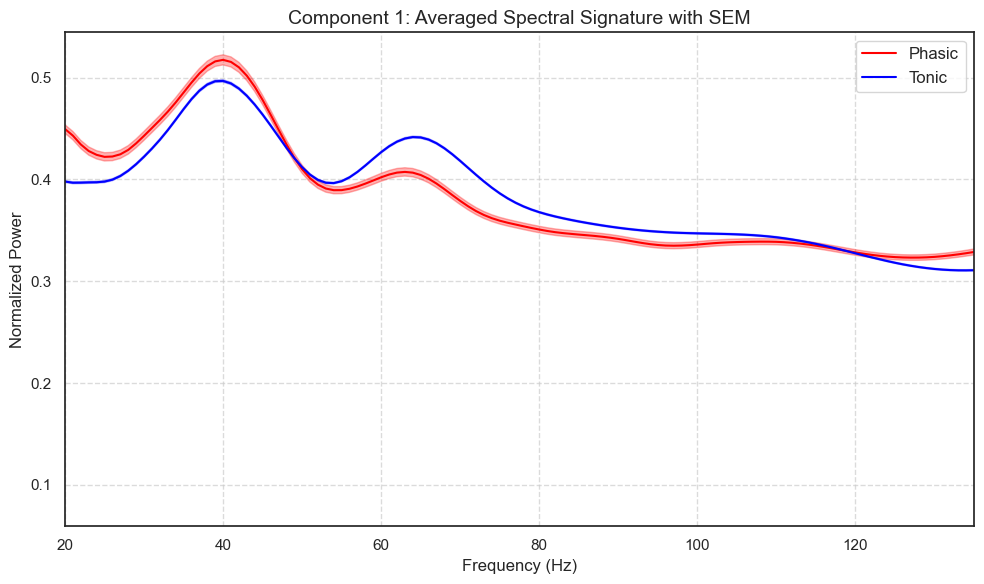

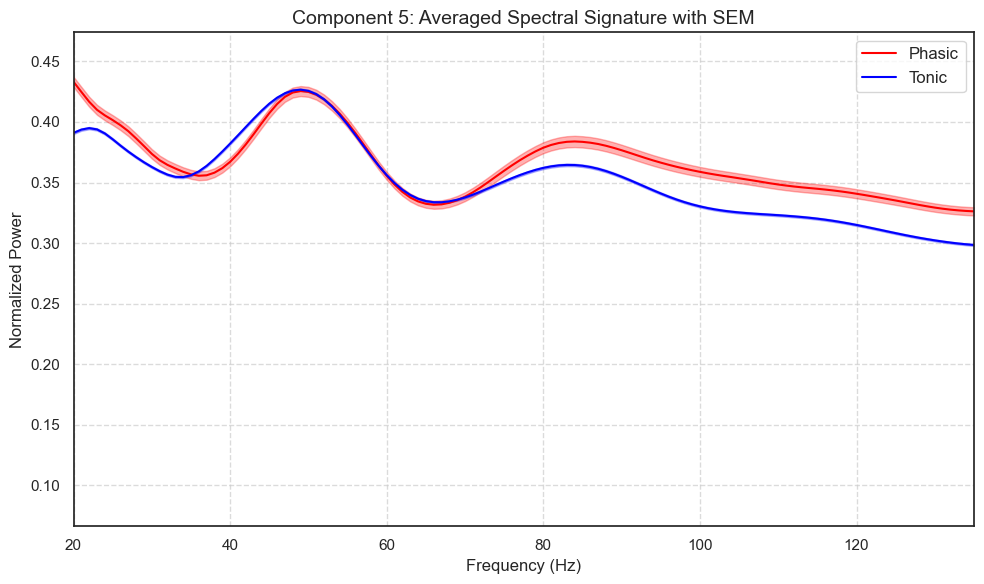

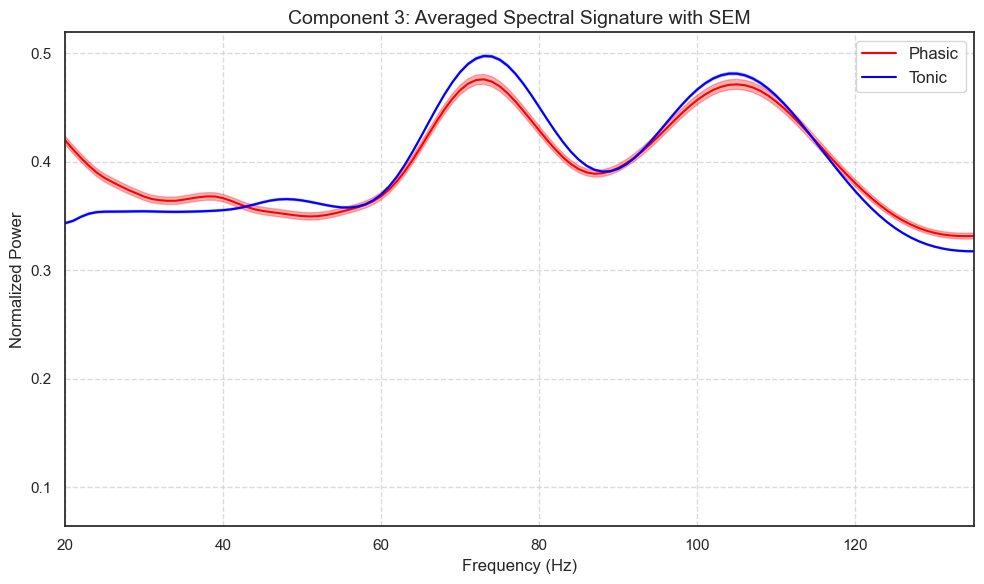

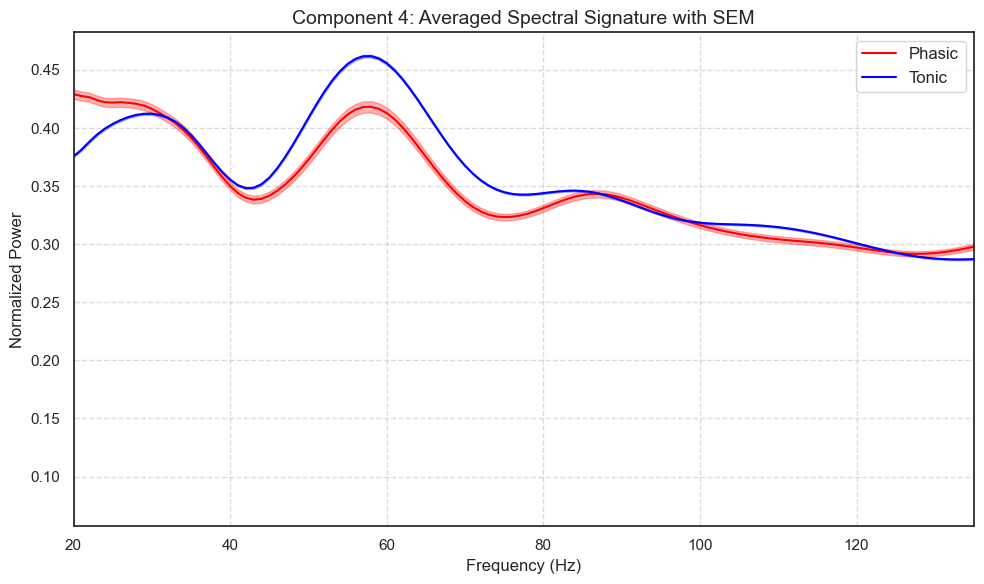

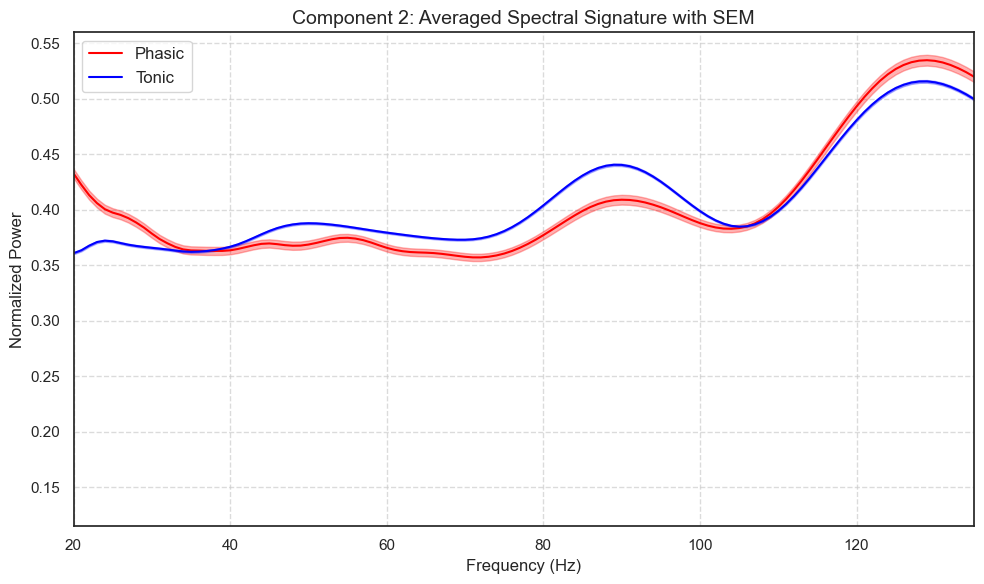

In [26]:
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
from sklearn.decomposition import PCA, FastICA

###########################################
# 1. Define the PCA/ICA processing function
###########################################
def process_and_plot_spectral_components(data, n_components, frequencies, title_suffix, save_path):
    """
    Processes the spectral data via PCA and ICA, then plots the ICA component weights.
    Returns:
        tSCs (np.ndarray): 2D array (n_samples x n_components), the ICA time courses.
        tSCs_weights_original (np.ndarray): 2D array (n_components x n_freqs), the ICA components in original space.
    Note:
        This version does not flip the sign of components.
        For peak detection we use the index of the maximum absolute weight.
    """
    if data.size == 0:
        print(f"[Warning] Empty data for {title_suffix}. Skipping.")
        return None, None

    # Step 1: PCA
    pca = PCA(n_components=n_components, random_state=42)
    pca_result = pca.fit_transform(data)
    
    # Step 2: ICA (on PCA-reduced data)
    ica = FastICA(n_components=n_components, random_state=42)
    tSCs = ica.fit_transform(pca_result)  # shape: (n_samples, n_components)
    ica_components = ica.components_
    
    # Step 3: Project ICA components back to original space
    tSCs_weights_original = np.dot(ica_components, pca.components_)  # shape: (n_components, n_freqs)
    
    # (Step 4: Do NOT adjust the sign; keep original weights)
    
    # Step 5: Determine peak frequencies using maximum absolute weight
    peak_frequencies = []
    for i in range(n_components):
        # Use the index of the maximum of absolute values so that a strong negative peak is captured.
        idx_peak = np.argmax(np.abs(tSCs_weights_original[i, :]))
        peak_freq = frequencies[idx_peak]
        peak_frequencies.append(peak_freq)
        print(f"Peak frequency of tSC{i+1} ({title_suffix}): {peak_freq:.2f} Hz")
    
    # Step 6: Plot the ICA component weights
    colors = ['red', 'blue', 'orange', 'purple', 'gray', 'green', 'brown']
    labels = [f'tSC{i+1}' for i in range(n_components)]
    plt.figure(figsize=(12, 7))
    for i in range(n_components):
        plt.plot(frequencies, tSCs_weights_original[i, :],
                 color=colors[i % len(colors)],
                 label=f'{labels[i]} (peak={peak_frequencies[i]:.2f} Hz)')
        # Mark the peak (using exact frequency match)
        peak_idx = np.where(frequencies == peak_frequencies[i])[0]
        if len(peak_idx) > 0:
            idxp = peak_idx[0]
            plt.scatter(peak_frequencies[i], tSCs_weights_original[i, idxp],
                        color=colors[i % len(colors)], edgecolor='k', zorder=5)
            plt.annotate(f'{peak_frequencies[i]:.2f} Hz',
                         xy=(peak_frequencies[i], tSCs_weights_original[i, idxp]),
                         xytext=(peak_frequencies[i]+0.5, tSCs_weights_original[i, idxp]+0.05),
                         arrowprops=dict(facecolor=colors[i % len(colors)], shrink=0.05),
                         fontsize=10,
                         color=colors[i % len(colors)])
    
    plt.xlabel('Frequency (Hz)', fontsize=14)
    plt.ylabel('Weight', fontsize=14)
    plt.title(f'Theta Spectral Components (tSCs) - {title_suffix}', fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()

    return tSCs, tSCs_weights_original

###########################################
# 2. Define a helper to group cycles by component
###########################################
def group_cycles_by_component(assigned_components):
    """
    Given an array of component assignments (one per cycle),
    returns a dict mapping each component to the list of cycle indices.
    """
    cycles_by_comp = defaultdict(list)
    for cycle_idx, comp_idx in enumerate(assigned_components):
        cycles_by_comp[comp_idx].append(cycle_idx)
    return cycles_by_comp

###########################################
# 3. Prepare combined spectral signatures and labels
###########################################
# Assume you have already extracted:
#   - combined_phasic_sss: shape (n_phasic, 126)
#   - combined_tonic_sss: shape (n_tonic, 126)
# For example, using your extract_and_flatten_signatures() function.
# Here we combine them:
combined_all_sss = np.concatenate([combined_phasic_sss, combined_tonic_sss], axis=0)
n_phasic = combined_phasic_sss.shape[0]
n_total = combined_all_sss.shape[0]

# Create a label vector: first n_phasic are 'phasic', the rest are 'tonic'
cycle_labels = np.array(['phasic'] * n_phasic + ['tonic'] * (n_total - n_phasic))

# Define frequency axis (15 Hz to 140 Hz -> 126 bins)
frequencies = np.arange(15, 141, 1)

###########################################
# 4. Run PCA/ICA on the combined spectral signatures
###########################################
n_components_pca = 5
combined_title = "Combined Cycles - All rats"
combined_save_path = "spectral_components_combined.svg"

combined_tSCs, combined_weights = process_and_plot_spectral_components(
    combined_all_sss,
    n_components_pca,
    frequencies,
    combined_title,
    combined_save_path
)

###########################################
# 5. Assign cycles to components based on ICA time courses
###########################################
if combined_tSCs is not None:
    # Use the absolute value so that strong negative activations are considered
    combined_tSCs_abs = np.abs(combined_tSCs)
    assigned_components = np.argmax(combined_tSCs_abs, axis=1)
    cycles_by_comp = group_cycles_by_component(assigned_components)
    
    for comp_idx, indices in cycles_by_comp.items():
        phasic_idx = [i for i in indices if cycle_labels[i] == 'phasic']
        tonic_idx = [i for i in indices if cycle_labels[i] == 'tonic']
        print(f"Component {comp_idx}: {len(phasic_idx)} phasic cycles, {len(tonic_idx)} tonic cycles")

###########################################
# 6. For each component, average spectral signatures separately for phasic and tonic cycles and plot with SEM
###########################################
# Here each row of combined_all_sss is a spectral signature (a 1D vector of length 126).
for comp_idx, indices in cycles_by_comp.items():
    # Separate indices by cycle type
    phasic_indices = [i for i in indices if cycle_labels[i] == 'phasic']
    tonic_indices = [i for i in indices if cycle_labels[i] == 'tonic']
    
    # Compute averages and SEM if there are any cycles
    if len(phasic_indices) > 0:
        phasic_signatures = combined_all_sss[phasic_indices, :]  # shape: (n_phasic_comp, 126)
        mean_phasic = np.mean(phasic_signatures, axis=0)
        sem_phasic = np.std(phasic_signatures, axis=0) / np.sqrt(phasic_signatures.shape[0])
    else:
        mean_phasic, sem_phasic = None, None
        
    if len(tonic_indices) > 0:
        tonic_signatures = combined_all_sss[tonic_indices, :]  # shape: (n_tonic_comp, 126)
        mean_tonic = np.mean(tonic_signatures, axis=0)
        sem_tonic = np.std(tonic_signatures, axis=0) / np.sqrt(tonic_signatures.shape[0])
    else:
        mean_tonic, sem_tonic = None, None
    
    # Plot the averaged spectral signature with SEM for this component
    plt.figure(figsize=(10, 6))
    if mean_phasic is not None:
        plt.plot(frequencies, mean_phasic, label='Phasic', color='red')
        plt.fill_between(frequencies, mean_phasic - sem_phasic, mean_phasic + sem_phasic,
                         color='red', alpha=0.3)
    if mean_tonic is not None:
        plt.plot(frequencies, mean_tonic, label='Tonic', color='blue')
        plt.fill_between(frequencies, mean_tonic - sem_tonic, mean_tonic + sem_tonic,
                         color='blue', alpha=0.3)
    plt.xlabel('Frequency (Hz)', fontsize=12)
    plt.ylabel('Normalized Power', fontsize=12)
    plt.title(f'Component {comp_idx + 1}: Averaged Spectral Signature with SEM', fontsize=14)
    plt.legend(fontsize=12)
    plt.xlim(20, 135)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig(f'component_{comp_idx}_averaged_spectral_signature.svg', format='svg')
    plt.show()


--- Flattening Data and Generating Custom Signatures ---
Total phasic cycles: 21721
Total tonic cycles: 396121
Shape of custom spectral signatures array for ICA: (417842, 126)

--- ICA Component Peak Frequencies (Using Your Custom Signatures) ---
Peak frequency of tSC1 (Combined Cycles - All rats): 39.00 Hz
Peak frequency of tSC2 (Combined Cycles - All rats): 130.00 Hz
Peak frequency of tSC3 (Combined Cycles - All rats): 75.00 Hz
Peak frequency of tSC4 (Combined Cycles - All rats): 58.00 Hz
Peak frequency of tSC5 (Combined Cycles - All rats): 84.00 Hz


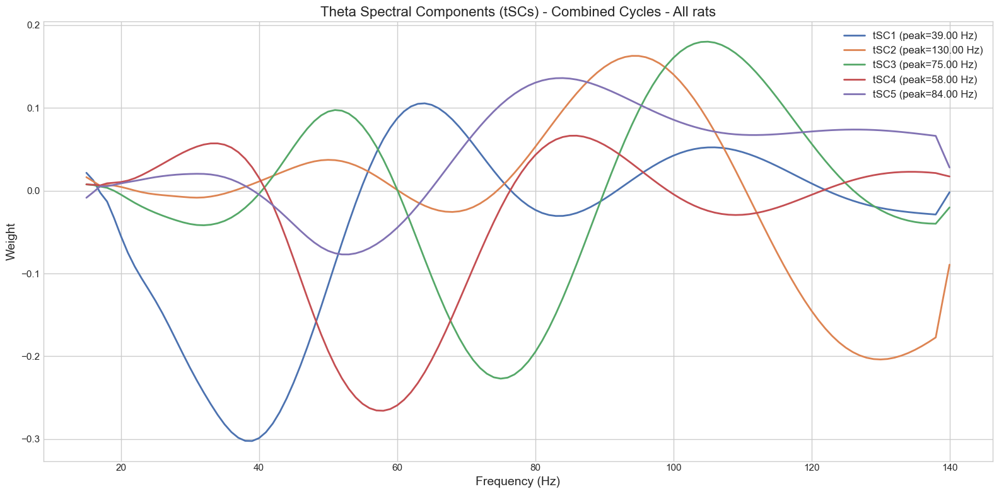


--- Assigning Cycles to Components ---
Component 1: 4085 phasic cycles, 73484 tonic cycles
Component 2: 4150 phasic cycles, 71637 tonic cycles
Component 3: 4495 phasic cycles, 75845 tonic cycles
Component 4: 4709 phasic cycles, 86163 tonic cycles
Component 5: 4282 phasic cycles, 88992 tonic cycles

--- Generating Average FPPs for Each Component ---

Processing Component 1...
Saved plot: Os_Basic_Dataset_FPPs_Component_Analysis/component_1_phasic_FPP.svg


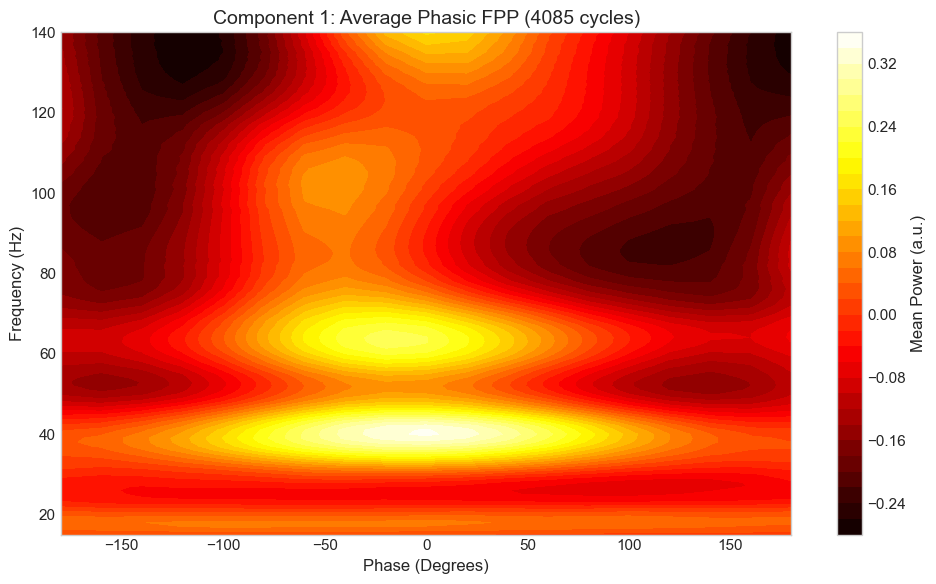

Saved plot: Os_Basic_Dataset_FPPs_Component_Analysis/component_1_tonic_FPP.svg


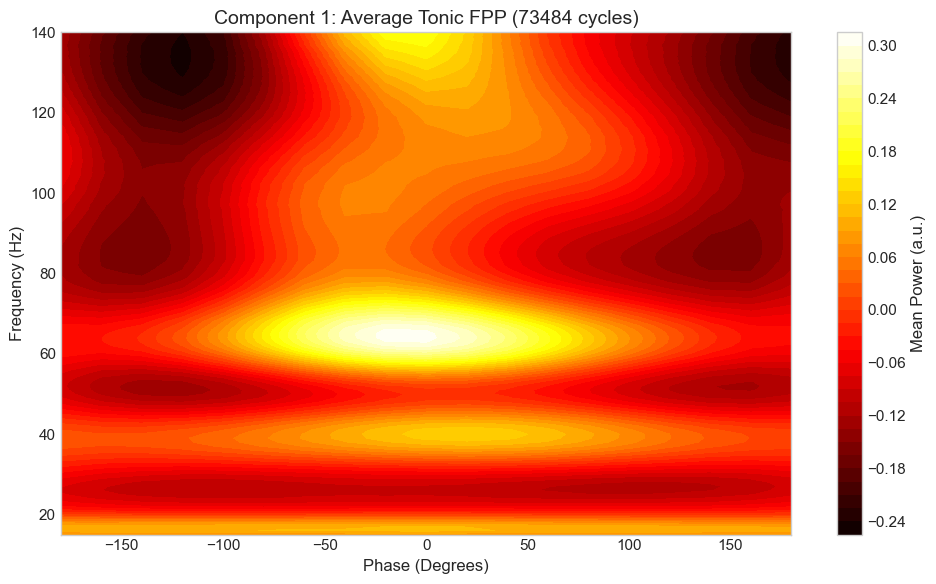


Processing Component 2...
Saved plot: Os_Basic_Dataset_FPPs_Component_Analysis/component_2_phasic_FPP.svg


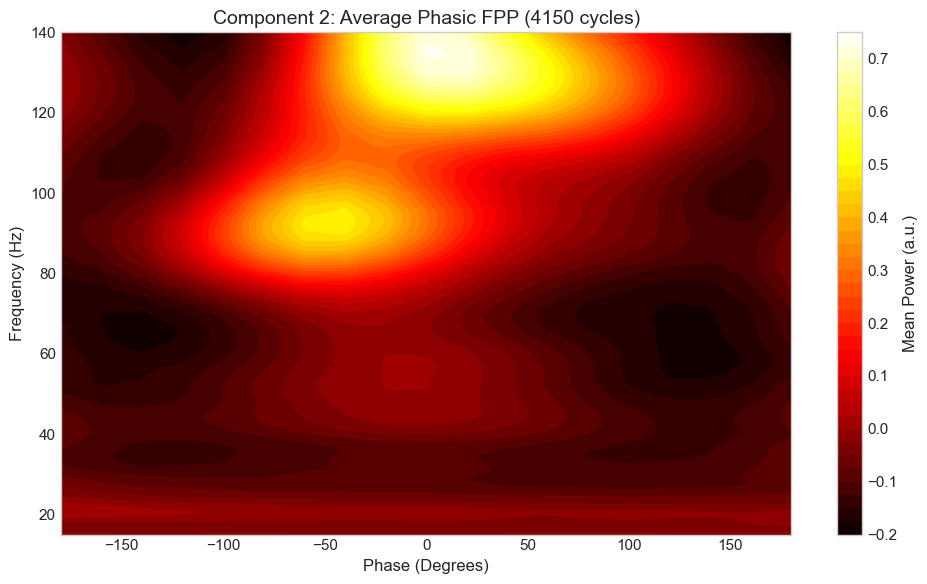

Saved plot: Os_Basic_Dataset_FPPs_Component_Analysis/component_2_tonic_FPP.svg


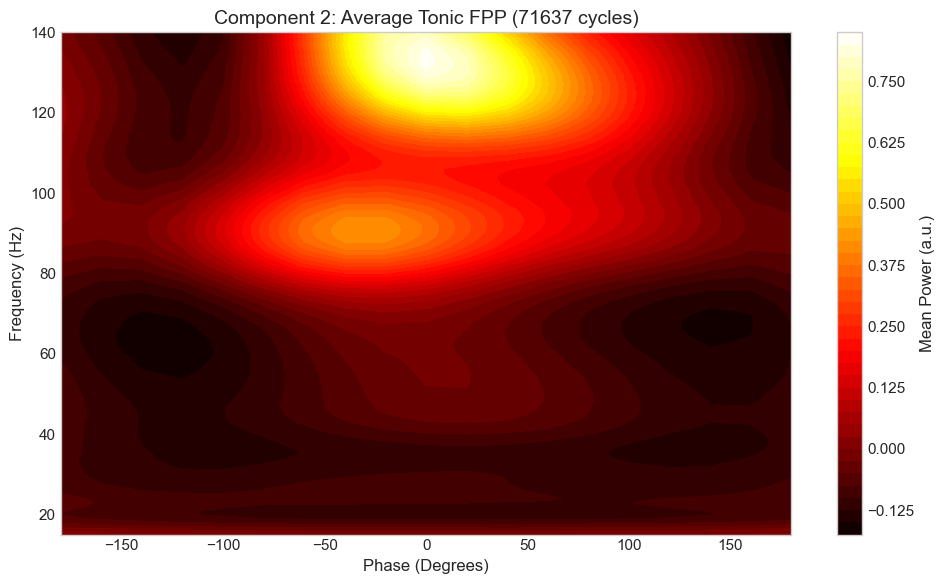


Processing Component 3...
Saved plot: Os_Basic_Dataset_FPPs_Component_Analysis/component_3_phasic_FPP.svg


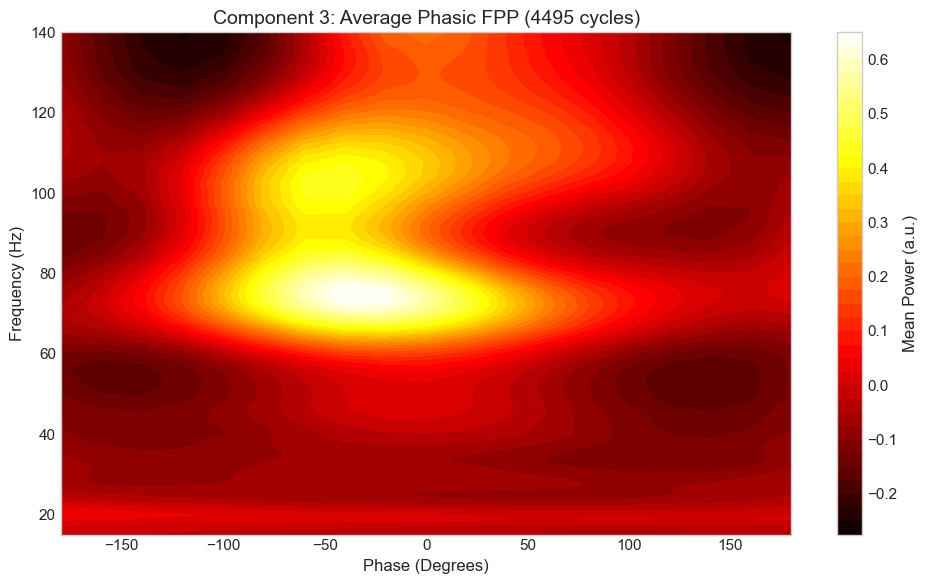

Saved plot: Os_Basic_Dataset_FPPs_Component_Analysis/component_3_tonic_FPP.svg


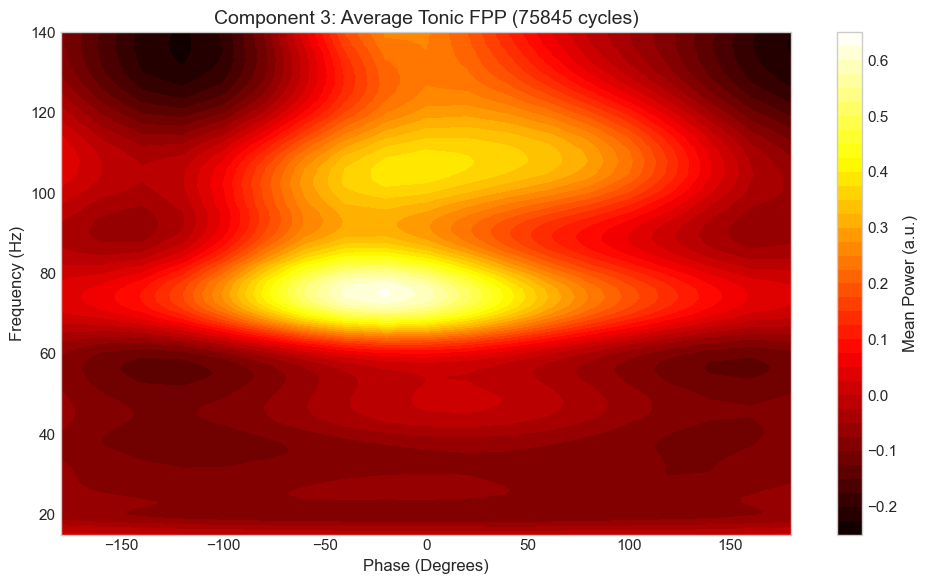


Processing Component 4...
Saved plot: Os_Basic_Dataset_FPPs_Component_Analysis/component_4_phasic_FPP.svg


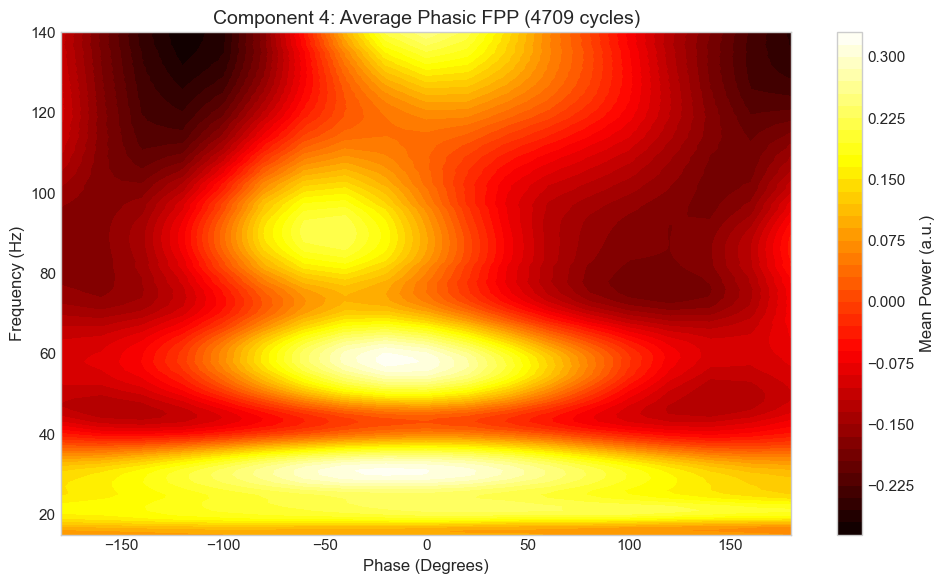

Saved plot: Os_Basic_Dataset_FPPs_Component_Analysis/component_4_tonic_FPP.svg


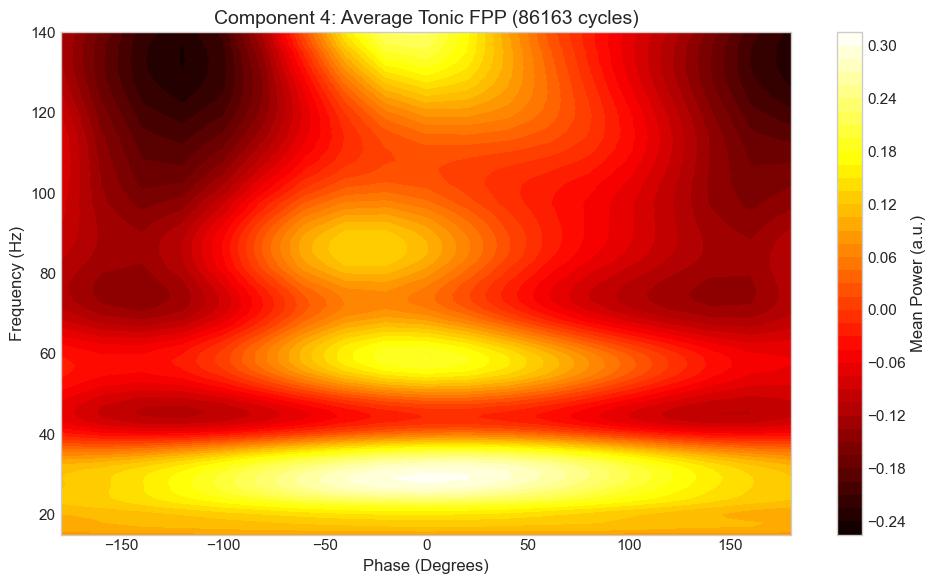


Processing Component 5...
Saved plot: Os_Basic_Dataset_FPPs_Component_Analysis/component_5_phasic_FPP.svg


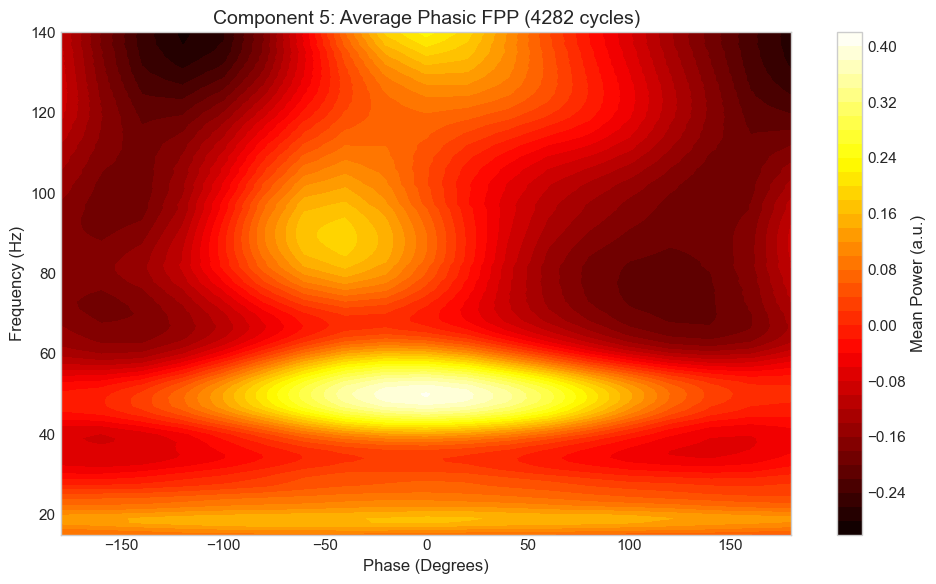

Saved plot: Os_Basic_Dataset_FPPs_Component_Analysis/component_5_tonic_FPP.svg


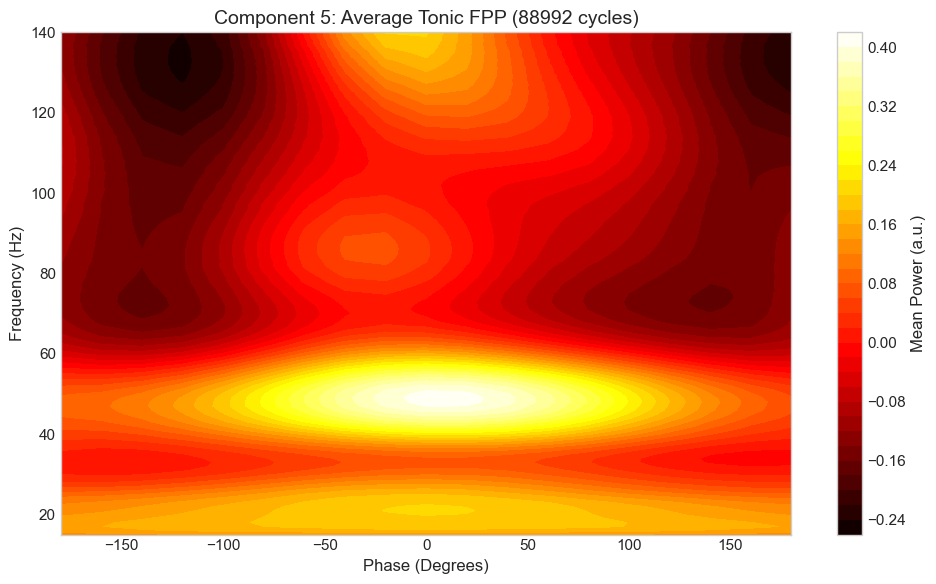

In [9]:
import os
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
from sklearn.decomposition import PCA, FastICA

# Assume 'phasic_fpps' and 'tonic_fpps' are loaded from your .npy files.

save_folder = "Os_Basic_Dataset_FPPs_Component_Analysis"
os.makedirs(save_folder, exist_ok=True)

###########################################
# 0. NEW - Data Processor with YOUR Custom Signature Logic
###########################################
def process_and_flatten_with_custom_signature(fpps_by_rat):
    """
    Iterates through the nested FPP data once to efficiently:
    1. Create a flat list of all 2D FPP arrays for later plotting.
    2. Create a flat array of 1D spectral signatures using the user's
       specific custom logic (normalization, sum, smoothing, scaling).
    """
    all_2d_fpps_list = []
    all_1d_custom_sss_list = []

    # Nested loops to access each individual 2D FPP
    for rat_data_list in fpps_by_rat:
        if not isinstance(rat_data_list, list):
            continue
        for interval_3d_array in rat_data_list:
            if isinstance(interval_3d_array, np.ndarray) and interval_3d_array.ndim == 3 and interval_3d_array.shape[0] > 0:
                for i in range(interval_3d_array.shape[0]):
                    # --- Task 1: Store the raw 2D FPP for later plotting ---
                    fpp_2d = interval_3d_array[i, :, :]
                    all_2d_fpps_list.append(fpp_2d)

                    # --- Task 2: Calculate the 1D signature with YOUR logic ---
                    # Step 1: Absolute value and sum for normalization
                    fpp_abs = np.abs(fpp_2d)
                    fpp_sum = np.sum(fpp_abs)
                    
                    # Step 2: Normalize the 2D FPP
                    normalized_fpp = fpp_abs / fpp_sum if fpp_sum > 1e-9 else fpp_abs
                    
                    # Step 3: Sum across phase axis to get 1D signature
                    signature_1d = np.sum(normalized_fpp, axis=1)
                    
                    # Step 4: Smooth with a moving average filter
                    window_size = 5  # As specified in your function
                    signature_smoothed = np.convolve(signature_1d, np.ones(window_size)/window_size, mode='same')
                    
                    # Step 5: Min-Max scale the final 1D signature
                    sig_min, sig_max = np.min(signature_smoothed), np.max(signature_smoothed)
                    if (sig_max - sig_min) > 1e-9:
                        signature_final = (signature_smoothed - sig_min) / (sig_max - sig_min)
                    else: # Handle flat line case
                        signature_final = np.zeros_like(signature_smoothed)
                        
                    all_1d_custom_sss_list.append(signature_final)

    return all_2d_fpps_list, np.array(all_1d_custom_sss_list)


# --- Helper functions (Unchanged) ---
# (Using the detailed plotting function you like)

def process_and_plot_spectral_components(data, n_components, frequencies, title_suffix, save_path):
    plt.style.use('seaborn-v0_8-whitegrid')
    pca = PCA(n_components=n_components, random_state=42)
    pca_result = pca.fit_transform(data)
    ica = FastICA(n_components=n_components, random_state=42, max_iter=1000, tol=0.001)
    tSCs = ica.fit_transform(pca_result)
    ica_components = ica.components_
    tSCs_weights_original = np.dot(ica_components, pca.components_)
    
    peak_frequencies = []
    print("\n--- ICA Component Peak Frequencies (Using Your Custom Signatures) ---")
    for i in range(n_components):
        idx_peak = np.argmax(np.abs(tSCs_weights_original[i, :]))
        peak_freq = frequencies[idx_peak]
        peak_frequencies.append(peak_freq)
        print(f"Peak frequency of tSC{i+1} ({title_suffix}): {peak_freq:.2f} Hz")
    
    plt.figure(figsize=(16, 8))
    for i in range(n_components):
        label = f'tSC{i+1} (peak={peak_frequencies[i]:.2f} Hz)'
        plt.plot(frequencies, tSCs_weights_original[i, :], label=label, lw=2)

    plt.xlabel('Frequency (Hz)', fontsize=14)
    plt.ylabel('Weight', fontsize=14)
    plt.title(f'Theta Spectral Components (tSCs) - {title_suffix}', fontsize=16)
    plt.legend(fontsize=12)
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()

    return tSCs, tSCs_weights_original

def group_cycles_by_component(assigned_components):
    cycles_by_comp = defaultdict(list)
    for cycle_idx, comp_idx in enumerate(assigned_components):
        cycles_by_comp[comp_idx].append(cycle_idx)
    return cycles_by_comp

def plot_average_fpp(avg_fpp, angles, frequencies, title, filename):
    plt.figure(figsize=(10, 6))
    plt.contourf(angles, frequencies, avg_fpp, 40, cmap='hot')
    plt.colorbar(label='Mean Power (a.u.)')
    plt.xlabel('Phase (Degrees)', fontsize=12)
    plt.ylabel('Frequency (Hz)', fontsize=12)
    plt.title(title, fontsize=14)
    plt.tight_layout()
    plt.savefig(filename, format='svg')
    print(f"Saved plot: {filename}")
    plt.show()

# --- MAIN ANALYSIS PIPELINE ---

###########################################
# 4. Prepare data using YOUR custom logic in our efficient pipeline
###########################################
print("\n--- Flattening Data and Generating Custom Signatures ---")
phasic_fpps_list, phasic_sss_custom = process_and_flatten_with_custom_signature(phasic_fpps)
tonic_fpps_list, tonic_sss_custom = process_and_flatten_with_custom_signature(tonic_fpps)

combined_all_fpps_list = phasic_fpps_list + tonic_fpps_list
# This is the crucial input for the ICA, created with your logic
combined_all_sss = np.concatenate([phasic_sss_custom, tonic_sss_custom], axis=0)

n_phasic = len(phasic_fpps_list)
n_total = len(combined_all_fpps_list)
cycle_labels = np.array(['phasic'] * n_phasic + ['tonic'] * (n_total - n_phasic))

if n_total > 0:
    num_freq_bins = combined_all_fpps_list[0].shape[0]
    num_phase_bins = combined_all_fpps_list[0].shape[1]
    frequencies = np.arange(15, 15 + num_freq_bins)
    angles = np.linspace(-180, 180, num_phase_bins)
    print(f"Total phasic cycles: {n_phasic}")
    print(f"Total tonic cycles: {len(tonic_fpps_list)}")
    print(f"Shape of custom spectral signatures array for ICA: {combined_all_sss.shape}")
else:
    raise ValueError("No data found after flattening. Check your input files.")

###########################################
# 5. Run PCA/ICA on YOUR custom signatures
###########################################
n_components_pca = 5
combined_title = "Combined Cycles - All rats"
combined_save_path = os.path.join(save_folder, "spectral_components_with_custom_signatures.svg")

combined_tSCs, _ = process_and_plot_spectral_components(
    combined_all_sss,
    n_components_pca,
    frequencies,
    combined_title,
    combined_save_path
)

###########################################
# 6. Assign cycles to components
###########################################
cycles_by_comp = {}
if combined_tSCs is not None:
    print("\n--- Assigning Cycles to Components ---")
    assigned_components = np.argmax(np.abs(combined_tSCs), axis=1)
    cycles_by_comp = group_cycles_by_component(assigned_components)
    for comp_idx, indices in sorted(cycles_by_comp.items()):
        phasic_count = np.sum(cycle_labels[indices] == 'phasic')
        tonic_count = np.sum(cycle_labels[indices] == 'tonic')
        print(f"Component {comp_idx + 1}: {phasic_count} phasic cycles, {tonic_count} tonic cycles")

###########################################
# 7. For each component, average the original FPPs and plot
###########################################
print("\n--- Generating Average FPPs for Each Component ---")
if cycles_by_comp:
    for comp_idx, indices in sorted(cycles_by_comp.items()):
        print(f"\nProcessing Component {comp_idx + 1}...")
        phasic_indices = [i for i in indices if cycle_labels[i] == 'phasic']
        tonic_indices = [i for i in indices if cycle_labels[i] == 'tonic']

        if len(phasic_indices) > 0:
            avg_phasic_fpp = np.mean([combined_all_fpps_list[i] for i in phasic_indices], axis=0)
            plot_title = f'Component {comp_idx + 1}: Average Phasic FPP ({len(phasic_indices)} cycles)'
            plot_filename = os.path.join(save_folder, f'component_{comp_idx+1}_phasic_FPP.svg')
            plot_average_fpp(avg_phasic_fpp, angles, frequencies, plot_title, plot_filename)
        
        if len(tonic_indices) > 0:
            avg_tonic_fpp = np.mean([combined_all_fpps_list[i] for i in tonic_indices], axis=0)
            plot_title = f'Component {comp_idx + 1}: Average Tonic FPP ({len(tonic_indices)} cycles)'
            plot_filename = os.path.join(save_folder, f'component_{comp_idx+1}_tonic_FPP.svg')
            plot_average_fpp(avg_tonic_fpp, angles, frequencies, plot_title, plot_filename)
else:
    print("No components found, skipping FPP plotting.")

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
from sklearn.decomposition import PCA, FastICA
from mpl_toolkits.axes_grid1 import make_axes_locatable


# --- Configuration ---
PLOTS_FOLDER = "final_component_plots"
os.makedirs(PLOTS_FOLDER, exist_ok=True)


# ===================================================================
# ---                  ANALYSIS FUNCTIONS                         ---
# ===================================================================

def process_and_flatten_with_custom_signature(fpps_by_rat):
    """
    Iterates through the nested FPP data once to efficiently:
    1. Create a flat list of all 2D FPP arrays.
    2. Create a flat array of 1D spectral signatures using your custom logic.
    """
    all_2d_fpps_list = []
    all_1d_custom_sss_list = []
    for rat_data_list in fpps_by_rat:
        if not isinstance(rat_data_list, list): continue
        for interval_3d_array in rat_data_list:
            if isinstance(interval_3d_array, np.ndarray) and interval_3d_array.ndim == 3:
                for i in range(interval_3d_array.shape[0]):
                    fpp_2d = interval_3d_array[i, :, :]
                    all_2d_fpps_list.append(fpp_2d)
                    
                    # Calculate the 1D signature with YOUR logic
                    fpp_abs = np.abs(fpp_2d)
                    normalized_fpp = fpp_abs / np.sum(fpp_abs) if np.sum(fpp_abs) > 1e-9 else fpp_abs
                    signature_1d = np.sum(normalized_fpp, axis=1)
                    signature_smoothed = np.convolve(signature_1d, np.ones(5)/5, mode='same')
                    sig_min, sig_max = np.min(signature_smoothed), np.max(signature_smoothed)
                    if (sig_max - sig_min) > 1e-9:
                        signature_final = (signature_smoothed - sig_min) / (sig_max - sig_min)
                    else:
                        signature_final = np.zeros_like(signature_smoothed)
                    all_1d_custom_sss_list.append(signature_final)
    return all_2d_fpps_list, np.array(all_1d_custom_sss_list)

def run_ica_analysis(data, n_components):
    """
    Performs PCA and ICA analysis ONLY. Returns the results for later plotting.
    """
    if data.size == 0:
        print("[Warning] Empty data for PCA/ICA. Skipping.")
        return None, None
    pca = PCA(n_components=n_components, random_state=42)
    pca_result = pca.fit_transform(data)
    ica = FastICA(n_components=n_components, random_state=42, max_iter=1000, tol=0.001)
    tSCs = ica.fit_transform(pca_result)
    ica_components = ica.components_
    tSCs_weights_original = np.dot(ica_components, pca.components_)
    return tSCs, tSCs_weights_original



In [95]:
def plot_ica_components(ica_weights, frequencies, title_suffix, save_path):
    # This function is correct and remains unchanged.
    peak_frequencies = []
    print("\n--- ICA Component Peak Frequencies (Using Your Custom Signatures) ---")
    for i in range(ica_weights.shape[0]):
        idx_peak = np.argmax(np.abs(ica_weights[i, :]))
        peak_freq = frequencies[idx_peak]
        peak_frequencies.append(peak_freq)
        print(f"Peak frequency of tSC{i+1} ({title_suffix}): {peak_freq:.2f} Hz")
    
    colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']
    plt.figure(figsize=(14, 7))
    for i in range(ica_weights.shape[0]):
        label = f'tSC{i+1} (peak={peak_frequencies[i]:.2f} Hz)'
        plt.plot(frequencies, ica_weights[i, :], color=colors[i % len(colors)], label=label, lw=2)
        peak_idx = np.where(frequencies == peak_frequencies[i])[0]
        if len(peak_idx) > 0:
            idxp = peak_idx[0]
            plt.scatter(peak_frequencies[i], ica_weights[i, idxp], color=colors[i % len(colors)], edgecolor='k', zorder=5, s=50)
            plt.annotate(f'{peak_frequencies[i]:.0f} Hz', xy=(peak_frequencies[i], ica_weights[i, idxp]),
                         xytext=(peak_frequencies[i]+1, ica_weights[i, idxp]+0.01),
                         arrowprops=dict(facecolor='black', shrink=0.05, width=1, headwidth=5),
                         fontsize=10, bbox=dict(boxstyle="round,pad=0.3", fc="yellow", ec="k", lw=1, alpha=0.7))
    
    plt.xlabel('Frequency (Hz)', fontsize=14); plt.ylabel('Weight', fontsize=16)
    plt.title(f'Theta Spectral Components (tSCs) - {title_suffix}', fontsize=16)
    plt.legend(fontsize=12); plt.grid(True, linestyle='--', alpha=0.7); plt.tight_layout()
    plt.savefig(save_path); print(f"Saved ICA component plot to: {save_path}"); plt.show()

def plot_average_fpp_detailed(avg_fpp, angles, frequencies, title, filename, vmin, vmax):
    """
    FINAL CORRECTED VERSION: Plots the FPP *without* an attached colorbar.
    The colors are still scaled according to vmin and vmax.
    """
    profile_1d = np.sum(avg_fpp, axis=1)
    profile_smoothed = np.convolve(profile_1d, np.ones(5)/5, mode='same')
    prof_min, prof_max = np.min(profile_smoothed), np.max(profile_smoothed)
    profile_norm = (profile_smoothed - prof_min) / (prof_max - prof_min) if (prof_max - prof_min) > 1e-9 else np.zeros_like(profile_smoothed)
    scaled_profile = profile_norm * (angles[-1] - angles[0]) * 0.4 + angles[0]
    max_index = np.unravel_index(np.argmax(avg_fpp, axis=None), avg_fpp.shape)
    mode_frequency = frequencies[max_index[0]]

    fig, ax = plt.subplots(figsize=(4, 5))
    
    # Plot the contour plot. The white patches for out-of-range values are expected.
    ax.contourf(angles, frequencies, avg_fpp, 40, cmap='hot', vmin=vmin, vmax=vmax)
    
    # ALL COLORBAR CODE HAS BEEN REMOVED FROM THIS FUNCTION
    
    ax.plot(scaled_profile, frequencies, color='cyan', linewidth=2.5, alpha=0.9)
    ax.axhline(mode_frequency, color='white', linestyle='--', linewidth=2, alpha=0.9)
    ax.text(angles[-1] * 0.95, mode_frequency + 2, f'{int(mode_frequency)} Hz', 
            color='white', ha='right', va='bottom', fontsize=12, weight='bold',
            bbox=dict(facecolor='black', alpha=0.5, edgecolor='none', pad=2.0))
            
    ax.set_xlabel('Phase (Degrees)', fontsize=14)
    ax.set_ylabel('Frequency (Hz)', fontsize=14)
    ax.set_xlim(angles[0], angles[-1])
    ax.set_ylim(frequencies[0], frequencies[-1])
    ax.set_title(title, fontsize=14)
    
    plt.tight_layout()
    plt.savefig(filename, format='svg')
    print(f"Saved FPP plot: {filename}")
    plt.show()

In [10]:

# ===================================================================
# ---              MAIN EXECUTION PIPELINE                        ---
# ===================================================================

# --- Part 1: Run Full Analysis in Memory ---
print("--- Starting Analysis ---")

print("Step 1: Flattening data and generating custom signatures...")
phasic_fpps_list, phasic_sss_custom = process_and_flatten_with_custom_signature(phasic_fpps)
tonic_fpps_list, tonic_sss_custom = process_and_flatten_with_custom_signature(tonic_fpps)

combined_all_fpps_list = phasic_fpps_list + tonic_fpps_list
combined_all_sss = np.concatenate([phasic_sss_custom, tonic_sss_custom], axis=0)

n_phasic = len(phasic_fpps_list)
cycle_labels = np.array(['phasic'] * n_phasic + ['tonic'] * len(tonic_fpps_list))

print("Step 2: Running ICA analysis...")
n_components_pca = 5
combined_tSCs, combined_weights = run_ica_analysis(combined_all_sss, n_components_pca)

print("Step 3: Assigning cycles to components...")
cycles_by_comp = defaultdict(list)
if combined_tSCs is not None:
    assigned_components = np.argmax(np.abs(combined_tSCs), axis=1)
    for cycle_idx, comp_idx in enumerate(assigned_components):
        cycles_by_comp[comp_idx].append(cycle_idx)
    for comp_idx, indices in sorted(cycles_by_comp.items()):
        phasic_count = np.sum(cycle_labels[indices] == 'phasic')
        tonic_count = np.sum(cycle_labels[indices] == 'tonic')
        print(f"  Component {comp_idx + 1}: {phasic_count} phasic cycles, {tonic_count} tonic cycles")
else:
    print("Could not perform cycle assignment.")

print("\n--- Analysis Complete. All results are in memory. ---")

--- Starting Analysis ---
Step 1: Flattening data and generating custom signatures...
Step 2: Running ICA analysis...
Step 3: Assigning cycles to components...
  Component 1: 4085 phasic cycles, 73484 tonic cycles
  Component 2: 4150 phasic cycles, 71637 tonic cycles
  Component 3: 4495 phasic cycles, 75845 tonic cycles
  Component 4: 4709 phasic cycles, 86163 tonic cycles
  Component 5: 4282 phasic cycles, 88992 tonic cycles

--- Analysis Complete. All results are in memory. ---



--- Starting Plot Generation ---

--- ICA Component Peak Frequencies (Using Your Custom Signatures) ---
Peak frequency of tSC1 (Combined Cycles - All rats): 39.00 Hz
Peak frequency of tSC2 (Combined Cycles - All rats): 130.00 Hz
Peak frequency of tSC3 (Combined Cycles - All rats): 75.00 Hz
Peak frequency of tSC4 (Combined Cycles - All rats): 58.00 Hz
Peak frequency of tSC5 (Combined Cycles - All rats): 84.00 Hz
Saved ICA component plot to: final_component_plots/ICA_components_summary.svg


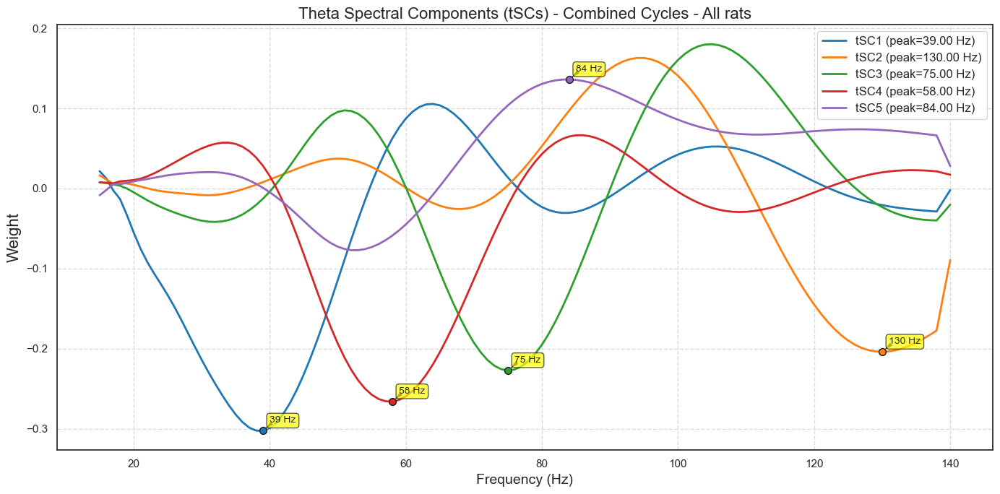


Calculating global color range for FPP plots...


KeyboardInterrupt: 

In [90]:
# --- Part 2: Generate All Plots from In-Memory Results ---
print("\n--- Starting Plot Generation ---")

if cycles_by_comp:
    # Define axes
    num_freq_bins = combined_all_fpps_list[0].shape[0]
    num_phase_bins = combined_all_fpps_list[0].shape[1]
    frequencies = np.arange(15, 15 + num_freq_bins)
    angles = np.linspace(-180, 180, num_phase_bins)

    # Plot 1: ICA Component Weights
    plot_ica_components(
        combined_weights,
        frequencies,
        title_suffix="Combined Cycles - All rats",
        save_path=os.path.join(PLOTS_FOLDER, "ICA_components_summary.svg")
    )
    
    # Plot 2: Per-Component FPPs
    print("\nCalculating global color range for FPP plots...")
    all_average_fpps = []
    for comp_idx, indices in cycles_by_comp.items():
        if len(indices) > 0:
            phasic_idx = [i for i in indices if cycle_labels[i] == 'phasic']
            tonic_idx = [i for i in indices if cycle_labels[i] == 'tonic']
            if len(phasic_idx) > 0: all_average_fpps.append(np.mean([combined_all_fpps_list[i] for i in phasic_idx], axis=0))
            if len(tonic_idx) > 0: all_average_fpps.append(np.mean([combined_all_fpps_list[i] for i in tonic_idx], axis=0))

    vmin = np.min([np.min(fpp) for fpp in all_average_fpps]) if all_average_fpps else 0
    vmax = np.percentile([fpp for fpp in all_average_fpps], 99.8) if all_average_fpps else 1
    print(f"Using global color range: vmin={vmin:.4f}, vmax={vmax:.4f}")

    for comp_idx, indices in sorted(cycles_by_comp.items()):
        print(f"\n--- Plotting FPPs for Component {comp_idx + 1} ---")
        phasic_indices = [i for i in indices if cycle_labels[i] == 'phasic']
        if len(phasic_indices) > 0:
            avg_phasic_fpp = np.mean([combined_all_fpps_list[i] for i in phasic_indices], axis=0)
            plot_average_fpp_detailed(
                avg_phasic_fpp, angles, frequencies,
                title=f'Component {comp_idx + 1}: Average Phasic FPP ({len(phasic_indices)} cycles)',
                filename=os.path.join(PLOTS_FOLDER, f'component_{comp_idx+1}_phasic_FPP.svg'),
                vmin=vmin, vmax=vmax
            )
        
        tonic_indices = [i for i in indices if cycle_labels[i] == 'tonic']
        if len(tonic_indices) > 0:
            avg_tonic_fpp = np.mean([combined_all_fpps_list[i] for i in tonic_indices], axis=0)
            plot_average_fpp_detailed(
                avg_tonic_fpp, angles, frequencies,
                title=f'Component {comp_idx + 1}: Average Tonic FPP ({len(tonic_indices)} cycles)',
                filename=os.path.join(PLOTS_FOLDER, f'component_{comp_idx+1}_tonic_FPP.svg'),
                vmin=vmin, vmax=vmax
            )
else:
    print("No components were found, skipping all plotting.")


--- Starting Plot Generation ---

--- ICA Component Peak Frequencies (Using Your Custom Signatures) ---
Peak frequency of tSC1 (Combined Cycles - All rats): 39.00 Hz
Peak frequency of tSC2 (Combined Cycles - All rats): 130.00 Hz
Peak frequency of tSC3 (Combined Cycles - All rats): 75.00 Hz
Peak frequency of tSC4 (Combined Cycles - All rats): 58.00 Hz
Peak frequency of tSC5 (Combined Cycles - All rats): 84.00 Hz
Saved ICA component plot to: final_component_plots/ICA_components_summary.svg


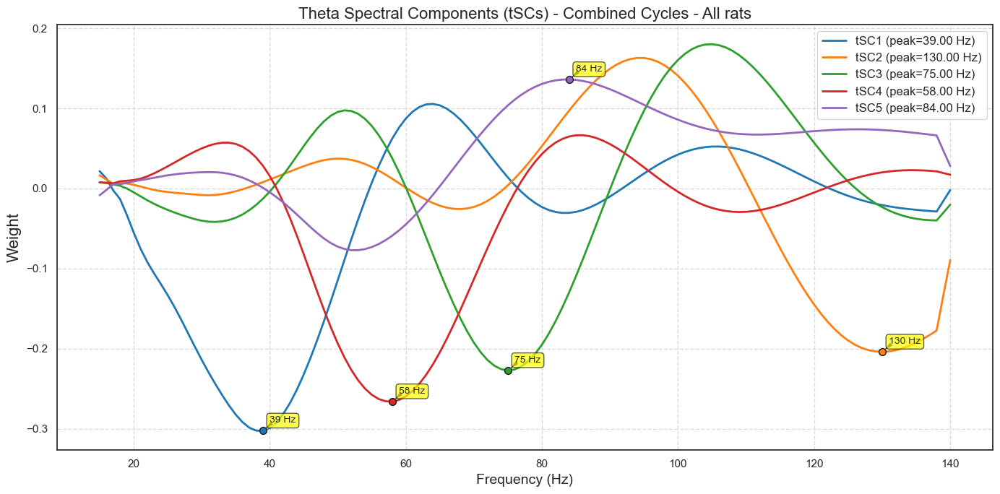


Setting fixed color range for FPP plots...
Using fixed color range: vmin=-0.2, vmax=0.5

--- Plotting FPPs for Component 1 ---
Saved FPP plot: final_component_plots/component_1_phasic_FPP.svg


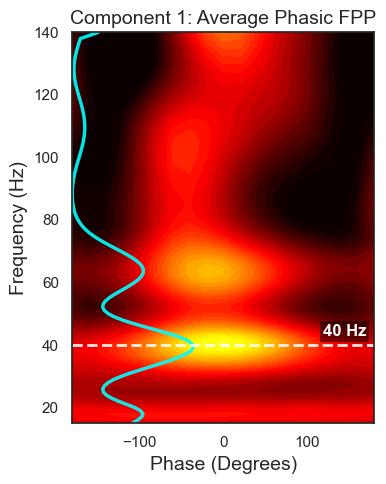

Saved FPP plot: final_component_plots/component_1_tonic_FPP.svg


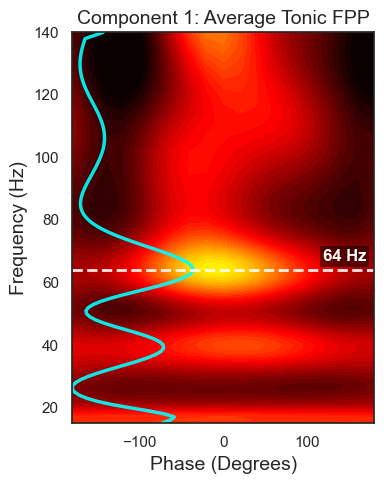


--- Plotting FPPs for Component 2 ---
Saved FPP plot: final_component_plots/component_2_phasic_FPP.svg


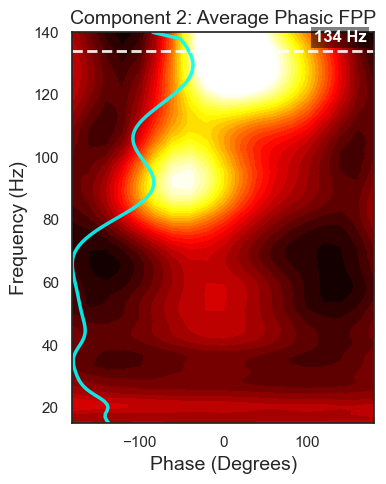

Saved FPP plot: final_component_plots/component_2_tonic_FPP.svg


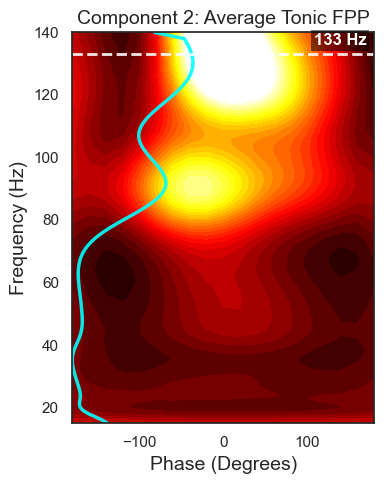


--- Plotting FPPs for Component 3 ---
Saved FPP plot: final_component_plots/component_3_phasic_FPP.svg


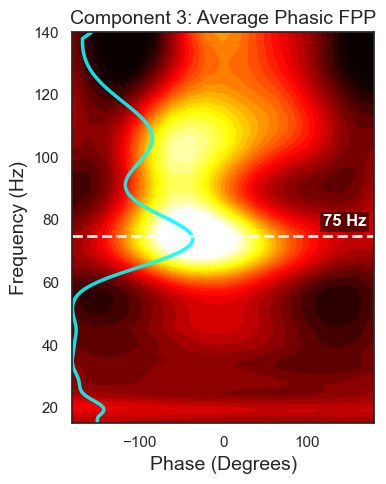

Saved FPP plot: final_component_plots/component_3_tonic_FPP.svg


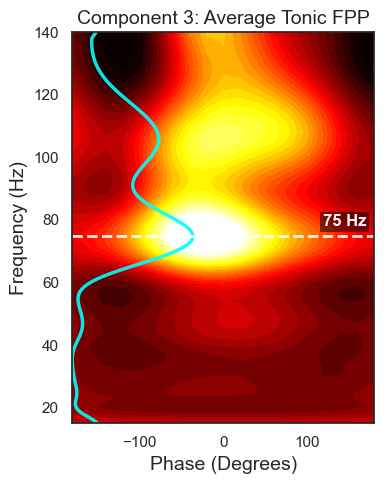


--- Plotting FPPs for Component 4 ---
Saved FPP plot: final_component_plots/component_4_phasic_FPP.svg


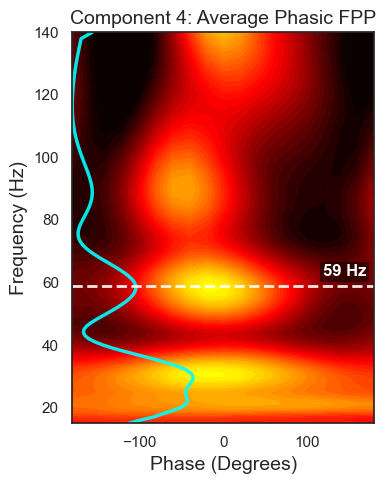

Saved FPP plot: final_component_plots/component_4_tonic_FPP.svg


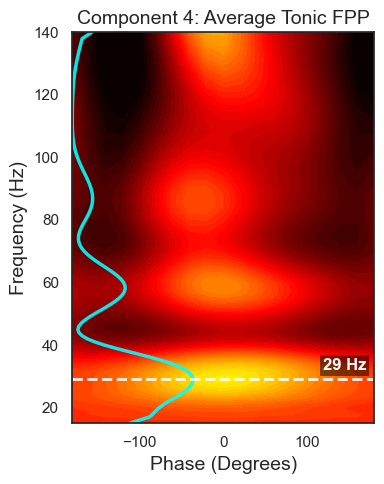


--- Plotting FPPs for Component 5 ---
Saved FPP plot: final_component_plots/component_5_phasic_FPP.svg


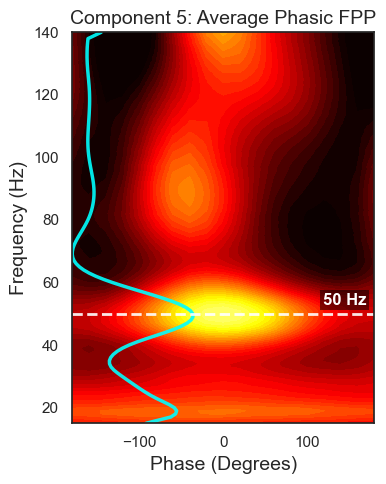

Saved FPP plot: final_component_plots/component_5_tonic_FPP.svg


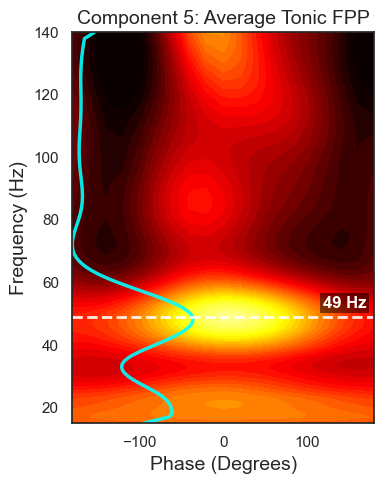

In [96]:
# --- Part 2: Generate All Plots from In-Memory Results ---
print("\n--- Starting Plot Generation ---")

if cycles_by_comp:
    num_freq_bins = combined_all_fpps_list[0].shape[0]
    num_phase_bins = combined_all_fpps_list[0].shape[1]
    frequencies = np.arange(15, 15 + num_freq_bins)
    angles = np.linspace(-180, 180, num_phase_bins)

    plot_ica_components(
        combined_weights, frequencies,
        title_suffix="Combined Cycles - All rats",
        save_path=os.path.join(PLOTS_FOLDER, "ICA_components_summary.svg")
    )
    
    # MODIFIED: Set fixed color range as requested.
    print("\nSetting fixed color range for FPP plots...")
    vmin = -0.2
    vmax = 0.5
    print(f"Using fixed color range: vmin={vmin}, vmax={vmax}")

    for comp_idx, indices in sorted(cycles_by_comp.items()):
        print(f"\n--- Plotting FPPs for Component {comp_idx + 1} ---")
        phasic_indices = [i for i in indices if cycle_labels[i] == 'phasic']
        if len(phasic_indices) > 0:
            avg_phasic_fpp = np.mean([combined_all_fpps_list[i] for i in phasic_indices], axis=0)
            plot_average_fpp_detailed(
                avg_phasic_fpp, angles, frequencies,
                title=f'Component {comp_idx + 1}: Average Phasic FPP',
                filename=os.path.join(PLOTS_FOLDER, f'component_{comp_idx+1}_phasic_FPP.svg'),
                vmin=vmin, vmax=vmax
            )
        
        tonic_indices = [i for i in indices if cycle_labels[i] == 'tonic']
        if len(tonic_indices) > 0:
            avg_tonic_fpp = np.mean([combined_all_fpps_list[i] for i in tonic_indices], axis=0)
            plot_average_fpp_detailed(
                avg_tonic_fpp, angles, frequencies,
                title=f'Component {comp_idx + 1}: Average Tonic FPP',
                filename=os.path.join(PLOTS_FOLDER, f'component_{comp_idx+1}_tonic_FPP.svg'),
                vmin=vmin, vmax=vmax
            )
else:
    print("No components were found, skipping all plotting.")

Successfully saved standalone colorbar to: standalone_colorbar_0to5.svg


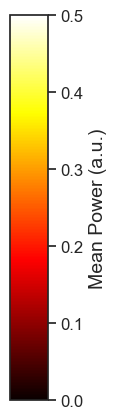

In [124]:
# --- STANDALONE COLORBAR GENERATOR ---
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np

# --- Configuration ---
VMIN = 0
VMAX = 0.5
COLORMAP = 'hot'
FILENAME = 'standalone_colorbar_0to5.svg'

# Create a figure and a set of axes. The figure size determines the final image size.
# We make it tall and skinny.
fig, ax = plt.subplots(figsize=(1, 5))

# We need to make room for the label on the right.
fig.subplots_adjust(right=0.5)

# Define the colormap and the normalization based on our fixed range.
cmap = mpl.cm.get_cmap(COLORMAP)
norm = mpl.colors.Normalize(vmin=VMIN, vmax=VMAX)

# Create the ColorbarBase. This is the object that draws a colorbar without needing an actual plot.
# We point it to our axes (ax), give it the colormap and normalization, and set the orientation.
cb = mpl.colorbar.ColorbarBase(ax, cmap=cmap, norm=norm, orientation='vertical')

# Set the label for the colorbar.
cb.set_label('Mean Power (a.u.)', fontsize=14)

# Set the ticks to match the desired appearance.
cb.set_ticks(np.arange(VMIN, VMAX + 0.1, 0.1))
cb.ax.tick_params(labelsize=12)

# Save the figure.
plt.savefig(FILENAME, format='svg', bbox_inches='tight')

print(f"Successfully saved standalone colorbar to: {FILENAME}")
plt.show()

In [82]:
import matplotlib.pyplot as plt
import numpy as np

def plot_styled_ica_components(ica_weights, frequencies, save_path=None):
    """
    Creates a scientific-style plot of ICA components where the axes
    originate from the data minimums, inspired by the reference image.

    Args:
        ica_weights (np.ndarray): The (n_components, n_frequencies) array of weights.
        frequencies (np.ndarray): The corresponding frequency axis.
        save_path (str, optional): Path to save the figure. Defaults to None.
    """
    
    # --- 1. Setup Figure and Colors ---
    fig, ax = plt.subplots(figsize=(7, 6))
    
    # Define a color palette similar to the reference image
    colors = ['#377eb8', "#cee43d", '#984ea3', '#ff7f00', '#555555', '#e41a1c']

    # --- 2. Plot Each Component and Add Text Labels ---
    for i in range(ica_weights.shape[0]):
        # Plot the component line with a thicker stroke
        ax.plot(frequencies, ica_weights[i, :], color=colors[i % len(colors)], lw=2.5)

        # Find the peak to place the text label
        # We use the index of the maximum absolute value for positioning
        idx_peak = np.argmax(np.abs(ica_weights[i, :]))
        x_pos = frequencies[idx_peak]
        y_pos = ica_weights[i, idx_peak]
        
        # Add a small vertical offset to the text so it doesn't overlap the line
        y_offset = 0.02 if y_pos >= 0 else -0.02
        
        # Determine vertical alignment based on peak direction
        vertical_alignment = 'bottom' if y_pos >= 0 else 'top'

        # Add the text label
        ax.text(x_pos, y_pos + y_offset, f'tSC{i+1} ({x_pos:.1f}Hz)', 
                color=colors[i % len(colors)], 
                ha='center', 
                va=vertical_alignment,
                fontsize=12,
                fontweight='normal')

    # --- 3. Style the Axes (The Crucial Part) ---

    # Remove the top and right spines to open up the plot
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    # Set the axis limits with a little padding
    x_min_lim, x_max_lim = frequencies.min(), frequencies.max()
    y_min_lim = ica_weights.min() - 0.05
    y_max_lim = ica_weights.max() + 0.05
    ax.set_xlim(x_min_lim, x_max_lim)
    ax.set_ylim(y_min_lim, y_max_lim)

    # Move the remaining left and bottom spines to the data's zero-point
    # This is the key step to make the axes "collide at the min"
    ax.spines['bottom'].set_position(('data', y_min_lim))
    ax.spines['left'].set_position(('data', x_min_lim))
    
    # Set the direction of the ticks to be outward
    ax.tick_params(axis='both', direction='out', length=6, width=1.5)

    # --- 4. Add Labels and Final Touches ---
    ax.set_xlabel('Frequency (Hz)', fontsize=16)
    ax.set_ylabel('Weight', fontsize=16)
    
    # Add the "Theta SCs" text in the top right corner using axis-relative coordinates
    ax.text(0.95, 0.95, 'Theta Components', 
            transform=ax.transAxes, 
            ha='right', 
            va='top', 
            fontsize=16, 
            fontweight='bold')
            
    plt.tight_layout()
    
    # Save the figure if a path is provided
    if save_path:
        plt.savefig(save_path, format='svg', bbox_inches='tight')
        print(f"Saved styled ICA plot to: {save_path}")
        
    plt.show()

Saved styled ICA plot to: final_component_plots/ICA_components_styled.svg


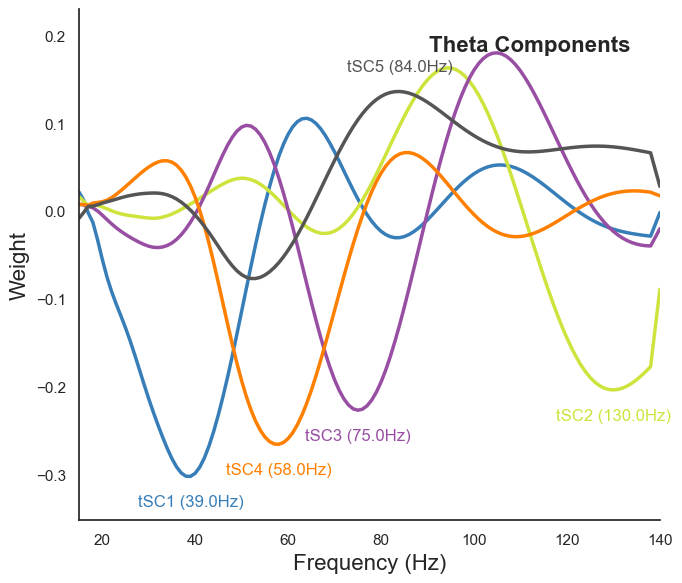

In [83]:
# Call the new plotting function
plot_styled_ica_components(
    combined_weights, 
    frequencies, 
    save_path=os.path.join(PLOTS_FOLDER, "ICA_components_styled.svg")
)

In [27]:
# --- Plot the SMOOTHED Grand Average FPP for ALL cycles (Hard-Coded Color Range) ---

from scipy.ndimage import gaussian_filter

    
    # 1. Calculate the grand average across every single FPP
print(f"Averaging across all {len(combined_all_fpps_list)} cycles...")
grand_average_fpp = np.mean(combined_all_fpps_list, axis=0)
    
    # 2. THE KEY STEP: Apply a 2D Gaussian filter to smooth the averaged data
    # The 'sigma' parameter controls the amount of smoothing.
    # It can be a single number or a tuple: (sigma_for_frequency, sigma_for_phase)
    # A larger sigma means more smoothing.
smoothing_sigma = (2, 1) # Smooth more along the frequency axis than the phase axis
print(f"Applying 2D Gaussian filter with sigma={smoothing_sigma}...")
grand_average_fpp_smoothed = gaussian_filter(grand_average_fpp, sigma=smoothing_sigma)
    
    # 3. Define plot details
title = f"Grand Average FPP (Smoothed, All {len(combined_all_fpps_list)} Cycles)"
filename = os.path.join(PLOTS_FOLDER, 'grand_average_FPP_all_cycles_smoothed_hard_limits.svg')
    

Averaging across all 417842 cycles...
Applying 2D Gaussian filter with sigma=(2, 1)...


In [30]:
# A new, simplified plotting function for the super-smooth plots
def plot_interpolated_fpp(data, x_axis, y_axis, title, filename, vmin, vmax, ylim=None):
    """
    Plots a highly-smoothed FPP using pre-interpolated data.
    This version has no overlays (no cyan line, no mode frequency line).
    """
    fig, ax = plt.subplots(figsize=(12, 8))
    
    # Use the pre-interpolated data to create a very smooth contour plot
    ax.contourf(x_axis, y_axis, data, 60, cmap='hot', vmin=vmin, vmax=vmax)
    
    # Set labels and title
    ax.set_xlabel('Phase (Degrees)', fontsize=14)
    ax.set_ylabel('Frequency (Hz)', fontsize=14)
    ax.set_title(title, fontsize=16)
    
    # Set the y-axis limits if provided
    if ylim:
        ax.set_ylim(ylim)
    else:
        ax.set_ylim(y_axis.min(), y_axis.max())
        
    ax.set_xlim(x_axis.min(), x_axis.max())
    
    plt.tight_layout()
    plt.savefig(filename, format='svg')
    print(f"Saved smoothed plot: {filename}")
    plt.show()


--- Generating SUPER-SMOOTHED Grand Average FPP (Clipped 20-135 Hz) ---
Saved smoothed plot: final_component_plots/grand_average_FPP_super_smoothed_clipped.svg


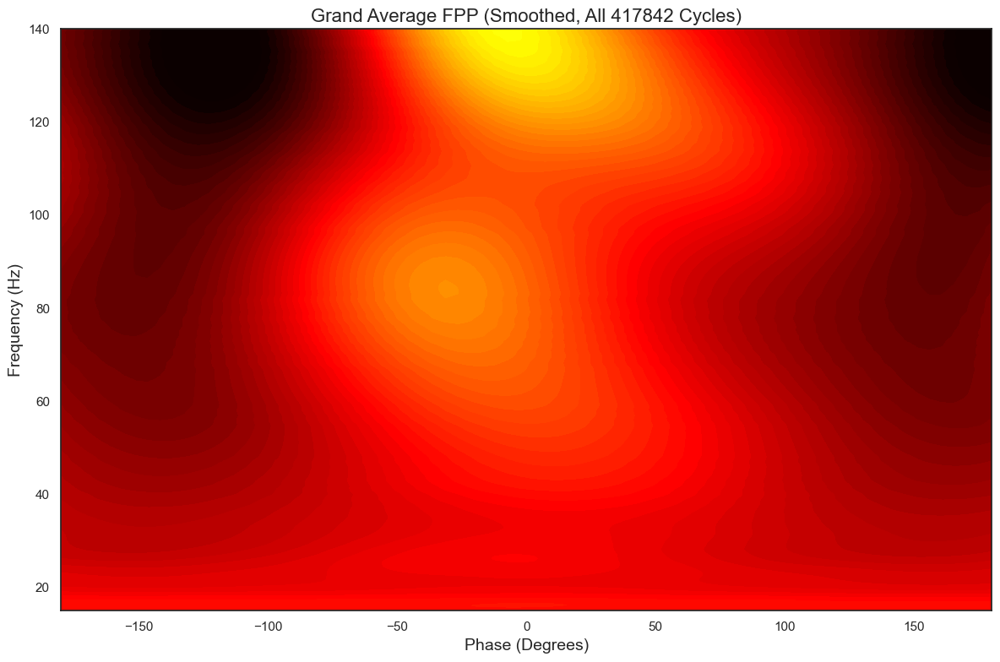

In [59]:
# --- Version 2: Super-Smoothed Grand Average with CORRECTED Interpolation (Clipped) ---

from scipy.interpolate import RectBivariateSpline

print("\n--- Generating SUPER-SMOOTHED Grand Average FPP (Clipped 20-135 Hz) ---")

# Ensure the required variables exist from the previous analysis
if 'grand_average_fpp' in locals():
    
    # Steps 1-3 are identical to create the high-resolution data
    interp_spline = RectBivariateSpline(frequencies, angles, grand_average_fpp, kx=3, ky=3)
    new_angles = np.linspace(angles.min(), angles.max(), len(angles) * 4)
    new_frequencies = np.linspace(frequencies.min(), frequencies.max(), len(frequencies) * 4)
    grand_average_fpp_interpolated = interp_spline(new_frequencies, new_angles)
    
    # 4. Define plot details
    title = f"Grand Average FPP (Smoothed, All {len(combined_all_fpps_list)} Cycles)"
    filename = os.path.join(PLOTS_FOLDER, 'grand_average_FPP_super_smoothed_clipped.svg')
    
    # Use the hard-coded color range
    vmin = -0.2
    vmax = 0.5

    # 5. Call the plotting function, but now provide the 'ylim' argument
    # (Ensure plot_interpolated_fpp is defined in your notebook from the previous answer)
    plot_interpolated_fpp(
        data=grand_average_fpp_interpolated,
        x_axis=new_angles,
        y_axis=new_frequencies,
        title=title,
        filename=filename,
        vmin=vmin,
        vmax=vmax,
        ylim=(15, 140) # This argument clips the y-axis view
    )

else:
    print("Could not find 'grand_average_fpp'. Please run the previous cell first.")

In [111]:
def plot_average_fpp_single_fpp(avg_fpp, angles, frequencies, title, filename, vmin, vmax):
    """
    FINAL CORRECTED VERSION: Plots the FPP *without* an attached colorbar.
    The colors are still scaled according to vmin and vmax.
    """
    profile_1d = np.sum(avg_fpp, axis=1)
    profile_smoothed = np.convolve(profile_1d, np.ones(5)/5, mode='same')
    prof_min, prof_max = np.min(profile_smoothed), np.max(profile_smoothed)
    profile_norm = (profile_smoothed - prof_min) / (prof_max - prof_min) if (prof_max - prof_min) > 1e-9 else np.zeros_like(profile_smoothed)
    scaled_profile = profile_norm * (angles[-1] - angles[0]) * 0.4 + angles[0]
    max_index = np.unravel_index(np.argmax(avg_fpp, axis=None), avg_fpp.shape)
    mode_frequency = frequencies[max_index[0]]

    fig, ax = plt.subplots(figsize=(4, 5))
    
    # Plot the contour plot. The white patches for out-of-range values are expected.
    ax.contourf(angles, frequencies, avg_fpp, 40, cmap='hot', vmin=vmin, vmax=vmax)
    
    # ALL COLORBAR CODE HAS BEEN REMOVED FROM THIS FUNCTION
    
    # ax.plot(scaled_profile, frequencies, color='cyan', linewidth=2.5, alpha=0.9)
    #ax.axhline(mode_frequency, color='white', linestyle='--', linewidth=2, alpha=0.9)
    # ax.text(angles[-1] * 0.95, mode_frequency + 2, f'{int(mode_frequency)} Hz', 
    #         color='white', ha='right', va='bottom', fontsize=12, weight='bold',
    #         bbox=dict(facecolor='black', alpha=0.5, edgecolor='none', pad=2.0))
            
    ax.set_xlabel('Phase (Degrees)', fontsize=14)
    ax.set_ylabel('Frequency (Hz)', fontsize=14)
    ax.set_xlim(angles[0], angles[-1])
    ax.set_ylim(frequencies[0], frequencies[-1])
    ax.set_title(title, fontsize=14)
    
    plt.tight_layout()
    plt.savefig(filename, format='svg')
    print(f"Saved FPP plot: {filename}")
    plt.show()


--- Generating Plots for a Random Phasic and Tonic FPP from Each Component ---

--- Processing Component 1 ---
  -> Randomly selected PHASIC Cycle #2518
Saved FPP plot: final_component_plots/component_1_random_phasic_#2518.svg


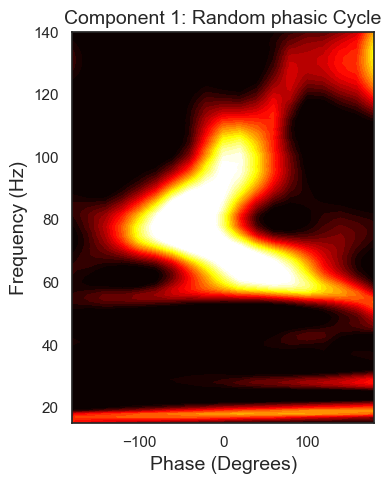

  -> Randomly selected TONIC Cycle #391121
Saved FPP plot: final_component_plots/component_1_random_tonic_#391121.svg


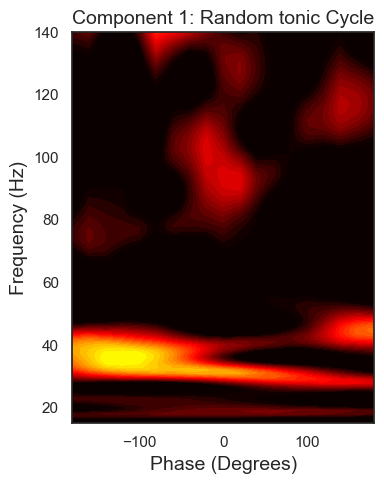


--- Processing Component 2 ---
  -> Randomly selected PHASIC Cycle #15031
Saved FPP plot: final_component_plots/component_2_random_phasic_#15031.svg


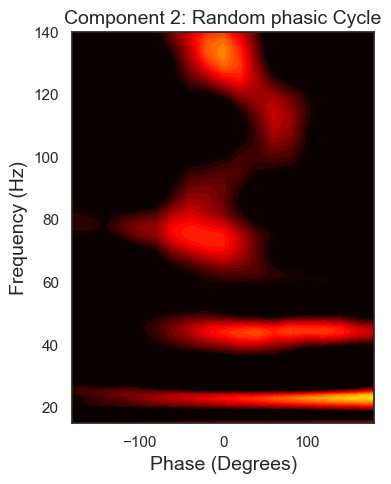

  -> Randomly selected TONIC Cycle #225283
Saved FPP plot: final_component_plots/component_2_random_tonic_#225283.svg


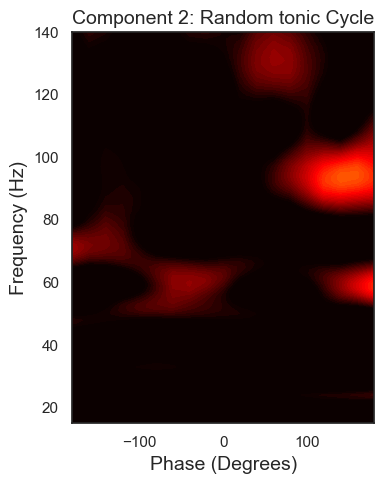


--- Processing Component 3 ---
  -> Randomly selected PHASIC Cycle #13932
Saved FPP plot: final_component_plots/component_3_random_phasic_#13932.svg


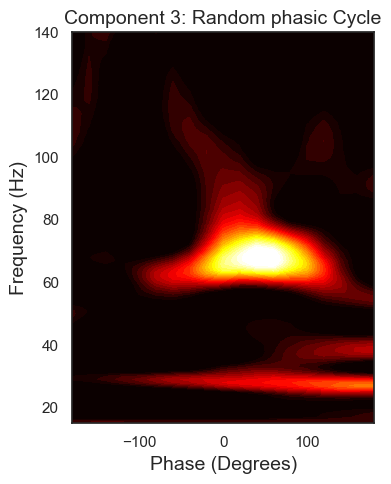

  -> Randomly selected TONIC Cycle #410745
Saved FPP plot: final_component_plots/component_3_random_tonic_#410745.svg


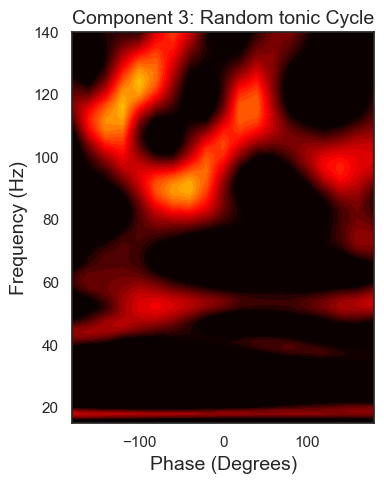


--- Processing Component 4 ---
  -> Randomly selected PHASIC Cycle #11458
Saved FPP plot: final_component_plots/component_4_random_phasic_#11458.svg


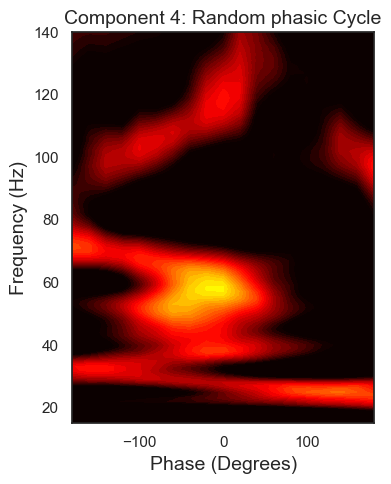

  -> Randomly selected TONIC Cycle #73289
Saved FPP plot: final_component_plots/component_4_random_tonic_#73289.svg


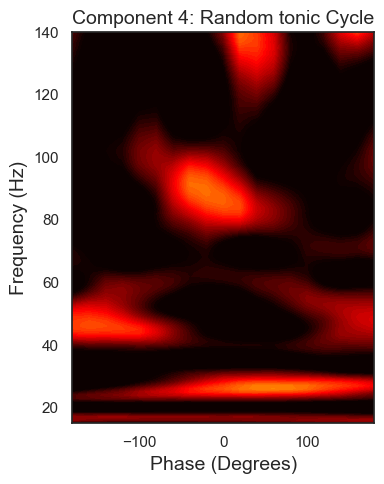


--- Processing Component 5 ---
  -> Randomly selected PHASIC Cycle #8311
Saved FPP plot: final_component_plots/component_5_random_phasic_#8311.svg


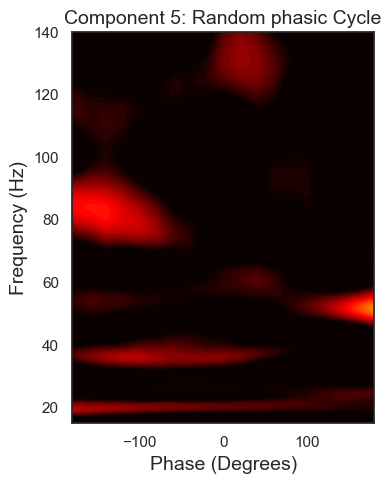

  -> Randomly selected TONIC Cycle #348402
Saved FPP plot: final_component_plots/component_5_random_tonic_#348402.svg


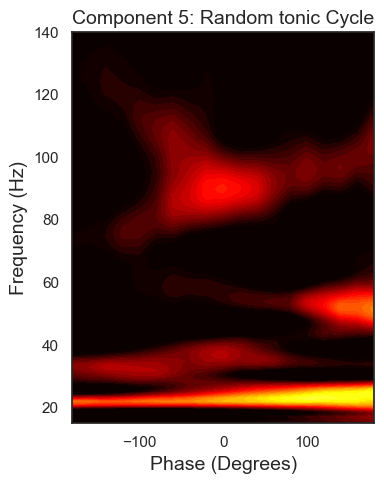

In [122]:
import random
import os
import numpy as np

# --- Plot a Random PHASIC and a Random TONIC FPP from Each Component ---

print("\n--- Generating Plots for a Random Phasic and Tonic FPP from Each Component ---")

# Check if the required variables from the main analysis exist
if 'cycles_by_comp' in locals() and 'combined_all_fpps_list' in locals() and 'cycle_labels' in locals():
    
    # Loop through each component identified in the analysis
    for comp_idx, indices in sorted(cycles_by_comp.items()):
        print(f"\n--- Processing Component {comp_idx + 1} ---")

        # --- 1. Handle PHASIC Sample ---
        phasic_indices_in_comp = [i for i in indices if cycle_labels[i] == 'phasic']
        
        if len(phasic_indices_in_comp) > 0:
            random_phasic_index = random.choice(phasic_indices_in_comp)
            phasic_fpp_sample = combined_all_fpps_list[random_phasic_index]
            
            print(f"  -> Randomly selected PHASIC Cycle #{random_phasic_index}")
            
            # Calculate dynamic color range for this specific FPP
            vmin_dynamic = 0
            vmax_dynamic = 5
            
            title = f"Component {comp_idx + 1}: Random phasic Cycle"
            filename = os.path.join(PLOTS_FOLDER, f'component_{comp_idx+1}_random_phasic_#{random_phasic_index}.svg')
            
            plot_average_fpp_single_fpp(
                avg_fpp=phasic_fpp_sample,
                angles=angles,
                frequencies=frequencies,
                title=title,
                filename=filename,
                vmin=vmin_dynamic,
                vmax=vmax_dynamic
            )
        else:
            print("  -> No phasic cycles found in this component to sample from.")

        # --- 2. Handle TONIC Sample ---
        tonic_indices_in_comp = [i for i in indices if cycle_labels[i] == 'tonic']

        if len(tonic_indices_in_comp) > 0:
            random_tonic_index = random.choice(tonic_indices_in_comp)
            tonic_fpp_sample = combined_all_fpps_list[random_tonic_index]

            print(f"  -> Randomly selected TONIC Cycle #{random_tonic_index}")

            # Calculate dynamic color range for this specific FPP
            vmin_dynamic = 0
            vmax_dynamic = 5

            title = f"Component {comp_idx + 1}: Random tonic Cycle"
            filename = os.path.join(PLOTS_FOLDER, f'component_{comp_idx+1}_random_tonic_#{random_tonic_index}.svg')

            plot_average_fpp_single_fpp(
                avg_fpp=tonic_fpp_sample,
                angles=angles,
                frequencies=frequencies,
                title=title,
                filename=filename,
                vmin=vmin_dynamic,
                vmax=vmax_dynamic
            )
        else:
            print("  -> No tonic cycles found in this component to sample from.")

else:
    print("Error: Could not find required variables ('cycles_by_comp', 'combined_all_fpps_list').")
    print("Please ensure the main analysis cell has been run successfully before this one.")

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

def inspect_and_plot_cycle(cycle_index):
    """
    Displays a detailed plot for a single FPP specified by its index,
    then asks the user if they want to save the figure.

    This function relies on variables created by the main analysis script:
    - combined_all_fpps_list
    - cycle_labels
    - assigned_components
    - angles
    - frequencies
    - PLOTS_FOLDER
    """
    
    # --- 1. Data Retrieval and Validation ---
    
    # Check if the required variables exist
    required_vars = ['combined_all_fpps_list', 'cycle_labels', 'assigned_components', 'angles', 'frequencies', 'PLOTS_FOLDER']
    if not all(var in locals() or var in globals() for var in required_vars):
        print("Error: Missing one or more required variables. Please run the main analysis cell first.")
        return

    # Validate the provided index
    if not 0 <= cycle_index < len(combined_all_fpps_list):
        print(f"Error: Invalid index. Please provide an index between 0 and {len(combined_all_fpps_list) - 1}.")
        return

    # Retrieve all necessary information for this cycle
    single_fpp = combined_all_fpps_list[cycle_index]
    cycle_type = cycle_labels[cycle_index].title()
    component_num = assigned_components[cycle_index] + 1
    
    print(f"Inspecting Cycle #{cycle_index} (Type: {cycle_type}, Belongs to Component {component_num})")

    # --- 2. Plot Generation (similar to plot_average_fpp_detailed) ---

    # Calculate dynamic color range for this specific FPP
    vmin_dynamic = np.min(single_fpp)
    vmax_dynamic = np.max(single_fpp)
    
    # Calculate overlays
    profile_1d = np.sum(single_fpp, axis=1)
    profile_smoothed = np.convolve(profile_1d, np.ones(5)/5, mode='same')
    prof_min, prof_max = np.min(profile_smoothed), np.max(profile_smoothed)
    profile_norm = (profile_smoothed - prof_min) / (prof_max - prof_min) if (prof_max - prof_min) > 1e-9 else np.zeros_like(profile_smoothed)
    scaled_profile = profile_norm * (angles[-1] - angles[0]) * 0.4 + angles[0]
    max_index = np.unravel_index(np.argmax(single_fpp, axis=None), single_fpp.shape)
    mode_frequency = frequencies[max_index[0]]

    # Create the plot
    fig, ax = plt.subplots(figsize=(12, 8))
    contour = ax.contourf(angles, frequencies, single_fpp, 40, cmap='hot', vmin=vmin_dynamic, vmax=vmax_dynamic)
    
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)
    cbar = fig.colorbar(contour, cax=cax)
    cbar.set_label('Power (a.u.)', fontsize=12)
    
    ax.plot(scaled_profile, frequencies, color='cyan', linewidth=2.5, alpha=0.9)
    ax.axhline(mode_frequency, color='white', linestyle='--', linewidth=2, alpha=0.9)
    ax.text(angles[-1] * 0.95, mode_frequency + 2, f'{int(mode_frequency)} Hz', 
            color='white', ha='right', va='bottom', fontsize=12, weight='bold',
            bbox=dict(facecolor='black', alpha=0.5, edgecolor='none', pad=2.0))
    
    title = f"Component {component_num}: Cycle #{cycle_index} ({cycle_type})"
    ax.set_title(title, fontsize=16)
    ax.set_xlabel('Phase (Degrees)', fontsize=14)
    ax.set_ylabel('Frequency (Hz)', fontsize=14)
    ax.set_xlim(angles[0], angles[-1])
    ax.set_ylim(frequencies[0], frequencies[-1])
    plt.tight_layout(rect=[0, 0, 0.95, 1])
    
    # Display the plot to the user
    plt.show()

    # --- 3. Interactive Save Option ---
    
    # Prompt the user for input after the plot is shown
    user_input = input("Save this plot? (y/n): ")
    
    if user_input.lower() == 'y':
        # Create a descriptive filename
        filename = os.path.join(PLOTS_FOLDER, f'inspected_comp{component_num}_{cycle_type.lower()}_cycle{cycle_index}.svg')
        # Save the figure object we already created
        fig.savefig(filename, format='svg')
        print(f"Plot saved to: {filename}")
    else:
        print("Plot not saved.")
        
    # Close the figure object to free up memory, especially important if inspecting many plots
    plt.close(fig)


# --- EXAMPLE USAGE ---
# To inspect a specific cycle, just call the function with its index.
# For example, to look at the FPP for cycle number 42:
#
# inspect_and_plot_cycle(42)
#
# To look at cycle number 15000:
#
# inspect_and_plot_cycle(15000)

In [99]:
import numpy as np

# --- Organize Cycle Indices by Component and Type for Exploration ---

print("\n--- Organizing all cycle indices for easy exploration ---")

# Check if the required variables from the main analysis exist
if 'cycles_by_comp' in locals() and 'cycle_labels' in locals():

    # This will be our new, easy-to-use data structure.
    # Format: {'Component 1': {'phasic': [...], 'tonic': [...]}, ...}
    component_indices_by_type = {}

    # Loop through the original component assignments
    for comp_idx, all_indices_in_comp in sorted(cycles_by_comp.items()):
        
        # Create a user-friendly key for our new dictionary (e.g., "Component 1")
        component_key = f"Component {comp_idx + 1}"
        
        # Use list comprehensions to efficiently separate the indices by their label
        phasic_indices = [i for i in all_indices_in_comp if cycle_labels[i] == 'phasic']
        tonic_indices = [i for i in all_indices_in_comp if cycle_labels[i] == 'tonic']
        
        # Store the separated lists in our new dictionary
        component_indices_by_type[component_key] = {
            'phasic': phasic_indices,
            'tonic': tonic_indices
        }

    # --- Print a Summary and Instructions ---
    
    print("\n--- Summary of Cycles per Component ---")
    for component, types in component_indices_by_type.items():
        num_phasic = len(types['phasic'])
        num_tonic = len(types['tonic'])
        print(f"{component}: Contains {num_phasic} phasic cycles and {num_tonic} tonic cycles.")
        
    print("\n--- How to Use This for Exploration ---")
    print("A new dictionary 'component_indices_by_type' has been created.")
    print("You can now easily access and inspect specific cycles.")
    print("\nExample: To see the first few PHASIC cycle indices for Component 2:")
    print(">>> component_indices_by_type['Component 2']['phasic'][:5]")
    
    print("\nExample: To inspect the FIRST TONIC cycle from Component 3:")
    print(">>> first_tonic_cycle_in_c3 = component_indices_by_type['Component 3']['tonic'][0]")
    print(">>> inspect_and_plot_cycle(first_tonic_cycle_in_c3)")

else:
    print("Error: Could not find required variables ('cycles_by_comp', 'cycle_labels').")
    print("Please ensure the main analysis cell has been run successfully before this one.")


--- Organizing all cycle indices for easy exploration ---

--- Summary of Cycles per Component ---
Component 1: Contains 4085 phasic cycles and 73484 tonic cycles.
Component 2: Contains 4150 phasic cycles and 71637 tonic cycles.
Component 3: Contains 4495 phasic cycles and 75845 tonic cycles.
Component 4: Contains 4709 phasic cycles and 86163 tonic cycles.
Component 5: Contains 4282 phasic cycles and 88992 tonic cycles.

--- How to Use This for Exploration ---
A new dictionary 'component_indices_by_type' has been created.
You can now easily access and inspect specific cycles.

Example: To see the first few PHASIC cycle indices for Component 2:
>>> component_indices_by_type['Component 2']['phasic'][:5]

Example: To inspect the FIRST TONIC cycle from Component 3:
>>> first_tonic_cycle_in_c3 = component_indices_by_type['Component 3']['tonic'][0]
>>> inspect_and_plot_cycle(first_tonic_cycle_in_c3)


In [110]:
# In a new cell:
component_indices_by_type['Component 1']['phasic'][:5]

[0, 4, 8, 19, 21]

Inspecting Cycle #155 (Type: Phasic, Belongs to Component 1)


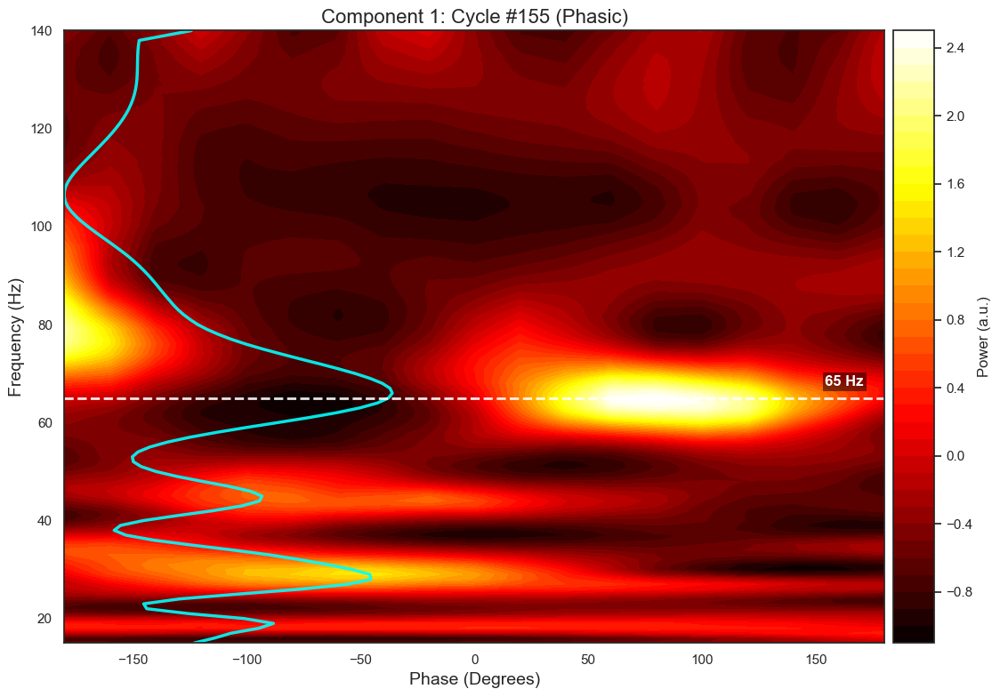

Plot not saved.


In [ ]:
# In the same cell or a new one:
inspect_and_plot_cycle(0)

# Transition probablities

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
import os
from collections import defaultdict, Counter
from sklearn.decomposition import PCA, FastICA

# New imports for interactive plotting
import plotly.graph_objects as go
import networkx as nx

# ===================================================================
# ---              UNCHANGED FUNCTIONS (Parts 1-3)                ---
# ===================================================================
def extract_sss_by_episode(fpps_by_rat):
    episodes_sss_list = []
    for rat_data_list in fpps_by_rat:
        if not isinstance(rat_data_list, list): continue
        for interval_3d_array in rat_data_list:
            if isinstance(interval_3d_array, np.ndarray) and interval_3d_array.ndim == 3 and interval_3d_array.shape[0] > 1:
                current_episode_sss = []
                for i in range(interval_3d_array.shape[0]):
                    fpp_2d = interval_3d_array[i, :, :]
                    fpp_abs = np.abs(fpp_2d)
                    norm_sum = np.sum(fpp_abs)
                    normalized_fpp = fpp_abs / norm_sum if norm_sum > 1e-9 else fpp_abs
                    signature_1d = np.sum(normalized_fpp, axis=1)
                    signature_smoothed = np.convolve(signature_1d, np.ones(5)/5, mode='same')
                    sig_min, sig_max = np.min(signature_smoothed), np.max(signature_smoothed)
                    if (sig_max - sig_min) > 1e-9:
                        signature_final = (signature_smoothed - sig_min) / (sig_max - sig_min)
                    else:
                        signature_final = np.zeros_like(signature_smoothed)
                    current_episode_sss.append(signature_final)
                episodes_sss_list.append(np.array(current_episode_sss))
    return episodes_sss_list

def train_global_ica_model(all_sss_data, n_components):
    print(f"Training global PCA/ICA model with {n_components} components...")
    if all_sss_data.shape[0] < n_components: return None, None
    pca = PCA(n_components=n_components, random_state=42)
    ica = FastICA(n_components=n_components, random_state=42, max_iter=1000, tol=0.001)
    pca_result = pca.fit_transform(all_sss_data)
    ica.fit(pca_result)
    print("Model training complete.")
    return pca, ica

def plot_ica_components(pca_model, ica_model, frequencies, title_suffix, save_path):
    tSCs_weights_original = np.dot(ica_model.components_, pca_model.components_)
    n_components = ica_model.components_.shape[0]
    colors = plt.cm.viridis(np.linspace(0, 1, n_components))
    plt.figure(figsize=(12, 7))
    for i in range(n_components):
        weights = tSCs_weights_original[i, :]
        peak_idx = np.argmax(np.abs(weights))
        peak_freq = frequencies[peak_idx]
        plt.plot(frequencies, weights, color=colors[i], label=f'tSC {i+1} (Peak: {peak_freq:.1f} Hz)')
        plt.scatter(peak_freq, weights[peak_idx], color=colors[i], edgecolor='k', s=50, zorder=5)
    plt.xlabel('Frequency (Hz)', fontsize=14); plt.ylabel('Weight', fontsize=14); plt.title(f'Theta Spectral Components (tSCs) - {title_suffix}', fontsize=16)
    plt.legend(); plt.grid(True, linestyle='--', alpha=0.6); plt.tight_layout()
    plt.savefig(save_path, format='svg'); plt.show()

def get_component_sequences(sss_by_episode, pca_model, ica_model):
    all_sequences = []
    for episode_sss in sss_by_episode:
        episode_pca = pca_model.transform(episode_sss)
        episode_tSCs = ica_model.transform(episode_pca)
        component_sequence = np.argmax(np.abs(episode_tSCs), axis=1)
        all_sequences.append(component_sequence)
    return all_sequences

def calculate_transition_matrix(component_sequences):
    """
    Calculates a transition count matrix from a list of component sequences.
    """
    if not any(len(seq) > 0 for seq in component_sequences):
        return np.array([])
        
    max_id = 0
    for seq in component_sequences:
        if len(seq) > 0:
            max_id = max(max_id, np.max(seq))
    n_comp = max_id + 1
    
    transition_matrix = np.zeros((n_comp, n_comp), dtype=int)

    for seq in component_sequences:
        for i in range(len(seq) - 1):
            # --- CORRECTED LOGIC ---
            from_comp = seq[i]
            to_comp = seq[i+1]
            # -----------------------
            transition_matrix[from_comp, to_comp] += 1
            
    return transition_matrix


# def plot_transition_matrix(transition_counts, title, save_path):
#     if transition_counts.size == 0: return
#     row_sums = transition_counts.sum(axis=1, keepdims=True)
#     with np.errstate(divide='ignore', invalid='ignore'): prob_matrix = np.nan_to_num(transition_counts / row_sums)
#     prob_matrix_viz = prob_matrix.copy()
#     np.fill_diagonal(prob_matrix_viz, 0)
#     plt.figure(figsize=(10, 8)); ax = sns.heatmap(prob_matrix_viz, annot=prob_matrix, fmt=".2f", cmap="hot", linewidths=.5, cbar_kws={'label': 'Transition Probability'})
#     labels = [f'tSC {i+1}' for i in range(prob_matrix.shape[0])]
#     ax.set_xticklabels(labels, rotation=45, ha="right"); ax.set_yticklabels(labels, rotation=0)
#     ax.set_xlabel("To Component", fontsize=14); ax.set_ylabel("From Component", fontsize=14); ax.set_title(title, fontsize=16)
#     plt.tight_layout(); plt.savefig(save_path, format='svg'); plt.show()

def plot_transition_matrix(transition_counts, title, save_path):
    if transition_counts.size == 0:
        return

    row_sums = transition_counts.sum(axis=1, keepdims=True)
    with np.errstate(divide='ignore', invalid='ignore'):
        prob_matrix = np.nan_to_num(transition_counts / row_sums)

    prob_matrix_viz = prob_matrix.copy()
    np.fill_diagonal(prob_matrix_viz, 0)

    # ------- changed block starts here -------
    cmap = plt.cm.get_cmap('bwr')          # blue-white-red
    ax = sns.heatmap(
        prob_matrix_viz,
        annot=prob_matrix,
        fmt=".2f",
        cmap=cmap,
        vmin=0, vmax=1,                    # full probability range
        center=0.5,                        # make 0.5 the neutral (white) midpoint
        linewidths=.5,
        cbar_kws={
            'label': 'Transition Probability',
            'ticks': [0, 0.25, 0.5, 0.75, 1]
        }
    )
    # ------- changed block ends here -------

    labels = [f'tSC {i+1}' for i in range(prob_matrix.shape[0])]
    ax.set_xticklabels(labels, rotation=45, ha="right")
    ax.set_yticklabels(labels, rotation=0)
    ax.set_xlabel("To Component", fontsize=14)
    ax.set_ylabel("From Component", fontsize=14)
    ax.set_title(title, fontsize=16)
    plt.tight_layout()
    plt.savefig(save_path, format='svg')
    plt.show()

def plot_interactive_transition_graph(prob_matrix, node_counts, title, prob_threshold=0.05):
    n_components = prob_matrix.shape[0]
    G = nx.DiGraph()

    min_node_size, max_node_size = 15, 50
    total_cycles = np.sum(node_counts)
    if total_cycles == 0: total_cycles = 1
    node_sizes = min_node_size + (node_counts / total_cycles) * (max_node_size - min_node_size)
    colors = plt.cm.viridis(np.linspace(0, 1, n_components))

    for i in range(n_components):
        G.add_node(i, size=node_sizes[i], label=f"tSC {i+1}", color=mcolors.to_hex(colors[i]), hover_text=f"tSC {i+1}<br>Cycle Count: {node_counts[i]}")

    for i in range(n_components):
        for j in range(n_components):
            prob = prob_matrix[i, j]
            if prob > prob_threshold and i != j:
                G.add_edge(i, j, weight=prob, label=f"{prob:.2f}")

    pos = nx.spring_layout(G, k=0.8, iterations=50, seed=42)
    edge_x, edge_y = [], []
    for edge in G.edges():
        x0, y0 = pos[edge[0]]; x1, y1 = pos[edge[1]]
        edge_x.extend([x0, x1, None]); edge_y.extend([y0, y1, None])
    
    edge_trace = go.Scatter(x=edge_x, y=edge_y, line=dict(width=0.5, color='#888'), hoverinfo='none', mode='lines')
    node_x, node_y, node_text, node_size, node_color = [], [], [], [], []
    for node in G.nodes():
        x, y = pos[node]
        node_x.append(x); node_y.append(y); node_text.append(G.nodes[node]['hover_text'])
        node_size.append(G.nodes[node]['size']); node_color.append(G.nodes[node]['color'])

    node_trace = go.Scatter(x=node_x, y=node_y, mode='markers+text', text=[G.nodes[node]['label'] for node in G.nodes()], textposition="top center",
        hoverinfo='text', hovertext=node_text, marker=dict(showscale=False, colorscale='Viridis', reversescale=True, color=node_color, size=node_size, line_width=2))

    fig = go.Figure(data=[edge_trace, node_trace], layout=go.Layout(title=f'<br><b>{title}</b>', titlefont_size=16, showlegend=False, hovermode='closest',
        margin=dict(b=20,l=5,r=5,t=40), annotations=[dict(text=f"Edge arrows show transition probability > {prob_threshold}", showarrow=False, xref="paper", yref="paper", x=0.005, y=-0.002)],
        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False), yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)))

    for edge in G.edges(data=True):
        x0, y0 = pos[edge[0]]; x1, y1 = pos[edge[1]]
        fig.add_annotation(ax=x0, ay=y0, axref='x', ayref='y', x=x0*0.2 + x1*0.8, y=y0*0.2 + y1*0.8, xref='x', yref='y', showarrow=True, arrowhead=2, arrowsize=2, arrowwidth=1)
        fig.add_annotation(x=(x0+x1)/2, y=(y0+y1)/2, text=edge[2]['label'], showarrow=False, font=dict(size=10, color="black"))
    return fig


--- Step 1: Processing data ---

--- Step 2: Training global model ---
Training global PCA/ICA model with 5 components...
Model training complete.

--- Step 3: Visualizing global components ---


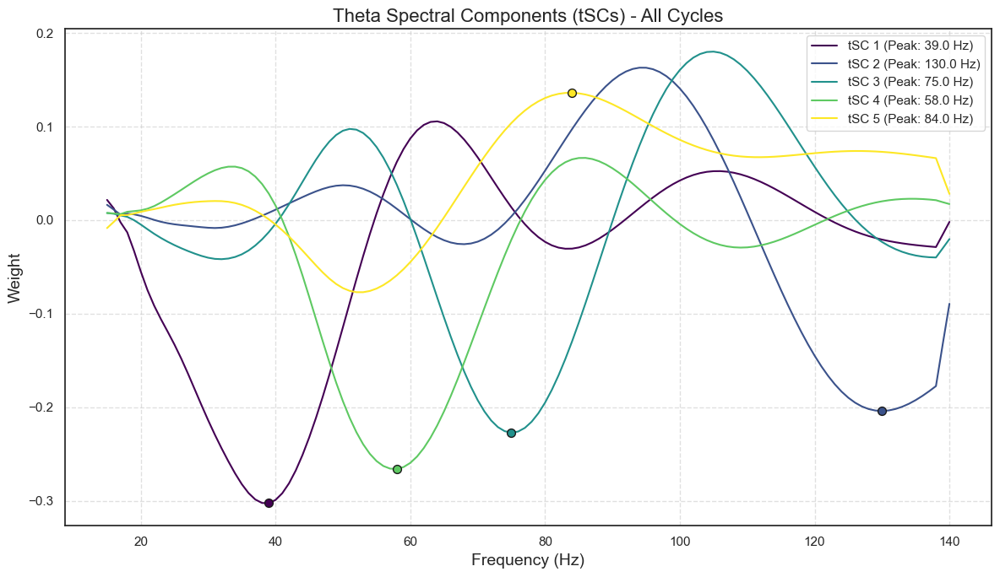


--- Step 4: Assigning components and calculating transitions ---

Component Composition:
  Component 1: 4083 phasic cycles, 73487 tonic cycles
  Component 2: 4149 phasic cycles, 71632 tonic cycles
  Component 3: 4496 phasic cycles, 75849 tonic cycles
  Component 4: 4713 phasic cycles, 86152 tonic cycles
  Component 5: 4279 phasic cycles, 88989 tonic cycles


In [75]:
frequencies = np.arange(15, 141, 1)

print("--- Step 1: Processing data ---")
phasic_sss_by_episode = extract_sss_by_episode(phasic_fpps)
tonic_sss_by_episode = extract_sss_by_episode(tonic_fpps)
combined_all_sss = np.concatenate(phasic_sss_by_episode + tonic_sss_by_episode, axis=0)

print("\n--- Step 2: Training global model ---")
n_components_pca = 5
pca_model, ica_model = train_global_ica_model(combined_all_sss, n_components_pca)
if ica_model is None: exit()

print("\n--- Step 3: Visualizing global components ---")
plot_ica_components(pca_model, ica_model, frequencies, "All Cycles", "spectral_components_combined.svg")

print("\n--- Step 4: Assigning components and calculating transitions ---")
phasic_sequences = get_component_sequences(phasic_sss_by_episode, pca_model, ica_model)
tonic_sequences = get_component_sequences(tonic_sss_by_episode, pca_model, ica_model)

print("\nComponent Composition:")
all_phasic_comps = np.concatenate(phasic_sequences) if phasic_sequences else np.array([])
all_tonic_comps = np.concatenate(tonic_sequences) if tonic_sequences else np.array([])
phasic_counts_counter = Counter(all_phasic_comps); tonic_counts_counter = Counter(all_tonic_comps)
phasic_node_counts = np.array([phasic_counts_counter.get(i, 0) for i in range(n_components_pca)])
tonic_node_counts = np.array([tonic_counts_counter.get(i, 0) for i in range(n_components_pca)])
for i in range(n_components_pca): print(f"  Component {i+1}: {phasic_node_counts[i]} phasic cycles, {tonic_node_counts[i]} tonic cycles")

In [ ]:
all_cycles_count = 0
for i in range(n_components_pca):
    all_cycles_count += phasic_node_counts[i] + tonic_node_counts[i]
print(f"\nTotal cycles processed: {all_cycles_count} (Phasic: {np.sum(phasic_node_counts)}, Tonic: {np.sum(tonic_node_counts)})")
print(f"Precentage of Phasic Cycles: {np.sum(phasic_node_counts) / all_cycles_count * 100 if all_cycles_count > 0 else 0}")
print(f"Precentage of Tonic Cycles: {np.sum(tonic_node_counts) / all_cycles_count * 100 if all_cycles_count > 0 else 0}")



Total cycles processed: 417829 (Phasic: 21720, Tonic: 396109)
Precentage of Phasic Cycles: 5.198298825596117
Precentage of Tonic Cycles: 94.80170117440389



--- Step 5: Calculating transition probabilities ---


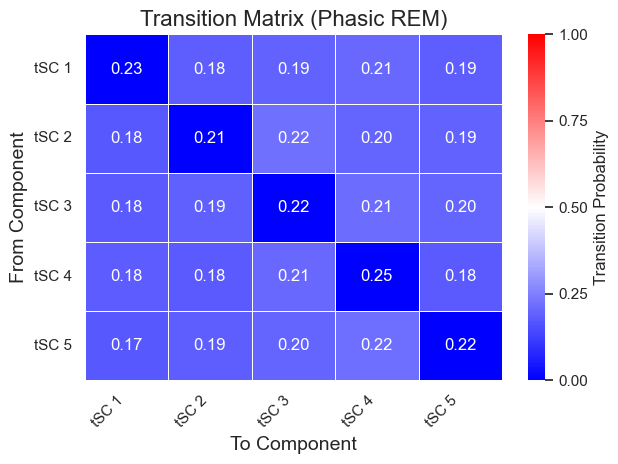

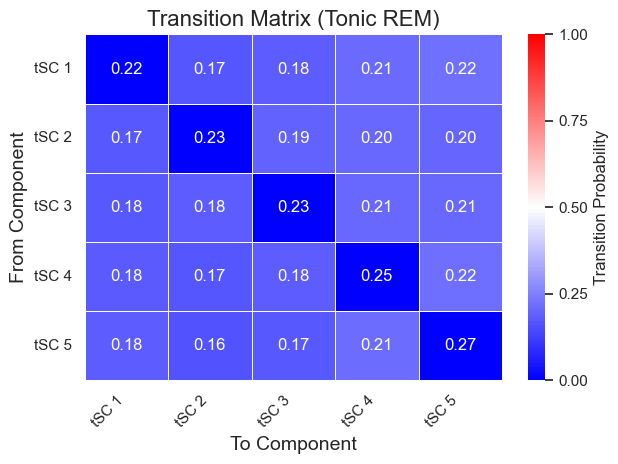


--- Step 6: Generating interactive state transition graphs ---

--- Analysis Complete ---
Interactive figures 'phasic_fig' and 'tonic_fig' are now available.


In [78]:
print("\n--- Step 5: Calculating transition probabilities ---")
phasic_transitions = calculate_transition_matrix(phasic_sequences)
tonic_transitions = calculate_transition_matrix(tonic_sequences)
phasic_row_sums = phasic_transitions.sum(axis=1, keepdims=True)
with np.errstate(divide='ignore', invalid='ignore'): phasic_prob_matrix = np.nan_to_num(phasic_transitions / phasic_row_sums)
tonic_row_sums = tonic_transitions.sum(axis=1, keepdims=True)
with np.errstate(divide='ignore', invalid='ignore'): tonic_prob_matrix = np.nan_to_num(tonic_transitions / tonic_row_sums)
plot_transition_matrix(phasic_transitions, "Transition Matrix (Phasic REM)", "transition_matrix_phasic.svg")
plot_transition_matrix(tonic_transitions, "Transition Matrix (Tonic REM)", "transition_matrix_tonic.svg")

print("\n--- Step 6: Generating interactive state transition graphs ---")
phasic_fig = None
if phasic_prob_matrix.size > 0:
    phasic_fig = plot_interactive_transition_graph(phasic_prob_matrix, phasic_node_counts, "Interactive State Transition Graph (Phasic REM)")
else: print("Skipping phasic interactive graph: no transitions found.")
tonic_fig = None
if tonic_prob_matrix.size > 0:
    tonic_fig = plot_interactive_transition_graph(tonic_prob_matrix, tonic_node_counts, "Interactive State Transition Graph (Tonic REM)")
else: print("Skipping tonic interactive graph: no transitions found.")

print("\n--- Analysis Complete ---")
print("Interactive figures 'phasic_fig' and 'tonic_fig' are now available.")

# To display a figure in a Jupyter Notebook, run '.show()' on it in a new cell:
# if phasic_fig: phasic_fig.show()
# if tonic_fig: tonic_fig.show()

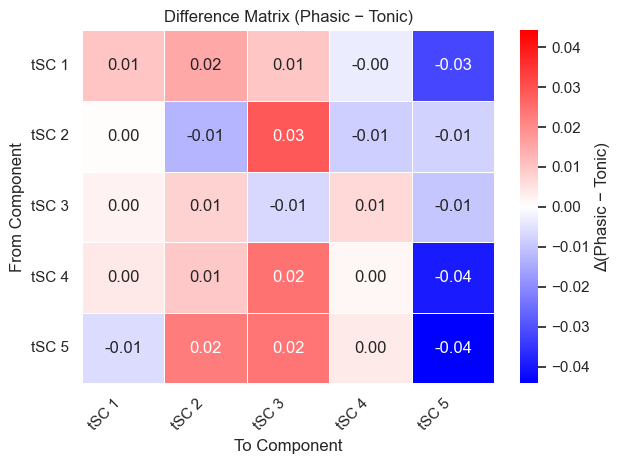

In [38]:
# ------------------------------------------------------------------
# --- NEW: Step 5-b  •  Difference between the two probability maps
# ------------------------------------------------------------------
diff_matrix = phasic_prob_matrix - tonic_prob_matrix     # Δ = Phasic − Tonic

def plot_difference_matrix(diff_mat, title, save_path):
    """Heat-map of Δ-probabilities with a diverging palette centred at 0."""
    import seaborn as sns, matplotlib.pyplot as plt
    from matplotlib.colors import TwoSlopeNorm

    max_abs = np.max(np.abs(diff_mat)) or 1          # symmetric colour limits
    norm = TwoSlopeNorm(vmin=-max_abs, vcenter=0, vmax=max_abs)

    ax = sns.heatmap(
        diff_mat,
        annot=diff_mat,
        fmt=".2f",
        cmap='bwr',
        norm=norm,
        linewidths=.5,
        cbar_kws={'label': 'Δ(Phasic − Tonic)'}
    )

    labels = [f'tSC {i+1}' for i in range(diff_mat.shape[0])]
    ax.set_xticklabels(labels, rotation=45, ha="right")
    ax.set_yticklabels(labels, rotation=0)

    ax.set_xlabel("To Component"); ax.set_ylabel("From Component")
    ax.set_title(title)
    plt.tight_layout(); plt.savefig(save_path, format='svg'); plt.show()

# ---- call it ------------------------------------------------------
plot_difference_matrix(
    diff_matrix,
    "Difference Matrix (Phasic − Tonic)",
    "transition_matrix_difference.svg"
)

In [80]:
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from matplotlib.patches import FancyBboxPatch, Circle, FancyArrowPatch
import matplotlib.patches as mpatches
import math

def plot_network_transition_matrix(prob_matrix, node_counts, title, save_path=None, 
                                 prob_threshold=0.05, figsize=(12, 10)):
    """
    Create a professional network-style transition matrix plot with beautiful self-loops.
    
    Parameters:
    -----------
    prob_matrix : np.ndarray
        Transition probability matrix (n_components x n_components)
    node_counts : np.ndarray
        Count of cycles for each component (for node sizing)
    title : str
        Title for the plot
    save_path : str, optional
        Path to save the figure
    prob_threshold : float
        Minimum probability to show an edge
    figsize : tuple
        Figure size (width, height)
    """
    n_components = prob_matrix.shape[0]
    
    # Create directed graph
    G = nx.DiGraph()
    
    # Define beautiful colors for nodes
    node_colors = ['#FF6B6B',  # Red
               '#45B7D1',  # Blue
               '#DDA0DD',  # Plum/Purple
               '#FFB347',  # Orange
               '#FFEAA7',  # Pale Yellow
               '#F0E68C',  # Khaki (light yellow-brown)
               '#DEB887',  # Burlywood (brownish)
               '#BA55D3',  # Medium Orchid (purple)
               '#FF69B4',  # Hot Pink
               '#1E90FF']  # Dodger Blue
    
    # Add nodes with attributes
    for i in range(n_components):
        G.add_node(i, 
                  label=f'tSC\n{i+1}',
                  count=node_counts[i],
                  color=node_colors[i % len(node_colors)])
    
    # Separate self-loops from regular edges
    edges_to_draw = []
    self_loops = []
    for i in range(n_components):
        for j in range(n_components):
            prob = prob_matrix[i, j]
            if prob > prob_threshold:
                G.add_edge(i, j, weight=prob, prob=prob)
                if i == j:  # Self-loop
                    self_loops.append((i, prob))
                else:
                    edges_to_draw.append((i, j, prob))
    
    # Create layout - circular layout works well for transition matrices
    pos = nx.circular_layout(G, scale=2.5)
    
    # Create the plot
    fig, ax = plt.subplots(figsize=figsize)
    ax.set_xlim(-4, 4)
    ax.set_ylim(-4, 4)
    ax.set_aspect('equal')
    
    # Calculate node sizes based on counts
    if np.sum(node_counts) > 0:
        normalized_counts = node_counts / np.max(node_counts)
        node_sizes = 0.25 + normalized_counts * 0.15  # Radius sizes
    else:
        node_sizes = np.full(n_components, 0.3)
    
    # Draw beautiful self-loops FIRST (so they appear behind other elements)
    for node, prob in self_loops:
        x, y = pos[node]
        node_radius = node_sizes[node]
        
        # Create a smooth, elegant self-loop
        loop_radius = 0.4
        
        # Position the loop outside the node
        # Calculate the angle of this node in the circular layout
        angle_to_center = math.atan2(y, x)
        
        # Position loop center further out from the graph center
        loop_center_x = x + (loop_radius + node_radius) * math.cos(angle_to_center)
        loop_center_y = y + (loop_radius + node_radius) * math.sin(angle_to_center)
        
        # Create a beautiful circular arc
        # Draw most of the circle (300 degrees)
        theta1 = math.degrees(angle_to_center) - 150
        theta2 = math.degrees(angle_to_center) + 150
        
        # Draw the arc with proportional thickness
        line_width = max(1, prob * 6)
        
        from matplotlib.patches import Arc
        arc = Arc((loop_center_x, loop_center_y), 
                 2*loop_radius, 2*loop_radius,
                 angle=0, theta1=theta1, theta2=theta2,
                 linewidth=line_width, 
                 color='#333333', 
                 alpha=0.8,
                 linestyle='-')
        ax.add_patch(arc)
        
        # Add a clean arrowhead
        # Calculate the end point of the arc
        end_angle_rad = math.radians(theta2)
        end_x = loop_center_x + loop_radius * math.cos(end_angle_rad)
        end_y = loop_center_y + loop_radius * math.sin(end_angle_rad)
        
        # Calculate direction for arrowhead
        arrow_angle = end_angle_rad + math.pi/2  # Perpendicular to radius
        arrow_dx = 0.1 * math.cos(arrow_angle)
        arrow_dy = 0.1 * math.sin(arrow_angle)
        
        # Draw arrowhead
        arrowhead = FancyArrowPatch(
            (end_x - arrow_dx, end_y - arrow_dy),
            (end_x, end_y),
            arrowstyle='->', 
            mutation_scale=12,
            color='#333333', 
            alpha=0.8,
            linewidth=1
        )
        ax.add_patch(arrowhead)
        
        # Add probability label with better positioning
        label_angle = math.radians((theta1 + theta2) / 2)
        label_distance = loop_radius + 0.2
        label_x = loop_center_x + label_distance * math.cos(label_angle)
        label_y = loop_center_y + label_distance * math.sin(label_angle)
        
        # Beautiful label background
        bbox_props = dict(
            boxstyle="round,pad=0.15", 
            facecolor='white', 
            edgecolor='#CCCCCC',
            alpha=0.95,
            linewidth=0.5
        )
        
        ax.text(label_x, label_y, f'{prob:.2f}', 
               ha='center', va='center', 
               fontsize=9, fontweight='bold',
               color='#333333',
               bbox=bbox_props, zorder=10)
    
    # Draw nodes with better styling
    for i, (node, (x, y)) in enumerate(pos.items()):
        node_radius = node_sizes[i]
        
        # Draw node with shadow effect
        shadow = Circle((x+0.02, y-0.02), node_radius, 
                       color='gray', alpha=0.3, zorder=1)
        ax.add_patch(shadow)
        
        # Main node
        circle = Circle((x, y), node_radius, 
                       color=G.nodes[node]['color'], 
                       alpha=0.9, 
                       zorder=3,
                       linewidth=2,
                       edgecolor='white')
        ax.add_patch(circle)
        
        # Add node label
        ax.text(x, y, G.nodes[node]['label'], 
               ha='center', va='center', 
               fontsize=11, fontweight='bold', 
               color='white', zorder=4)
        
        # Add count label below node (more elegant positioning)
        ax.text(x, y - node_radius - 0.25, f'({node_counts[i]})', 
               ha='center', va='center', 
               fontsize=10, color='#555555', 
               fontweight='normal', zorder=4)
    
    # Draw regular edges with curved paths to avoid overlaps
    for i, j, prob in edges_to_draw:
        x1, y1 = pos[i]
        x2, y2 = pos[j]
        
        # Calculate connection points on node boundaries
        dx = x2 - x1
        dy = y2 - y1
        length = np.sqrt(dx**2 + dy**2)
        
        if length == 0:  # Skip if same position
            continue
            
        dx_norm = dx / length
        dy_norm = dy / length
        
        # Adjust for node radii
        start_x = x1 + node_sizes[i] * dx_norm
        start_y = y1 + node_sizes[i] * dy_norm
        end_x = x2 - node_sizes[j] * dx_norm
        end_y = y2 - node_sizes[j] * dy_norm
        
        # Create curved arrows for better visual separation
        # Add slight curve to prevent overlapping arrows
        mid_x = (start_x + end_x) / 2
        mid_y = (start_y + end_y) / 2
        
        # Add perpendicular offset for curve
        perp_x = -dy_norm * 0.1
        perp_y = dx_norm * 0.1
        
        # Check if there's a reverse edge to increase curve
        reverse_exists = any(edge[0] == j and edge[1] == i for edge in edges_to_draw)
        if reverse_exists:
            perp_x *= 2
            perp_y *= 2
        
        control_x = mid_x + perp_x
        control_y = mid_y + perp_y
        
        # Draw curved arrow
        line_width = max(0.1, prob * 6)
        
        arrow = FancyArrowPatch(
            (start_x, start_y), (end_x, end_y),
            connectionstyle=f"arc3,rad=0.1" if not reverse_exists else "arc3,rad=0.2",
            arrowstyle='->',
            mutation_scale=15,
            linewidth=line_width,
            color='#333333',
            alpha=0.8,
            zorder=2
        )
        ax.add_patch(arrow)
        
        # Add probability label on edge
        # Position label on the curve
        curve_t = 0.5  # Middle of the curve
        if not reverse_exists:
            label_x = start_x * (1-curve_t) + end_x * curve_t + perp_x * 0.5
            label_y = start_y * (1-curve_t) + end_y * curve_t + perp_y * 0.5
        else:
            label_x = start_x * (1-curve_t) + end_x * curve_t + perp_x
            label_y = start_y * (1-curve_t) + end_y * curve_t + perp_y
        
        # Beautiful label background
        bbox_props = dict(
            boxstyle="round,pad=0.15", 
            facecolor='white', 
            edgecolor='#CCCCCC',
            alpha=0.95,
            linewidth=0.5
        )
        
        ax.text(label_x, label_y, f'{prob:.2f}', 
               ha='center', va='center', 
               fontsize=9, fontweight='bold',
               color='#333333',
               bbox=bbox_props, zorder=10)
    
    # Set title with better styling
    ax.set_title(title, fontsize=18, fontweight='bold', pad=30, color='#333333')
    
    # Remove axes
    ax.set_xticks([])
    ax.set_yticks([])
    for spine in ax.spines.values():
        spine.set_visible(False)
    
    # Add elegant legend
    legend_items = [
        "• Node size ∝ cycle count",
        "• Arrow width ∝ transition probability",
        f"• Only transitions > {prob_threshold} shown"
    ]
    
    # Position legend elegantly
    for i, text in enumerate(legend_items):
        ax.text(0.98, 0.98 - i*0.05, text, 
               transform=ax.transAxes,
               fontsize=11, ha='right', va='top',
               bbox=dict(boxstyle="round,pad=0.3", 
                        facecolor='white', 
                        edgecolor='#CCCCCC',
                        alpha=0.9,
                        linewidth=0.5),
               color='#555555')
    
    plt.tight_layout()
    
    if save_path:
        plt.savefig(save_path, format='svg', bbox_inches='tight', dpi=300)
    
    plt.show()
    
    return fig

# Modified function to replace your existing plot_transition_matrix function
def plot_transition_matrix_network_style(transition_counts, title, save_path):
    """
    Wrapper function that matches your existing function signature
    but creates a beautiful network-style plot instead of a heatmap.
    """
    if transition_counts.size == 0: 
        print(f"No transitions found for {title}")
        return
    
    # Calculate probability matrix
    row_sums = transition_counts.sum(axis=1, keepdims=True)
    with np.errstate(divide='ignore', invalid='ignore'): 
        prob_matrix = np.nan_to_num(transition_counts / row_sums)
    
    # Calculate node counts (diagonal + incoming transitions)
    node_counts = np.diag(transition_counts) + transition_counts.sum(axis=0)
    
    # Create the network plot
    plot_network_transition_matrix(prob_matrix, node_counts, title, save_path)

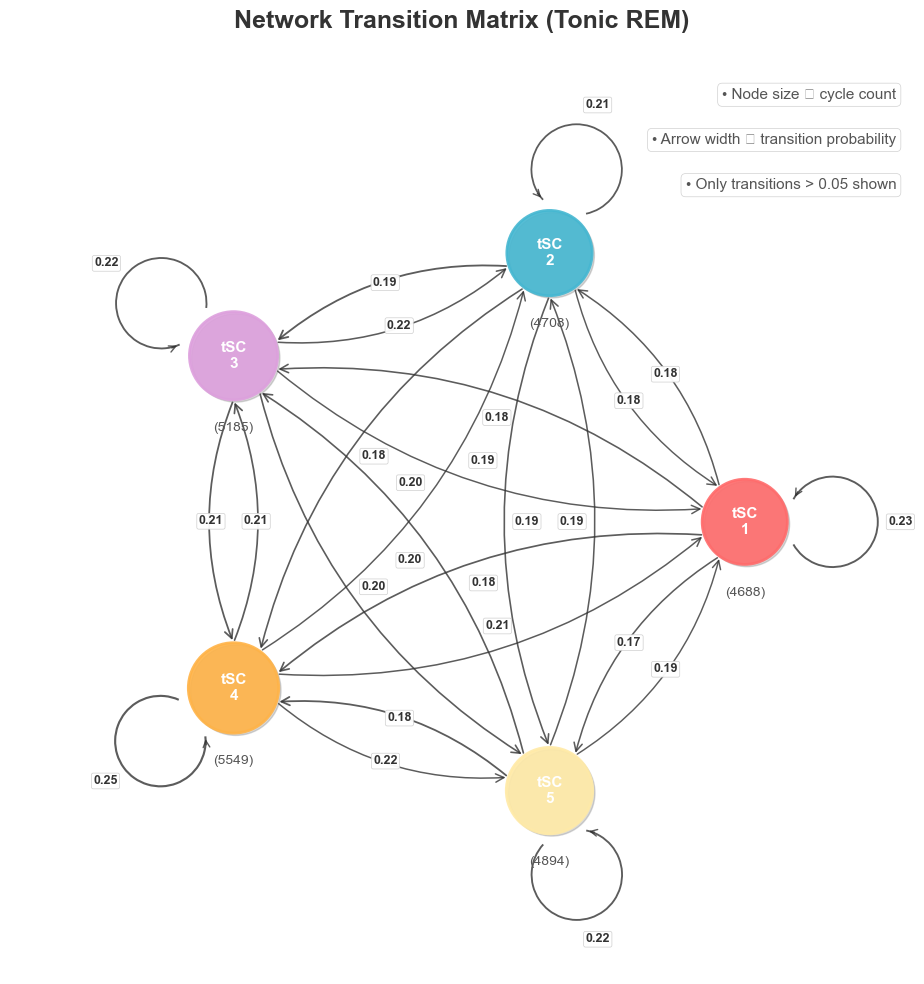

In [81]:
plot_transition_matrix_network_style(phasic_transitions, "Network Transition Matrix (Tonic REM)", "transition_network_phsaic.svg")

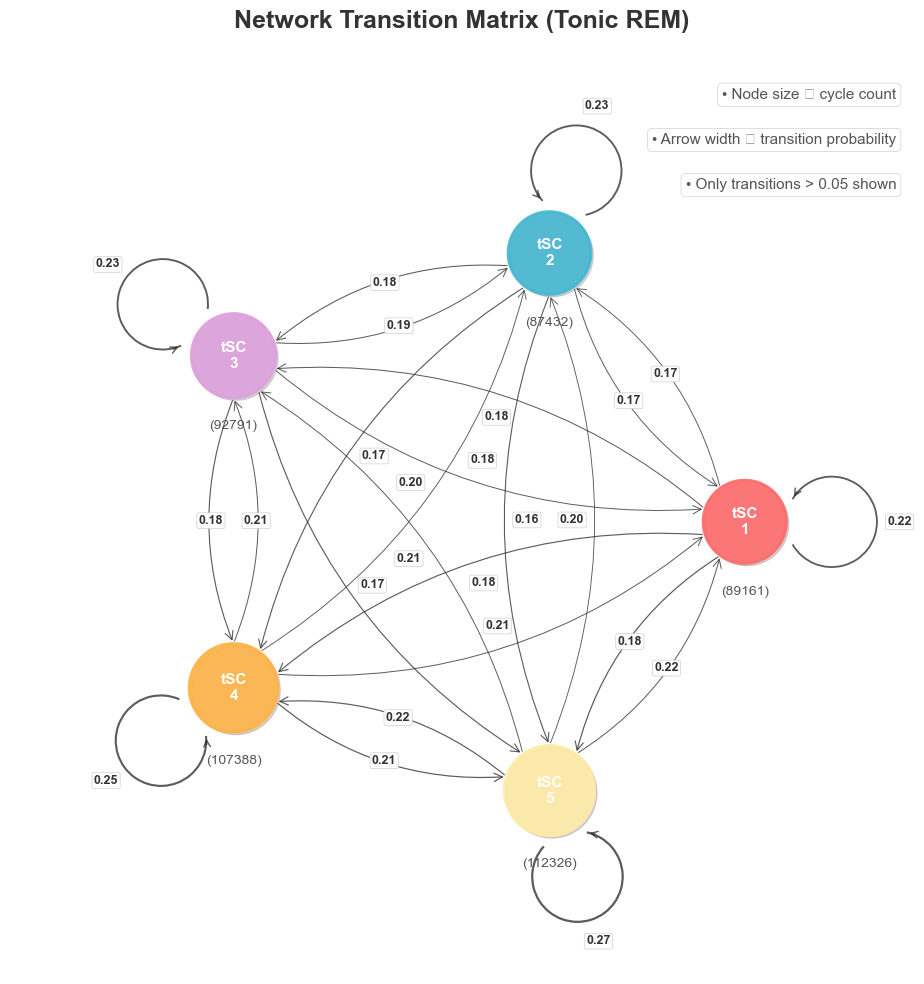

In [26]:
plot_transition_matrix_network_style(tonic_transitions, "Network Transition Matrix (Tonic REM)", "transition_network_tonic.svg")

In [54]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

# This function is the only one that needs to be replaced in your notebook.
def classify_cycles_in_episode(episode_imfs, episode_imf_freqs, pca_model, ica_model):
    """
    This function uses your existing code to process IMFs from a single episode,
    extract spectral signatures, and classify them using the global models.
    It now correctly uses the structure of `all_cycles_se` for plotting.

    Args:
        episode_imfs (list): A list containing ONE IMF array for the episode.
        episode_imf_freqs (list): A list containing ONE IMF frequency array.
        pca_model: The pre-trained PCA model.
        ica_model: The pre-trained ICA model.

    Returns:
        pd.DataFrame: A DataFrame with the correct start, end, and component_id for each cycle.
    """
    # 1. Use YOUR `extract_cycle_info` to get FPPs and cycle indices
    print("Step A: Running your `extract_cycle_info` to get all necessary data...")
    # We only need the second and third outputs from your function
    _, all_cycles_se, all_FPPs = extract_cycle_info(episode_imfs, episode_imf_freqs)

    # We are processing one episode, so the result lists will have one item each
    if not all_FPPs or not all_cycles_se or len(all_FPPs[0]) == 0:
        print("`extract_cycle_info` returned no valid cycles for this episode.")
        return pd.DataFrame()
        
    FPPs_for_episode = all_FPPs[0]
    # This is the crucial variable, structured as a list of arrays of indices
    cycle_indices_list_of_arrays = all_cycles_se[0] 

    # 2. Use YOUR `extract_spectural_signiture` to get the SSS for each cycle
    print("Step B: Running your `extract_spectural_signiture`...")
    all_signatures = np.array(extract_spectural_signiture(FPPs_for_episode))

    # 3. Classify the signatures using the global models
    print("Step C: Classifying signatures with global models...")
    signatures_pca = pca_model.transform(all_signatures)
    signatures_tSCs = ica_model.transform(signatures_pca)
    assigned_components = np.argmax(np.abs(signatures_tSCs), axis=1)

    # --- Step D: THE DEFINITIVE FIX ---
    # Create the final DataFrame for plotting by taking the first and last
    # element of each array in the cycle_indices_list_of_arrays.
    print("Step D: Creating final DataFrame with correct start/end from cycle indices...")
    start_samples = [cycle_array[0] for cycle_array in cycle_indices_list_of_arrays]
    end_samples = [cycle_array[-1] for cycle_array in cycle_indices_list_of_arrays]

    classified_cycles_df = pd.DataFrame({
        'start': start_samples,
        'end': end_samples,
        'component_id': assigned_components
    })
    
    return classified_cycles_df

# The plotting function (unchanged)
def plot_lfp_with_component_cycles(lfp_segment, fs, cycle_info_df, n_components, title):
    colors = plt.cm.plasma(np.linspace(0, 1, n_components))
    time_axis = np.arange(len(lfp_segment)) / fs
    fig, ax = plt.subplots(figsize=(25, 6))
    ax.plot(time_axis, lfp_segment, color='lightgray', zorder=1, label='Full LFP')
    for _, cycle in cycle_info_df.iterrows():
        start_idx, end_idx = int(cycle['start']), int(cycle['end'])
        comp_id = int(cycle['component_id'])
        ax.plot(time_axis[start_idx:end_idx+1], lfp_segment[start_idx:end_idx+1],
                color=colors[comp_id], linewidth=2.5, zorder=2)
    legend_elements = [Line2D([0], [0], color=colors[i], lw=4, label=f'tSC {i+1}') for i in range(n_components)]
    legend_elements.insert(0, Line2D([0], [0], color='gray', lw=2, label='Full LFP'))
    ax.legend(handles=legend_elements, loc='upper right', fontsize=12)
    ax.set_xlabel("Time (s)", fontsize=14); ax.set_ylabel("Voltage", fontsize=14)
    ax.set_title(title, fontsize=16)
    ax.set_xlim(time_axis[0], time_axis[-1]); plt.tight_layout(); plt.show()


In [14]:
# 1. LOAD DATA FOR A SPECIFIC SESSION
print("--- Step 1: Loading data for a single example session ---")
# You can change the file paths here to load a completely different recording session
path_to_hpc = '/Users/amir/Desktop/for Abdel/OS Basic/11/Rat-OS-Ephys_Rat11_SD4_OR_03-11-2018/2018-11-05_14-15-28_Post_Trial5/HPC_100_CH32_0.continuous.mat'
path_to_states = '/Users/amir/Desktop/for Abdel/OS Basic/11/Rat-OS-Ephys_Rat11_SD4_OR_03-11-2018/2018-11-05_14-15-28_Post_Trial5/2018-11-05_14-15-28_post_trial5-states.mat'

lfpHPC, hypno, fs = get_data(path_to_hpc, path_to_states)
phasic_interval_set, tonic_interval_set, lfp_tsd = extract_pt_intervals(lfpHPC, hypno, fs=fs)

--- Step 1: Loading data for a single example session ---
There was 0 in the dataset


python(39487) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


Number of detected Tonic intrevals:54
Number of detected Tonic intrevals after threshold:54



--- Step 2: Selecting a specific REM episode for analysis ---

--- Step 3: Classifying cycles within the selected episode ---
Step A: Running your `extract_cycle_info` to get all necessary data...
 Checking Cycles inputs - trimming singleton from input 'IP'
Step B: Running your `extract_spectural_signiture`...
Step C: Classifying signatures with global models...
Step D: Creating final DataFrame with correct start/end from cycle indices...

--- Step 4: Generating the plot ---
Found and classified 7 valid cycles.
Final DataFrame for plotting:
   start   end  component_id
0    305   637             4
1    567   895             0
2    828  1170             4
3   1106  1462             0
4   1389  1767             4


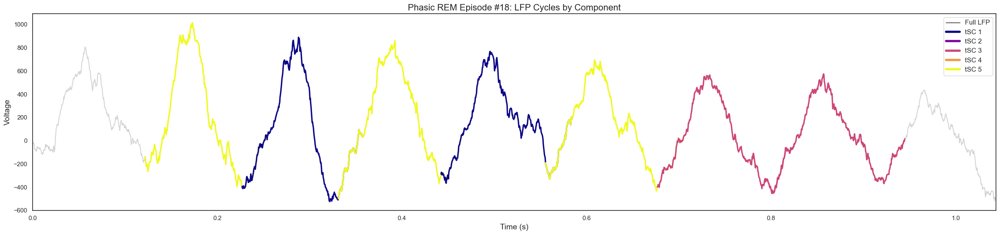

In [58]:
print("\n--- Step 2: Selecting a specific REM episode for analysis ---")
selected_lfp_segment = None
episode_type = 'phasic' # OR 'tonic'

# --- Option 1: Choose a different PHASIC episode ---
if episode_type == 'phasic':
    if len(phasic_interval_set) > 0:
        # TO CHANGE THE EPISODE, CHANGE THE INDEX NUMBER HERE.
        # For example, use `episode_index = 1` for the second episode,
        # `episode_index = 2` for the third, and so on.
        episode_index = 17 # 0 = first episode, 1 = second, etc.
        
        if episode_index < len(phasic_interval_set):
            # Select the desired episode from the IntervalSet
            selected_interval = phasic_interval_set.loc[[episode_index]]
            episode_imfs, episode_imf_freqs, episode_lfp_list = extract_imfs_by_pt_intervals(
                lfp_tsd, fs, selected_interval, config, return_imfs_freqs=True
            )
            selected_lfp_segment = episode_lfp_list[0] if episode_lfp_list else None
            plot_title = f"Phasic REM Episode #{episode_index + 1}: LFP Cycles by Component"
        else:
            print(f"Error: Episode index {episode_index} is out of bounds for phasic REM (found {len(phasic_interval_set)} episodes).")
    else:
        print("No phasic REM intervals found in this recording.")

# --- Option 2: Choose a TONIC episode instead ---
elif episode_type == 'tonic':
    if len(tonic_interval_set) > 0:
        # TO CHANGE THE EPISODE, CHANGE THE INDEX NUMBER HERE.
        episode_index = 0 # 0 = first tonic episode

        if episode_index < len(tonic_interval_set):
            selected_interval = tonic_interval_set.loc[[episode_index]]
            episode_imfs, episode_imf_freqs, episode_lfp_list = extract_imfs_by_pt_intervals(
                lfp_tsd, fs, selected_interval, config, return_imfs_freqs=True
            )
            selected_lfp_segment = episode_lfp_list[0] if episode_lfp_list else None
            plot_title = f"Tonic REM Episode #{episode_index + 1}: LFP Cycles by Component"
        else:
            print(f"Error: Episode index {episode_index} is out of bounds for tonic REM (found {len(tonic_interval_set)} episodes).")
    else:
        print("No tonic REM intervals found in this recording.")
# ===================================================================
# ---                END OF MODIFICATION BLOCK                    ---
# ===================================================================


# 3. CLASSIFY CYCLES IN THE EPISODE and PLOT (This part remains unchanged)
if selected_lfp_segment is not None:
    print("\n--- Step 3: Classifying cycles within the selected episode ---")
    
    classified_cycles_df = classify_cycles_in_episode(
        episode_imfs,       
        episode_imf_freqs,  
        pca_model,
        ica_model
    )

    print("\n--- Step 4: Generating the plot ---")
    if not classified_cycles_df.empty:
        print(f"Found and classified {len(classified_cycles_df)} valid cycles.")
        print("Final DataFrame for plotting:")
        print(classified_cycles_df.head())
        plot_lfp_with_component_cycles(
            selected_lfp_segment,
            fs,
            classified_cycles_df,
            n_components_pca,
            plot_title
        )
    else:
        print("Could not generate plot because no valid cycles were identified or classified.")

Using precise window: from 2s to 5s into the episode.

--- Step 3: Classifying cycles within the selected episode ---
Step A: Running your `extract_cycle_info` to get all necessary data...
 Checking Cycles inputs - trimming singleton from input 'IP'
Step B: Running your `extract_spectural_signiture`...
Step C: Classifying signatures with global models...
Step D: Creating final DataFrame with correct start/end from cycle indices...

--- Step 4: Generating the plot ---
Found and classified 17 valid cycles.
Final DataFrame for plotting:
   start   end  component_id
0     63   419             3
1    346   748             3
2   1083  1539             0
3   1434  1865             0
4   1793  2226             3


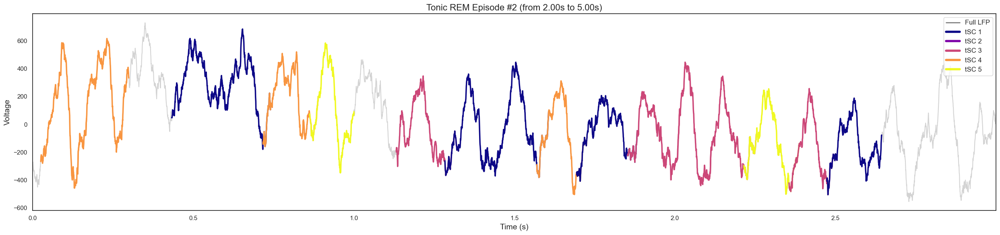

In [89]:
import pynapple as nap

episode_type = 'tonic'  # Can be 'phasic' or 'tonic'
episode_index = 1

# PRIORITY 1: Precise start/end window.
start_offset_seconds = 2
end_offset_seconds = 5 

# PRIORITY 2: Limit the total duration from the beginning.
max_duration_seconds = None # e.g., 2.0.


selected_lfp_segment = None
title_suffix = ""

if episode_type == 'phasic':
    interval_set = phasic_interval_set
    type_str = "Phasic"
elif episode_type == 'tonic':
    interval_set = tonic_interval_set
    type_str = "Tonic"
else:
    print(f"Error: Unknown episode_type '{episode_type}'. Please choose 'phasic' or 'tonic'.")
    interval_set = nap.IntervalSet(start=[], end=[])

if len(interval_set) > 0:
    if episode_index < len(interval_set):
        # 1. Select the FULL desired episode first
        full_episode_interval = interval_set[[episode_index]]
        episode_start_time = full_episode_interval.start[0]
        episode_end_time = full_episode_interval.end[0]
        episode_duration = episode_end_time - episode_start_time
        
        # This will be the final interval used for analysis
        selected_interval = full_episode_interval

        
        # PRIORITY 1: Use specific start/end offsets if both are provided
        if start_offset_seconds is not None and end_offset_seconds is not None:
            print(f"Using precise window: from {start_offset_seconds}s to {end_offset_seconds}s into the episode.")
            
            # --- Input validation ---
            if start_offset_seconds >= end_offset_seconds:
                print(f"Error: start_offset_seconds ({start_offset_seconds}) cannot be greater than or equal to end_offset_seconds ({end_offset_seconds}). Aborting.")
                selected_interval = None # Abort by setting interval to None
            elif start_offset_seconds >= episode_duration:
                print(f"Error: start_offset_seconds ({start_offset_seconds}) is beyond the episode's total duration ({episode_duration:.2f}s). Aborting.")
                selected_interval = None
            else:
                # Calculate the new absolute start and end times
                new_start = episode_start_time + start_offset_seconds
                new_end = episode_start_time + end_offset_seconds
                
                # Clip the end time to make sure it doesn't exceed the actual episode's end
                if new_end > episode_end_time:
                    print(f"Warning: Requested end ({end_offset_seconds:.2f}s) exceeds episode duration ({episode_duration:.2f}s). Clipping to episode end.")
                    new_end = episode_end_time
                
                selected_interval = nap.IntervalSet(start=new_start, end=new_end)
                title_suffix = f" (from {start_offset_seconds:.2f}s to {new_end - episode_start_time:.2f}s)"

        # PRIORITY 2: Fallback to max_duration_seconds if offsets aren't used
        elif max_duration_seconds is not None:
            if episode_duration > max_duration_seconds:
                print(f"Using max duration limit: analyzing first {max_duration_seconds}s of the episode.")
                new_end = episode_start_time + max_duration_seconds
                selected_interval = nap.IntervalSet(start=episode_start_time, end=new_end)
                title_suffix = f" (First {max_duration_seconds:.2f}s)"
            else:
                print("Max duration is set, but episode is shorter. Using full episode.")
                # No change needed, selected_interval is already the full episode
        
        # PRIORITY 3: Use the full episode if no other controls are set
        else:
            print("No duration limits set. Analyzing the full episode.")
            # No change needed, selected_interval is already the full episode

        # 3. Extract data ONLY IF a valid interval was determined
        if selected_interval is not None:
            episode_imfs, episode_imf_freqs, episode_lfp_list = extract_imfs_by_pt_intervals(
                lfp_tsd, fs, selected_interval, config, return_imfs_freqs=True
            )
            selected_lfp_segment = episode_lfp_list[0] if episode_lfp_list else None
            plot_title = f"{type_str} REM Episode #{episode_index + 1}{title_suffix}"
        else:
            # This handles the error cases from the validation checks
            selected_lfp_segment = None 

    else:
        print(f"Error: Episode index {episode_index} is out of bounds for {type_str} REM (found {len(interval_set)} episodes).")
else:
    print(f"No {type_str} REM intervals found in this recording.")


if selected_lfp_segment is not None:
    print("\n--- Step 3: Classifying cycles within the selected episode ---")
    
    classified_cycles_df = classify_cycles_in_episode(
        episode_imfs,       
        episode_imf_freqs,  
        pca_model,
        ica_model
    )

    print("\n--- Step 4: Generating the plot ---")
    if not classified_cycles_df.empty:
        print(f"Found and classified {len(classified_cycles_df)} valid cycles.")
        print("Final DataFrame for plotting:")
        print(classified_cycles_df.head())
        plot_lfp_with_component_cycles(
            selected_lfp_segment,
            fs,
            classified_cycles_df,
            n_components_pca,
            plot_title
        )
    else:
        print("Could not generate plot because no valid cycles were identified or classified.")

# updated graph

In [12]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
import os
from collections import defaultdict, Counter
from sklearn.decomposition import PCA, FastICA

# New imports for interactive plotting
import plotly.graph_objects as go
import networkx as nx

# ===================================================================
# ---              UNCHANGED FUNCTIONS (Parts 1-3)                ---
# ===================================================================
def extract_sss_by_episode(fpps_by_rat):
    episodes_sss_list = []
    for rat_data_list in fpps_by_rat:
        if not isinstance(rat_data_list, list): continue
        for interval_3d_array in rat_data_list:
            if isinstance(interval_3d_array, np.ndarray) and interval_3d_array.ndim == 3 and interval_3d_array.shape[0] > 1:
                current_episode_sss = []
                for i in range(interval_3d_array.shape[0]):
                    fpp_2d = interval_3d_array[i, :, :]
                    fpp_abs = np.abs(fpp_2d)
                    norm_sum = np.sum(fpp_abs)
                    normalized_fpp = fpp_abs / norm_sum if norm_sum > 1e-9 else fpp_abs
                    signature_1d = np.sum(normalized_fpp, axis=1)
                    signature_smoothed = np.convolve(signature_1d, np.ones(5)/5, mode='same')
                    sig_min, sig_max = np.min(signature_smoothed), np.max(signature_smoothed)
                    if (sig_max - sig_min) > 1e-9:
                        signature_final = (signature_smoothed - sig_min) / (sig_max - sig_min)
                    else:
                        signature_final = np.zeros_like(signature_smoothed)
                    current_episode_sss.append(signature_final)
                episodes_sss_list.append(np.array(current_episode_sss))
    return episodes_sss_list

def train_global_ica_model(all_sss_data, n_components):
    print(f"Training global PCA/ICA model with {n_components} components...")
    if all_sss_data.shape[0] < n_components: return None, None
    pca = PCA(n_components=n_components, random_state=42)
    ica = FastICA(n_components=n_components, random_state=42, max_iter=1000, tol=0.001)
    pca_result = pca.fit_transform(all_sss_data)
    ica.fit(pca_result)
    print("Model training complete.")
    return pca, ica

def plot_ica_components(pca_model, ica_model, frequencies, title_suffix, save_path):
    tSCs_weights_original = np.dot(ica_model.components_, pca_model.components_)
    n_components = ica_model.components_.shape[0]
    colors = plt.cm.viridis(np.linspace(0, 1, n_components))
    plt.figure(figsize=(12, 7))
    for i in range(n_components):
        weights = tSCs_weights_original[i, :]
        peak_idx = np.argmax(np.abs(weights))
        peak_freq = frequencies[peak_idx]
        plt.plot(frequencies, weights, color=colors[i], label=f'tSC {i+1} (Peak: {peak_freq:.1f} Hz)')
        plt.scatter(peak_freq, weights[peak_idx], color=colors[i], edgecolor='k', s=50, zorder=5)
    plt.xlabel('Frequency (Hz)', fontsize=14); plt.ylabel('Weight', fontsize=14); plt.title(f'Theta Spectral Components (tSCs) - {title_suffix}', fontsize=16)
    plt.legend(); plt.grid(True, linestyle='--', alpha=0.6); plt.tight_layout()
    plt.savefig(save_path, format='svg'); plt.show()

def get_component_sequences(sss_by_episode, pca_model, ica_model):
    all_sequences = []
    for episode_sss in sss_by_episode:
        episode_pca = pca_model.transform(episode_sss)
        episode_tSCs = ica_model.transform(episode_pca)
        component_sequence = np.argmax(np.abs(episode_tSCs), axis=1)
        all_sequences.append(component_sequence)
    return all_sequences

def _collapse_runs(seq):
    """Return seq with consecutive duplicates collapsed (pack-level)."""
    if len(seq) == 0:
        return np.array([], dtype=int)
    seq = np.asarray(seq, dtype=int)
    # keep first element and any element that differs from its predecessor
    keep = np.r_[True, np.diff(seq) != 0]
    return seq[keep]

def calculate_transition_matrix(component_sequences, n_comp=None, pack_transitions=True):
    """
    Build a transition count matrix from component sequences.
    If pack_transitions=True, collapse consecutive identical components
    (treat them as a single 'pack') and only count transitions between
    different components (no diagonal/self transitions).
    """
    # short-circuit if nothing to do
    if not any(len(seq) > 0 for seq in component_sequences):
        return np.array([])

    # infer number of components if not provided
    if n_comp is None:
        max_id = 0
        for seq in component_sequences:
            if len(seq) > 0:
                max_id = max(max_id, int(np.max(seq)))
        n_comp = max_id + 1

    transition_matrix = np.zeros((n_comp, n_comp), dtype=int)

    for seq in component_sequences:
        if len(seq) < 2:
            continue
        seq_use = _collapse_runs(seq) if pack_transitions else np.asarray(seq, dtype=int)
        if len(seq_use) < 2:
            continue
        for i in range(len(seq_use) - 1):
            from_comp = int(seq_use[i])
            to_comp   = int(seq_use[i + 1])
            if from_comp == to_comp:
                # Shouldn't happen when pack_transitions=True, but keep it safe
                continue
            transition_matrix[from_comp, to_comp] += 1

    return transition_matrix


# def plot_transition_matrix(transition_counts, title, save_path):
#     if transition_counts.size == 0: return
#     row_sums = transition_counts.sum(axis=1, keepdims=True)
#     with np.errstate(divide='ignore', invalid='ignore'): prob_matrix = np.nan_to_num(transition_counts / row_sums)
#     prob_matrix_viz = prob_matrix.copy()
#     np.fill_diagonal(prob_matrix_viz, 0)
#     plt.figure(figsize=(10, 8)); ax = sns.heatmap(prob_matrix_viz, annot=prob_matrix, fmt=".2f", cmap="hot", linewidths=.5, cbar_kws={'label': 'Transition Probability'})
#     labels = [f'tSC {i+1}' for i in range(prob_matrix.shape[0])]
#     ax.set_xticklabels(labels, rotation=45, ha="right"); ax.set_yticklabels(labels, rotation=0)
#     ax.set_xlabel("To Component", fontsize=14); ax.set_ylabel("From Component", fontsize=14); ax.set_title(title, fontsize=16)
#     plt.tight_layout(); plt.savefig(save_path, format='svg'); plt.show()

def count_packs_per_component(component_sequences, n_comp):
    counts = np.zeros(n_comp, dtype=int)
    for seq in component_sequences:
        seq_packs = _collapse_runs(seq)
        if len(seq_packs) == 0:
            continue
        # count occurrences of each component as a pack
        binc = np.bincount(seq_packs, minlength=n_comp)
        counts[:len(binc)] += binc
    return counts

def plot_transition_matrix(transition_counts, title, save_path):
    if transition_counts.size == 0:
        return

    row_sums = transition_counts.sum(axis=1, keepdims=True)
    with np.errstate(divide='ignore', invalid='ignore'):
        prob_matrix = np.nan_to_num(transition_counts / row_sums)

    prob_matrix_viz = prob_matrix.copy()
    np.fill_diagonal(prob_matrix_viz, 0)

    # ------- changed block starts here -------
    cmap = plt.cm.get_cmap('bwr')          # blue-white-red
    ax = sns.heatmap(
        prob_matrix_viz,
        annot=prob_matrix,
        fmt=".2f",
        cmap=cmap,
        vmin=0, vmax=1,                    # full probability range
        center=0.5,                        # make 0.5 the neutral (white) midpoint
        linewidths=.5,
        cbar_kws={
            'label': 'Transition Probability',
            'ticks': [0, 0.25, 0.5, 0.75, 1]
        }
    )
    # ------- changed block ends here -------

    labels = [f'tSC {i+1}' for i in range(prob_matrix.shape[0])]
    ax.set_xticklabels(labels, rotation=45, ha="right")
    ax.set_yticklabels(labels, rotation=0)
    ax.set_xlabel("To Component", fontsize=14)
    ax.set_ylabel("From Component", fontsize=14)
    ax.set_title(title, fontsize=16)
    plt.tight_layout()
    plt.savefig(save_path, format='svg')
    plt.show()

def plot_interactive_transition_graph(prob_matrix, node_counts, title, prob_threshold=0.05):
    n_components = prob_matrix.shape[0]
    G = nx.DiGraph()

    min_node_size, max_node_size = 15, 50
    total_cycles = np.sum(node_counts)
    if total_cycles == 0: total_cycles = 1
    node_sizes = min_node_size + (node_counts / total_cycles) * (max_node_size - min_node_size)
    colors = plt.cm.viridis(np.linspace(0, 1, n_components))

    for i in range(n_components):
        G.add_node(i, size=node_sizes[i], label=f"tSC {i+1}", color=mcolors.to_hex(colors[i]), hover_text=f"tSC {i+1}<br>Cycle Count: {node_counts[i]}")

    for i in range(n_components):
        for j in range(n_components):
            prob = prob_matrix[i, j]
            if prob > prob_threshold and i != j:
                G.add_edge(i, j, weight=prob, label=f"{prob:.2f}")

    pos = nx.spring_layout(G, k=0.8, iterations=50, seed=42)
    edge_x, edge_y = [], []
    for edge in G.edges():
        x0, y0 = pos[edge[0]]; x1, y1 = pos[edge[1]]
        edge_x.extend([x0, x1, None]); edge_y.extend([y0, y1, None])
    
    edge_trace = go.Scatter(x=edge_x, y=edge_y, line=dict(width=0.5, color='#888'), hoverinfo='none', mode='lines')
    node_x, node_y, node_text, node_size, node_color = [], [], [], [], []
    for node in G.nodes():
        x, y = pos[node]
        node_x.append(x); node_y.append(y); node_text.append(G.nodes[node]['hover_text'])
        node_size.append(G.nodes[node]['size']); node_color.append(G.nodes[node]['color'])

    node_trace = go.Scatter(x=node_x, y=node_y, mode='markers+text', text=[G.nodes[node]['label'] for node in G.nodes()], textposition="top center",
        hoverinfo='text', hovertext=node_text, marker=dict(showscale=False, colorscale='Viridis', reversescale=True, color=node_color, size=node_size, line_width=2))

    fig = go.Figure(data=[edge_trace, node_trace], layout=go.Layout(title=f'<br><b>{title}</b>', titlefont_size=16, showlegend=False, hovermode='closest',
        margin=dict(b=20,l=5,r=5,t=40), annotations=[dict(text=f"Edge arrows show transition probability > {prob_threshold}", showarrow=False, xref="paper", yref="paper", x=0.005, y=-0.002)],
        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False), yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)))

    for edge in G.edges(data=True):
        x0, y0 = pos[edge[0]]; x1, y1 = pos[edge[1]]
        fig.add_annotation(ax=x0, ay=y0, axref='x', ayref='y', x=x0*0.2 + x1*0.8, y=y0*0.2 + y1*0.8, xref='x', yref='y', showarrow=True, arrowhead=2, arrowsize=2, arrowwidth=1)
        fig.add_annotation(x=(x0+x1)/2, y=(y0+y1)/2, text=edge[2]['label'], showarrow=False, font=dict(size=10, color="black"))
    return fig


--- Step 1: Processing data ---

--- Step 2: Training global model ---
Training global PCA/ICA model with 5 components...
Model training complete.

--- Step 3: Visualizing global components ---


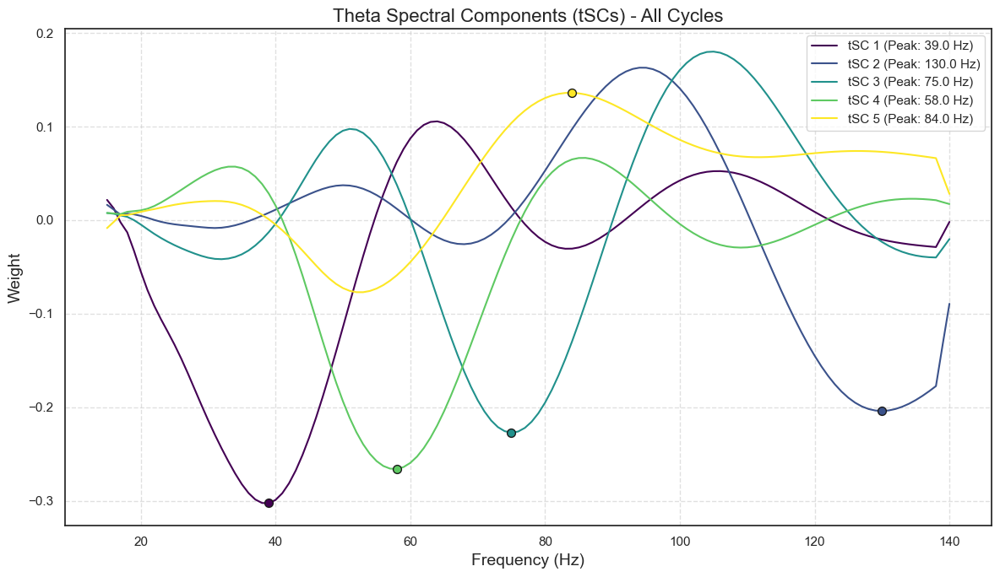


--- Step 4: Assigning components and calculating transitions ---

Component Composition:
  Component 1: 4083 phasic cycles, 73487 tonic cycles
  Component 2: 4149 phasic cycles, 71632 tonic cycles
  Component 3: 4496 phasic cycles, 75849 tonic cycles
  Component 4: 4713 phasic cycles, 86152 tonic cycles
  Component 5: 4279 phasic cycles, 88989 tonic cycles


In [13]:
frequencies = np.arange(15, 141, 1)

print("--- Step 1: Processing data ---")
phasic_sss_by_episode = extract_sss_by_episode(phasic_fpps)
tonic_sss_by_episode = extract_sss_by_episode(tonic_fpps)
combined_all_sss = np.concatenate(phasic_sss_by_episode + tonic_sss_by_episode, axis=0)

print("\n--- Step 2: Training global model ---")
n_components_pca = 5
pca_model, ica_model = train_global_ica_model(combined_all_sss, n_components_pca)
if ica_model is None: exit()

print("\n--- Step 3: Visualizing global components ---")
plot_ica_components(pca_model, ica_model, frequencies, "All Cycles", "spectral_components_combined.svg")

print("\n--- Step 4: Assigning components and calculating transitions ---")
phasic_sequences = get_component_sequences(phasic_sss_by_episode, pca_model, ica_model)
tonic_sequences = get_component_sequences(tonic_sss_by_episode, pca_model, ica_model)

print("\nComponent Composition:")
all_phasic_comps = np.concatenate(phasic_sequences) if phasic_sequences else np.array([])
all_tonic_comps = np.concatenate(tonic_sequences) if tonic_sequences else np.array([])
phasic_counts_counter = Counter(all_phasic_comps); tonic_counts_counter = Counter(all_tonic_comps)
phasic_node_counts = np.array([phasic_counts_counter.get(i, 0) for i in range(n_components_pca)])
tonic_node_counts = np.array([tonic_counts_counter.get(i, 0) for i in range(n_components_pca)])
for i in range(n_components_pca): print(f"  Component {i+1}: {phasic_node_counts[i]} phasic cycles, {tonic_node_counts[i]} tonic cycles")

In [14]:
all_cycles_count = 0
for i in range(n_components_pca):
    all_cycles_count += phasic_node_counts[i] + tonic_node_counts[i]
print(f"\nTotal cycles processed: {all_cycles_count} (Phasic: {np.sum(phasic_node_counts)}, Tonic: {np.sum(tonic_node_counts)})")
print(f"Precentage of Phasic Cycles: {np.sum(phasic_node_counts) / all_cycles_count * 100 if all_cycles_count > 0 else 0}")
print(f"Precentage of Tonic Cycles: {np.sum(tonic_node_counts) / all_cycles_count * 100 if all_cycles_count > 0 else 0}")



Total cycles processed: 417829 (Phasic: 21720, Tonic: 396109)
Precentage of Phasic Cycles: 5.198298825596117
Precentage of Tonic Cycles: 94.80170117440389


In [15]:
use_packs_for_nodes = False  # set True to size nodes by number of packs

if use_packs_for_nodes:
    phasic_node_counts = count_packs_per_component(phasic_sequences, n_components_pca)
    tonic_node_counts  = count_packs_per_component(tonic_sequences,  n_components_pca)
else:
    # your original cycle-based counts
    phasic_counts_counter = Counter(all_phasic_comps); tonic_counts_counter = Counter(all_tonic_comps)
    phasic_node_counts = np.array([phasic_counts_counter.get(i, 0) for i in range(n_components_pca)])
    tonic_node_counts  = np.array([tonic_counts_counter.get(i, 0) for i in range(n_components_pca)])

In [16]:
# --- Step 5: Calculating transition probabilities (pack-level) ---
phasic_transitions = calculate_transition_matrix(phasic_sequences, n_comp=n_components_pca, pack_transitions=True)
tonic_transitions  = calculate_transition_matrix(tonic_sequences,  n_comp=n_components_pca, pack_transitions=True)

phasic_row_sums = phasic_transitions.sum(axis=1, keepdims=True)
with np.errstate(divide='ignore', invalid='ignore'):
    phasic_prob_matrix = np.nan_to_num(phasic_transitions / phasic_row_sums)

tonic_row_sums = tonic_transitions.sum(axis=1, keepdims=True)
with np.errstate(divide='ignore', invalid='ignore'):
    tonic_prob_matrix  = np.nan_to_num(tonic_transitions / tonic_row_sums)

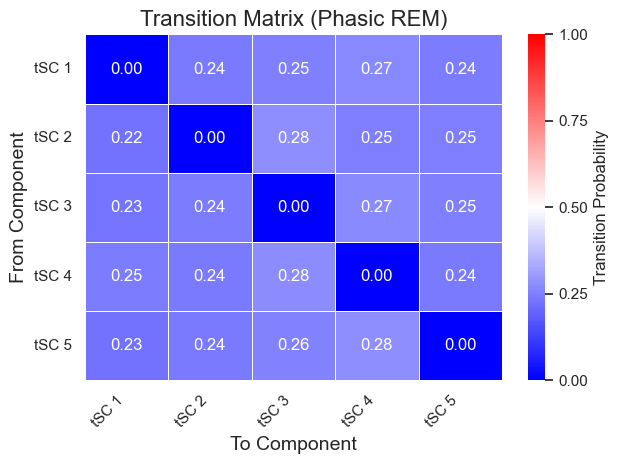

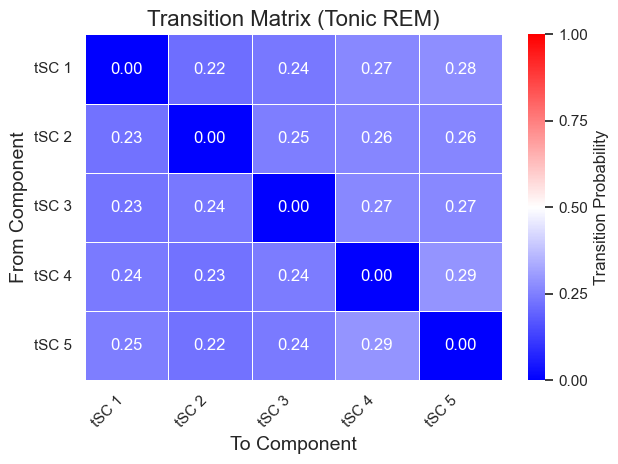

In [17]:
plot_transition_matrix(phasic_transitions, "Transition Matrix (Phasic REM)", "transition_matrix_phasic.svg")
plot_transition_matrix(tonic_transitions, "Transition Matrix (Tonic REM)", "transition_matrix_tonic.svg")


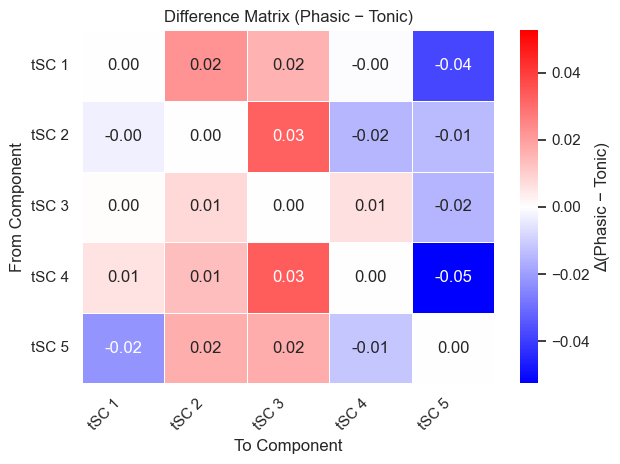

In [18]:
# ------------------------------------------------------------------
# --- NEW: Step 5-b  •  Difference between the two probability maps
# ------------------------------------------------------------------
diff_matrix = phasic_prob_matrix - tonic_prob_matrix     # Δ = Phasic − Tonic

def plot_difference_matrix(diff_mat, title, save_path):
    """Heat-map of Δ-probabilities with a diverging palette centred at 0."""
    import seaborn as sns, matplotlib.pyplot as plt
    from matplotlib.colors import TwoSlopeNorm

    max_abs = np.max(np.abs(diff_mat)) or 1          # symmetric colour limits
    norm = TwoSlopeNorm(vmin=-max_abs, vcenter=0, vmax=max_abs)

    ax = sns.heatmap(
        diff_mat,
        annot=diff_mat,
        fmt=".2f",
        cmap='bwr',
        norm=norm,
        linewidths=.5,
        cbar_kws={'label': 'Δ(Phasic − Tonic)'}
    )

    labels = [f'tSC {i+1}' for i in range(diff_mat.shape[0])]
    ax.set_xticklabels(labels, rotation=45, ha="right")
    ax.set_yticklabels(labels, rotation=0)

    ax.set_xlabel("To Component"); ax.set_ylabel("From Component")
    ax.set_title(title)
    plt.tight_layout(); plt.savefig(save_path, format='svg'); plt.show()

# ---- call it ------------------------------------------------------
plot_difference_matrix(
    diff_matrix,
    "Difference Matrix (Phasic − Tonic)",
    "transition_matrix_difference.svg"
)

In [19]:
# --- Verification: Check row sums ---
row_sums_prob = phasic_prob_matrix.sum(axis=1)
print("Row sums (should be ~1.0 each):", row_sums_prob)

# Check if they are very close to 1
if np.allclose(row_sums_prob, 1.0, atol=1e-8):
    print("✅ Row sums are correct.")
else:
    print("⚠ Row sums are off — check normalization.")

# --- Verification: Compare to raw counts ---
print("\nRaw transition counts (pack-level):")
print(phasic_transitions)

# Recompute probability matrix manually to cross-check
row_sums_counts = phasic_transitions.sum(axis=1, keepdims=True)
manual_prob_matrix = np.divide(phasic_transitions, row_sums_counts, where=row_sums_counts != 0)

print("\nDifference between computed and manual probability matrix (should be all ~0):")
print(phasic_prob_matrix - manual_prob_matrix)

Row sums (should be ~1.0 each): [1. 1. 1. 1. 1.]
✅ Row sums are correct.

Raw transition counts (pack-level):
[[  0 700 734 779 710]
 [684   0 860 763 759]
 [749 800   0 893 829]
 [805 783 907   0 788]
 [702 751 798 868   0]]

Difference between computed and manual probability matrix (should be all ~0):
[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]


In [20]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import FancyArrowPatch, Circle, PathPatch
from matplotlib.path import Path
from matplotlib import cm
import matplotlib.patheffects as pe

def _width_linear_clipped(p, lo, hi, wmin, wmax):
    p = np.clip(p, lo, hi)
    if hi <= lo + 1e-12:
        return (wmin + wmax) * 0.5
    return wmin + (p - lo) * (wmax - wmin) / (hi - lo)

def _quad_bezier_points(p0, p1, c, t):
    # point and tangent on quadratic Bézier at parameter t
    p0, p1, c = np.asarray(p0), np.asarray(p1), np.asarray(c)
    pt = (1-t)**2 * p0 + 2*(1-t)*t * c + t**2 * p1
    tan = 2*(1-t)*(c - p0) + 2*t*(p1 - c)
    return pt, tan

def plot_transition_clean_v3(
    prob_matrix,
    node_counts=None,
    labels=None,
    title="Pack-to-pack transitions",
    width_range=(1.5, 6.0),
    quantile_clip=(0.1, 0.9),
    lane_offset=0.28,          # controls how far the two lanes bend away from the chord
    label_t=0.75,              # where to place label along the curve (near the head)
    node_cmap="viridis",
    node_radius=0.11,
    node_label_pad=0.14,
    label_size=10,
    edge_color="#222",
    figsize=(8.2, 7.0),
    dpi=150,
    save_path=None
):
    """
    Two distinct Bézier arcs per pair (i→j and j→i), each with its own
    thickness and label near its arrowhead. Node titles sit outside the ring.
    """
    P = np.asarray(prob_matrix, dtype=float)
    N = P.shape[0]
    assert P.shape[1] == N

    if labels is None:
        labels = [f"tSC {i+1}" for i in range(N)]

    if node_counts is None:
        node_counts = np.ones(N)
    node_counts = np.asarray(node_counts, float)

    # circular layout
    ang = np.linspace(0, 2*np.pi, N, endpoint=False)
    R = 1.0
    pos = np.c_[R*np.cos(ang), R*np.sin(ang)]

    # width scaling (linear with clipping)
    pvals = P[~np.eye(N, dtype=bool)].ravel()
    qlo = float(np.quantile(pvals, quantile_clip[0]))
    qhi = float(np.quantile(pvals, quantile_clip[1]))
    wmin, wmax = width_range

    fig, ax = plt.subplots(figsize=figsize, dpi=dpi)
    ax.set_aspect("equal"); ax.axis("off")

    # ---- draw edges first (so nodes/labels on top) ----
    for i in range(N):
        for j in range(i+1, N):
            p0 = pos[i]; p1 = pos[j]
            # chord direction and a unit normal
            d = p1 - p0
            n = np.array([-d[1], d[0]])
            n /= (np.linalg.norm(n) + 1e-12)
            # control points on opposite sides
            c_ij = (p0 + p1)/2 + lane_offset * n     # i→j lane (one side)
            c_ji = (p0 + p1)/2 - lane_offset * n     # j→i lane (other side)

            # widths
            wij = _width_linear_clipped(P[i, j], qlo, qhi, wmin, wmax)
            wji = _width_linear_clipped(P[j, i], qlo, qhi, wmin, wmax)

            # --- i → j lane ---
            verts_ij = [tuple(p0), tuple(c_ij), tuple(p1)]
            codes = [Path.MOVETO, Path.CURVE3, Path.CURVE3]
            path_ij = Path(verts_ij, codes)
            arr_ij = FancyArrowPatch(
                path=path_ij, arrowstyle="-|>", mutation_scale=10 + 2*wij,
                lw=wij, color=edge_color, alpha=0.95, zorder=2,
                capstyle="round", joinstyle="round",
                shrinkA=12, shrinkB=12
            )
            ax.add_patch(arr_ij)

            # label near the head of i→j
            lab_pt, lab_tan = _quad_bezier_points(p0, p1, c_ij, label_t)
            # lift label slightly left of the curve normal for readability
            lab_n = np.array([-lab_tan[1], lab_tan[0]])
            lab_n /= (np.linalg.norm(lab_n) + 1e-12)
            lp = lab_pt + 0.06 * lab_n
            txt = ax.text(lp[0], lp[1], f"{P[i, j]:.2f}",
                          ha="center", va="center", fontsize=label_size, color="#111", zorder=5)
            txt.set_path_effects([pe.withStroke(linewidth=3.5, foreground="white")])

            # --- j → i lane ---
            verts_ji = [tuple(p1), tuple(c_ji), tuple(p0)]
            path_ji = Path(verts_ji, codes)
            arr_ji = FancyArrowPatch(
                path=path_ji, arrowstyle="-|>", mutation_scale=10 + 2*wji,
                lw=wji, color=edge_color, alpha=0.95, zorder=2,
                capstyle="round", joinstyle="round",
                shrinkA=12, shrinkB=12
            )
            ax.add_patch(arr_ji)

            # label near the head of j→i
            lab_pt2, lab_tan2 = _quad_bezier_points(p1, p0, c_ji, label_t)
            lab_n2 = np.array([-lab_tan2[1], lab_tan2[0]])
            lab_n2 /= (np.linalg.norm(lab_n2) + 1e-12)
            lp2 = lab_pt2 + 0.06 * lab_n2
            txt2 = ax.text(lp2[0], lp2[1], f"{P[j, i]:.2f}",
                           ha="center", va="center", fontsize=label_size, color="#111", zorder=5)
            txt2.set_path_effects([pe.withStroke(linewidth=3.5, foreground="white")])

    # ---- draw nodes + outside titles on top ----
    cmap = cm.get_cmap(node_cmap, N)
    for k in range(N):
        x, y = pos[k]
        ax.add_patch(Circle((x, y), node_radius,
                            facecolor=cmap(k / max(N-1, 1)),
                            edgecolor="#222", linewidth=2, zorder=6))
    for k, theta in enumerate(ang):
        r_lab = R + node_radius + node_label_pad
        lx, ly = r_lab*np.cos(theta), r_lab*np.sin(theta)
        ha = "left"  if np.cos(theta) >  0.35 else ("right" if np.cos(theta) < -0.35 else "center")
        va = "bottom" if np.sin(theta) >  0.35 else ("top"   if np.sin(theta) < -0.35 else "center")
        t = ax.text(lx, ly, labels[k], ha=ha, va=va, fontsize=11, weight="medium",
                    color="#111", zorder=7)
        t.set_path_effects([pe.withStroke(linewidth=3.5, foreground="white")])

    ax.set_title(title, fontsize=16, weight="bold", pad=12)
    ax.text(0.02, 0.02,
            f"width {wmin:.1f}–{wmax:.1f} (linear, clipped to [{qlo:.2f},{qhi:.2f}]); "
            f"lane_offset={lane_offset}",
            transform=ax.transAxes, fontsize=8, color="#555")

    lim = 1.75
    ax.set_xlim(-lim, lim); ax.set_ylim(-lim, lim)

    if save_path:
        fig.savefig(save_path, bbox_inches="tight")
    return fig, ax

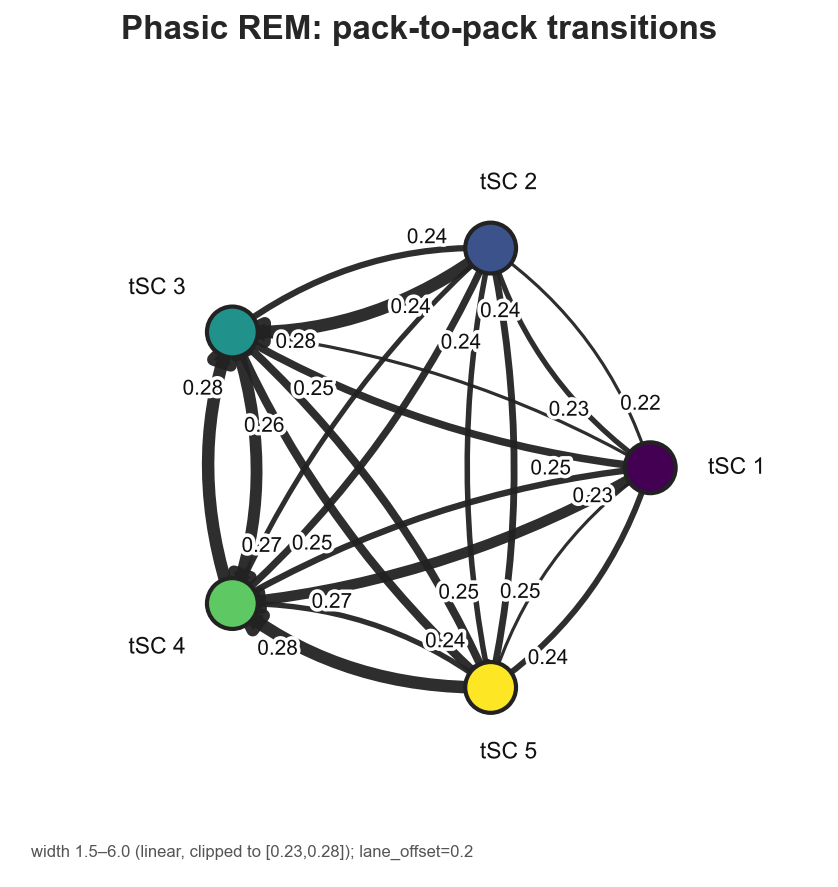

In [49]:
labels = [f"tSC {i+1}" for i in range(n_components_pca)]
fig, ax = plot_transition_clean_v3(
    phasic_prob_matrix,
    node_counts=phasic_node_counts,
    labels=labels,
    title="Phasic REM: pack-to-pack transitions",
    width_range=(1.5, 6.0),
    quantile_clip=(0.1, 0.9),
    lane_offset=0.20,   # ↑ for more separation between the two directions
    label_t=0.78,       # move labels closer to the head if you’d like
    save_path="phasic_transitions_clean_v3.svg"
)
plt.show()

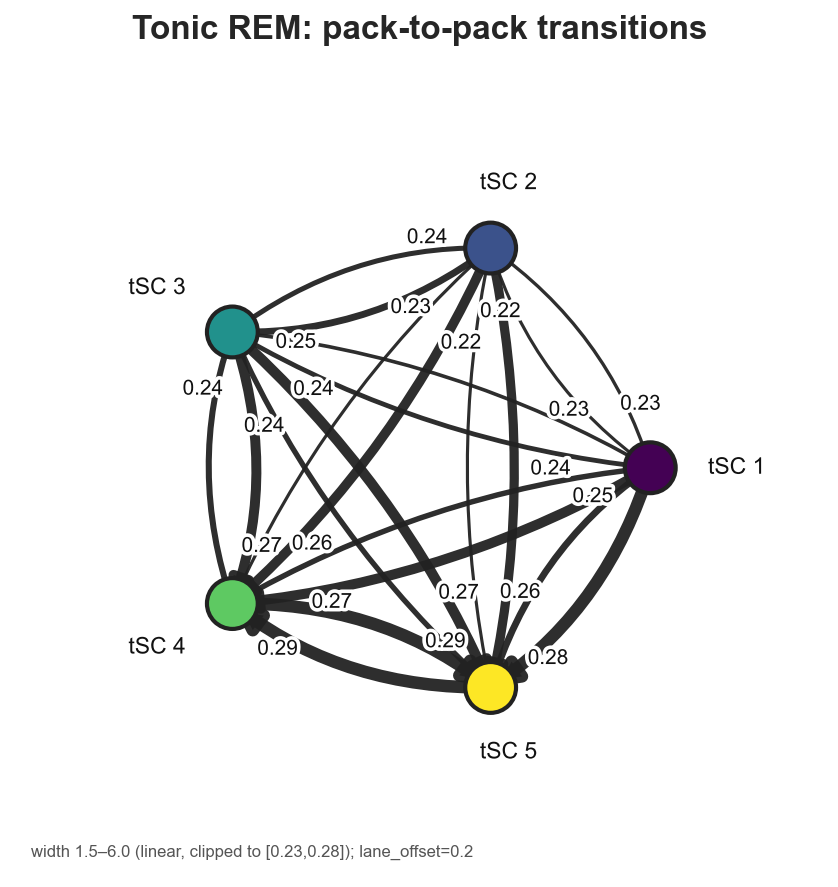

In [21]:
labels = [f"tSC {i+1}" for i in range(n_components_pca)]
fig, ax = plot_transition_clean_v3(
    tonic_prob_matrix,
    node_counts=tonic_node_counts,
    labels=labels,
    title="Tonic REM: pack-to-pack transitions",
    width_range=(1.5, 6.0),
    quantile_clip=(0.1, 0.9),
    lane_offset=0.20,   # ↑ for more separation between the two directions
    label_t=0.78,       # move labels closer to the head if you’d like
    save_path="tonic_transitions_clean_v3.svg"
)
plt.show()